- regular bayes between 100-1000
- kappa now float
- trade only on state shifts

In [2]:
# General
import numpy as np
import pandas as pd
import os, sys
import optuna

# For data prep and pre-processing
from jumpmodels.utils import filter_date_range 
from jumpmodels.preprocess import StandardScalerPD, DataClipperStd
from sklearn.preprocessing import StandardScaler

# For model fit and prediction
from joblib import Parallel, delayed # allows parallel grid search on all 4 cores
from jumpmodels.sparse_jump import SparseJumpModel

# For plotting
from jumpmodels.plot import plot_regimes_and_cumret, plot_cumret
import matplotlib.pyplot as plt
import matplotlib as mpl    
mpl.rcParams["text.usetex"] = False


# Portfolio allocation
from pypfopt.black_litterman import BlackLittermanModel
from pypfopt.efficient_frontier import EfficientFrontier

sys.path.append('/Users/victor/Documents/thesis_vri_vp/vic_new')         # for mac
#sys.path.append('C:\\Users\\victo\\git_new\\thesis_vri_vp\\vic_new')      # for windows
from feature_set_v2 import MergedDataLoader 




In [ ]:
# ---------------------------------------------------------------------
# 1) Purged/embargoed window function
# ---------------------------------------------------------------------
def get_train_val_windows(
        current_date, 
        full_data, 
        min_train_years=8,
        max_train_years=12, 
        val_years=3,
        initial_train_start=None,
        gap_days=3                                      # gap_days: number of days to exclude at the train/validation boundary (purge/embargo) to avoid look‑ahead; set to 0 to disable
    ):
    # 1) Validation window
    val_end   = current_date
    val_start = val_end - pd.DateOffset(years=val_years)
    
    # 2) Train ends just before validation
    train_end = val_start - pd.DateOffset(days=1)
    
    # 3) Max‐length training start
    train_start_candidate = train_end - pd.DateOffset(years=max_train_years)
    if initial_train_start is not None:
        earliest = pd.to_datetime(initial_train_start)
        train_start_candidate = max(train_start_candidate, earliest)
    
    # 4) Enforce min‐length
    if (train_end - train_start_candidate) < pd.Timedelta(days=365.25 * min_train_years):
        train_start_candidate = train_end - pd.DateOffset(years=min_train_years)
        if initial_train_start is not None:
            train_start_candidate = max(train_start_candidate, earliest)
    
    idx       = full_data.index
    train_idx = idx[(idx >= train_start_candidate) & (idx <= train_end)]
    val_idx   = idx[(idx >= val_start)           & (idx <= val_end)]
    
    # 5) Purge/embargo
    if gap_days > 0:
        if len(train_idx) > gap_days:
            train_idx = train_idx[:-gap_days]
        if len(val_idx)   > gap_days:
            val_idx   = val_idx[gap_days:]
    
    if train_idx.empty or val_idx.empty:
        raise ValueError(
            f"No data for train [{train_start_candidate.date()}-{train_end.date()}] "
            f"or val [{val_start.date()}-{val_end.date()}] after {gap_days}-day gap"
        )
    
    return train_idx[0], train_idx[-1], val_idx[0], val_idx[-1]


# ---------------------------------------------------------------------
# 2) Optuna objective & wrapper
# ---------------------------------------------------------------------
# 1) New evaluator that fits one model & returns Sharpe:
# ------------------------------------------------------------------
# Trade-only-at-state-shift evaluator
def evaluate_sjm_sharpe(
    lam, kappa,
    X_tr_s, X_vl_s,
    ar_tr, ar_vl,
    cost_per_100pct, annual_threshold
):
    model = SparseJumpModel(
        n_components=2,
        max_feats=int(kappa**2),
        jump_penalty=lam,
        cont=False,
        max_iter=30
    )
    model.fit(X_tr_s, ret_ser=ar_tr, sort_by="cumret")

    # 1) Online state predictions
    val_states = model.predict_online(X_vl_s)

    # 2) Flag re-hedge days  – True where *state* flips vs. yesterday
    shift = val_states.ne(val_states.shift()).fillna(True)

    # 3) P&L with trades **only** on those days
    pnl = np.zeros(len(val_states))
    prev_pos = 0.0
    for t, st in enumerate(val_states):
        if shift.iloc[t]:                         # rebalance
            exp_ann = model.ret_[st] * 252
            if   exp_ann >  annual_threshold: pos =  1.0
            elif exp_ann < -annual_threshold: pos = -1.0
            else:                                 pos = exp_ann / annual_threshold
        else:                                     # carry position
            pos = prev_pos

        pnl[t] = prev_pos * ar_vl.iloc[t] - abs(pos - prev_pos) * cost_per_100pct
        prev_pos = pos

    sharpe = pnl.mean() / pnl.std(ddof=1) * np.sqrt(252)
    return sharpe


# 2) Rewrite your Optuna objective to use it:
def optuna_objective(
    trial,
    X_tr_s, X_vl_s,
    ar_tr, ar_vl,
    cost_per_100pct, annual_threshold
):
    lam   = trial.suggest_float("lambda", 10**2, 10**3)
    kappa = trial.suggest_float("kappa", 1, np.sqrt(17))
    return evaluate_sjm_sharpe(
        lam, kappa,
        X_tr_s, X_vl_s,
        ar_tr, ar_vl,
        cost_per_100pct, annual_threshold
    )

# 3) In your Bayesian wrapper, return the study:
def bayesian_hyperparam_search(
    X_tr_s, X_vl_s,
    ar_tr, ar_vl,
    cost_per_100pct=0.0007,
    annual_threshold=0.05,
    n_trials=30
):
    study = optuna.create_study(sampler=optuna.samplers.TPESampler(seed=42), direction="maximize")
    study.optimize(
        lambda t: optuna_objective(
            t, X_tr_s, X_vl_s, ar_tr, ar_vl,
            cost_per_100pct, annual_threshold
        ),
        n_trials=n_trials
    )
    return study


# ---------------------------------------------------------------------
# 3) Rolling CV + final‑model fit using Optuna
# ---------------------------------------------------------------------
def rolling_time_series_cv_sjm_long_short_optimized(
    X_train, X_val,
    factor_returns_train, factor_returns_val,
    market_returns_train, market_returns_val,
    cost_per_100pct=0.0007,
    annual_threshold=0.05,
    n_trials=30
):
    # --- align indices & build active returns ---
    tr_idx = X_train.index.intersection(factor_returns_train.index).intersection(market_returns_train.index)
    vl_idx = X_val.index.intersection(factor_returns_val.index).intersection(market_returns_val.index)
    
    X_tr = X_train.loc[tr_idx]
    X_vl = X_val.loc[vl_idx]
    ar_tr = factor_returns_train.loc[tr_idx] - market_returns_train.loc[tr_idx]
    ar_vl = factor_returns_val.loc[vl_idx]     - market_returns_val.loc[vl_idx]
    
    # --- preprocess ---
    clipper = DataClipperStd(mul=3.0)
    scaler  = StandardScaler()
    
    X_tr_s = pd.DataFrame(
        scaler.fit_transform(clipper.fit_transform(X_tr)),
        index=X_tr.index, columns=X_tr.columns
    )
    X_vl_s = pd.DataFrame(
        scaler.transform(clipper.transform(X_vl)),
        index=X_vl.index, columns=X_vl.columns
    )
    
    # --- Bayesian search ---
    study = bayesian_hyperparam_search(
        X_tr_s, X_vl_s, ar_tr, ar_vl,
        cost_per_100pct, annual_threshold,
        n_trials
    )
    lam, kappa = study.best_params["lambda"], study.best_params["kappa"]
    best_sharpe = study.best_value
    print(f"Optuna best λ={lam:.4f}, κ={kappa}, Sharpe={best_sharpe:.4f}")
    
    # --- fit final SJM on the full train window ---
    model = SparseJumpModel(
        n_components=2,
        max_feats=int(kappa**2),
        jump_penalty=lam,
        cont=False,
        max_iter=30
    )
    model.fit(X_tr_s, ret_ser=ar_tr, sort_by="cumret")
    
    return {
        "best_lambda": lam,
        "best_kappa":  kappa,
        "best_sharpe": best_sharpe,
        "best_model":  model,
        "results_array": None,
        "study": study
    }

In [ ]:
# ---------------------------------------------------------------------
# 4) Updated cross‑validation module (run_cv)
# ---------------------------------------------------------------------
def run_cv(
    factors,
    factor_data_dict,
    cv_dates,
    *,
    min_train_years=8,
    max_train_years=12,
    val_years=3,
    initial_train_start=None,
    save_path="0505_7bps_100-1000_tradeshift.parquet",
    make_plots=True,
    cost_per_100pct=0.0007,
    annual_threshold=0.05,
    n_trials=30
):
    records = []
    evolution_plotbuf = []

    for cv_end in cv_dates:
        for fac in factors:
            X       = factor_data_dict[fac]["X"]
            fac_ret = factor_data_dict[fac]["fac_ret"]
            mkt_ret = factor_data_dict[fac]["mkt_ret"]

            # get purged train/val windows
            train_start, train_end, val_start, val_end = get_train_val_windows(
                cv_end, X,
                min_train_years=min_train_years,
                max_train_years=max_train_years,
                val_years=val_years,
                initial_train_start=initial_train_start,
                gap_days=3
            )

            # slice data
            X_train  = filter_date_range(X, train_start, train_end)
            X_val    = filter_date_range(X, val_start,   val_end)
            fr_train = filter_date_range(fac_ret, train_start, train_end)
            fr_val   = filter_date_range(fac_ret, val_start,   val_end)
            mr_train = filter_date_range(mkt_ret, train_start, train_end)
            mr_val   = filter_date_range(mkt_ret, val_start,   val_end)

            # run Optuna‐powered CV
            res = rolling_time_series_cv_sjm_long_short_optimized(
                X_train=X_train,
                X_val=X_val,
                factor_returns_train=fr_train,
                factor_returns_val=fr_val,
                market_returns_train=mr_train,
                market_returns_val=mr_val,
                cost_per_100pct=cost_per_100pct,
                annual_threshold=annual_threshold,
                n_trials=n_trials
            )

            # store results
            records.append({
                "date": cv_end,
                "factor": fac,
                "best_lambda": res["best_lambda"],
                "best_kappa":  res["best_kappa"]
            })
            evolution_plotbuf.append({
                "date": cv_end,
                "factor": fac,
                "lambda": res["best_lambda"],
                "kappa":  res["best_kappa"]
            })

            # per‐fold Optuna scatter plot
            if make_plots:
                trials = res["study"].trials
                df_t = pd.DataFrame([
                    {"lambda": t.params["lambda"],
                     "kappa":  t.params["kappa"],
                     "value":  t.value}
                    for t in trials
                ])
                plt.figure(figsize=(8,5))
                sc = plt.scatter(
                    df_t["lambda"],
                    df_t["value"],
                    c=df_t["kappa"].astype(float),
                    cmap="viridis",
                    alpha=0.8
                )
                plt.xscale("log")
                plt.axvline(res["best_lambda"], ls="--", c="r", alpha=0.6)
                plt.colorbar(sc, label='$\\kappa$')
                plt.xlabel("'$\\lambda$' (log scale)")
                plt.ylabel("Validation Sharpe")
                plt.title(f"{fac} | CV cutoff {cv_end.date()} - Optuna trials")
                plt.grid(True, ls=":")
                plt.tight_layout()
                plt.show()

    # assemble and save
    cv_df = pd.DataFrame(records).sort_values(["factor", "date"])
    if save_path:
        cv_df.to_parquet(save_path)

    # overall λ/κ evolution
    if make_plots:
        evo = pd.DataFrame(evolution_plotbuf)
        for fac in factors:
            sub = evo[evo["factor"] == fac].sort_values("date")
            fig, ax1 = plt.subplots(figsize=(9,5))
            ax1.plot(sub["date"], sub["lambda"], marker="o", label='$\\lambda$')
            ax1.set_ylabel('$\\lambda$', color="tab:blue")
            ax1.tick_params(axis='y', labelcolor='tab:blue')
            ax2 = ax1.twinx()
            ax2.plot(sub["date"], sub["kappa"], marker="x", ls="--", color="tab:red", label='$\\kappa$')
            ax2.set_ylabel('$\\kappa$', color="tab:red")
            ax2.tick_params(axis='y', labelcolor='tab:red')
            ax1.set_xlabel("CV end-date")
            ax1.set_title(f"{fac} — hyperparameter evolution")
            ax1.grid(True, ls=":")
            ax1.legend(loc="upper left")
            ax2.legend(loc="upper right")
            plt.tight_layout()
            plt.show()

    return cv_df


[I 2025-05-05 18:37:22,147] A new study created in memory with name: no-name-6826a428-632a-4f16-a665-17b209ca3e4e
[I 2025-05-05 18:37:23,777] Trial 0 finished with value: -0.8833865875805678 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: -0.8833865875805678.
[I 2025-05-05 18:37:24,095] Trial 1 finished with value: -0.8833865875805678 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: -0.8833865875805678.
[I 2025-05-05 18:37:24,943] Trial 2 finished with value: -0.8833865875805675 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 2 with value: -0.8833865875805675.
[I 2025-05-05 18:37:27,725] Trial 3 finished with value: -0.8294486081459537 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 3 with value: -0.8294486081459537.
[I 2025-05-05 18:37:29,183] Trial 4 finished with value: -0.8833865875805678 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is 

Optuna best λ=191.1508, κ=4, Sharpe=-0.4142


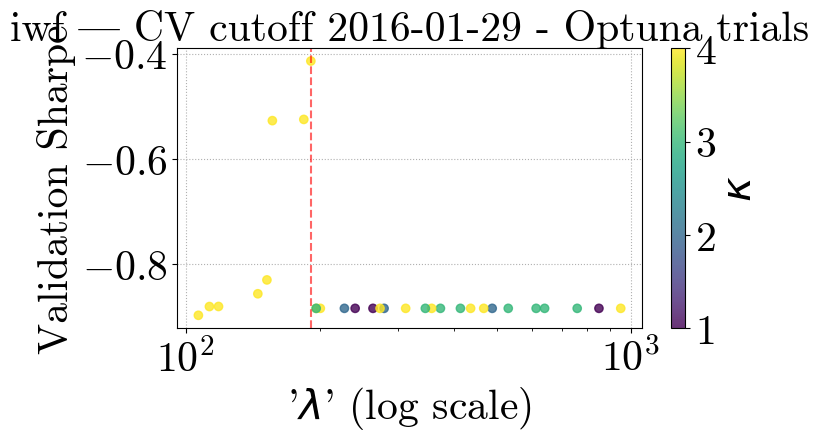

[I 2025-05-05 18:38:22,861] A new study created in memory with name: no-name-8e1c94ff-e977-45b3-a77a-af5a3b49aa16
[I 2025-05-05 18:38:24,192] Trial 0 finished with value: 1.5238071745889652 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: 1.5238071745889652.
[I 2025-05-05 18:38:25,476] Trial 1 finished with value: 1.5238071745889652 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: 1.5238071745889652.
[I 2025-05-05 18:38:26,332] Trial 2 finished with value: 1.523807174588965 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 0 with value: 1.5238071745889652.
[I 2025-05-05 18:38:28,925] Trial 3 finished with value: 1.4527249871696846 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 0 with value: 1.5238071745889652.
[I 2025-05-05 18:38:30,280] Trial 4 finished with value: 1.5238071745889652 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is trial 0 wi

Optuna best λ=118.5260, κ=4, Sharpe=1.5705


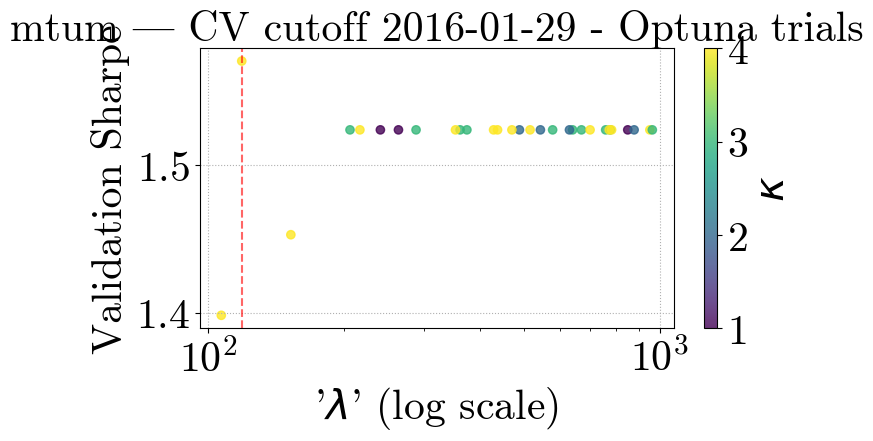

[I 2025-05-05 18:39:08,964] A new study created in memory with name: no-name-cd7bf189-48ff-4b49-af46-bb22bf01142b
[I 2025-05-05 18:39:10,205] Trial 0 finished with value: -1.3030668994684087 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: -1.3030668994684087.
[I 2025-05-05 18:39:11,294] Trial 1 finished with value: -1.3030668994684087 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: -1.3030668994684087.
[I 2025-05-05 18:39:12,306] Trial 2 finished with value: -0.006802118350749262 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 2 with value: -0.006802118350749262.
[I 2025-05-05 18:39:14,192] Trial 3 finished with value: -0.1311605408312719 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 2 with value: -0.006802118350749262.
[I 2025-05-05 18:39:15,357] Trial 4 finished with value: -1.3030668994684087 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Be

Optuna best λ=849.1984, κ=1, Sharpe=1.2841


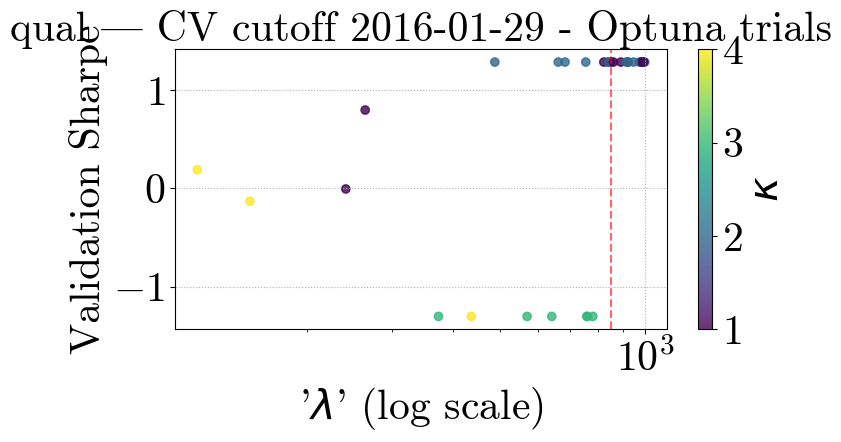

[I 2025-05-05 18:39:47,357] A new study created in memory with name: no-name-e8399f48-a54b-4fae-9dcf-8e3c4e3bf5a6
[I 2025-05-05 18:39:48,500] Trial 0 finished with value: -0.5232170393961455 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: -0.5232170393961455.
[I 2025-05-05 18:39:50,350] Trial 1 finished with value: -0.5232170393961456 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: -0.5232170393961455.
[I 2025-05-05 18:39:51,258] Trial 2 finished with value: -0.5232170393961457 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 0 with value: -0.5232170393961455.
[I 2025-05-05 18:39:53,509] Trial 3 finished with value: -0.11883781632220988 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 3 with value: -0.11883781632220988.
[I 2025-05-05 18:39:55,287] Trial 4 finished with value: -0.5232170393961456 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best i

Optuna best λ=169.6267, κ=4, Sharpe=0.0136


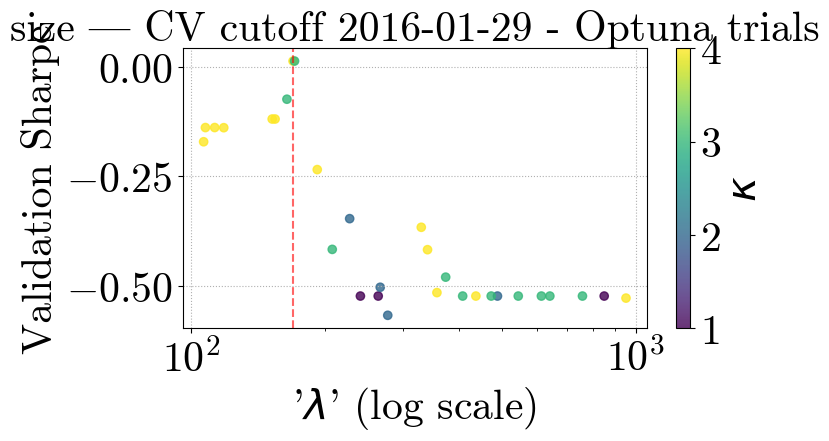

[I 2025-05-05 18:41:10,497] A new study created in memory with name: no-name-c6473efe-c29a-4eb0-b902-850653c8e96b
[I 2025-05-05 18:41:12,959] Trial 0 finished with value: -0.5977573919826558 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: -0.5977573919826558.
[I 2025-05-05 18:41:15,468] Trial 1 finished with value: -0.6836738039592097 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: -0.5977573919826558.
[I 2025-05-05 18:41:16,820] Trial 2 finished with value: -0.5977573919826559 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 0 with value: -0.5977573919826558.
[I 2025-05-05 18:41:20,167] Trial 3 finished with value: -0.4460195048504032 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 3 with value: -0.4460195048504032.
[I 2025-05-05 18:41:21,948] Trial 4 finished with value: -0.5977573919826559 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is 

Optuna best λ=106.7926, κ=4, Sharpe=0.0760


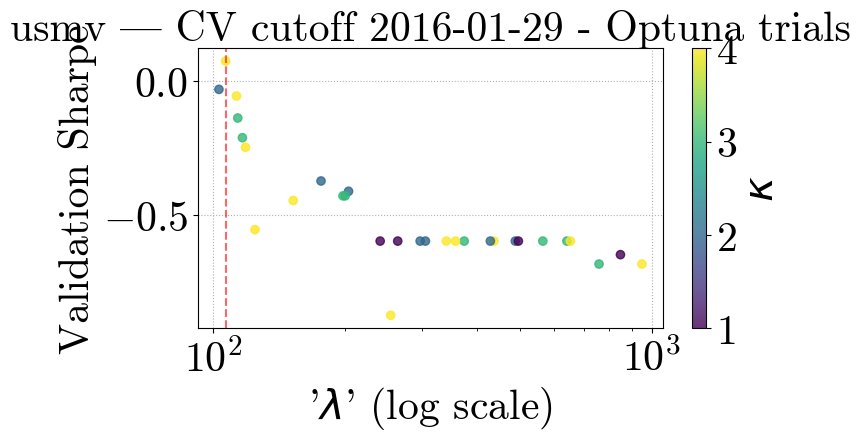

[I 2025-05-05 18:42:35,563] A new study created in memory with name: no-name-e0f0e2e4-b713-430f-b666-0aacabbff653
[I 2025-05-05 18:42:38,526] Trial 0 finished with value: 1.143911025787264 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: 1.143911025787264.
[I 2025-05-05 18:42:40,143] Trial 1 finished with value: 0.27184953791463334 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: 1.143911025787264.
[I 2025-05-05 18:42:41,747] Trial 2 finished with value: 1.2150636427761148 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 2 with value: 1.2150636427761148.
[I 2025-05-05 18:42:44,244] Trial 3 finished with value: 1.0823795672659835 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 2 with value: 1.2150636427761148.
[I 2025-05-05 18:42:46,095] Trial 4 finished with value: 0.6514012913789804 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is trial 2 wit

Optuna best λ=184.2570, κ=2, Sharpe=1.3083


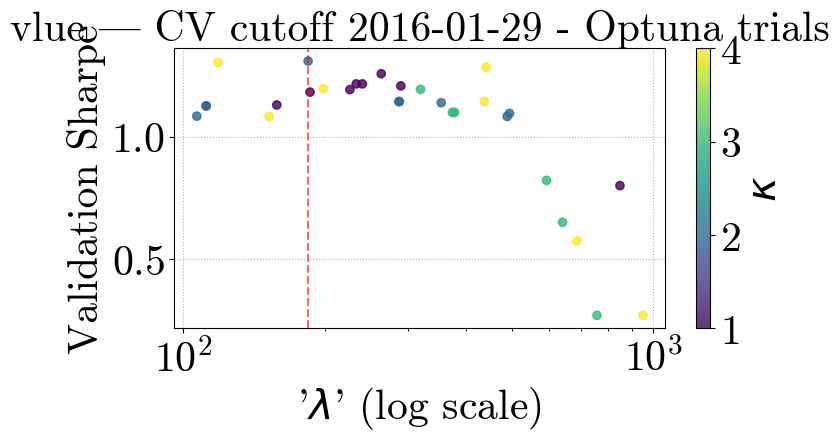

[I 2025-05-05 18:43:48,056] A new study created in memory with name: no-name-cc52d5ae-dd10-4074-8505-7243aea9c29b
[I 2025-05-05 18:43:52,200] Trial 0 finished with value: -0.730563987147049 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: -0.730563987147049.
[I 2025-05-05 18:43:54,643] Trial 1 finished with value: -0.730563987147049 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: -0.730563987147049.
[I 2025-05-05 18:43:56,223] Trial 2 finished with value: 0.1020678069134585 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 2 with value: 0.1020678069134585.
[I 2025-05-05 18:44:00,560] Trial 3 finished with value: -0.6279977681059193 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 2 with value: 0.1020678069134585.
[I 2025-05-05 18:44:04,205] Trial 4 finished with value: -0.730563987147049 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is trial 2 

Optuna best λ=240.4168, κ=1, Sharpe=0.1021


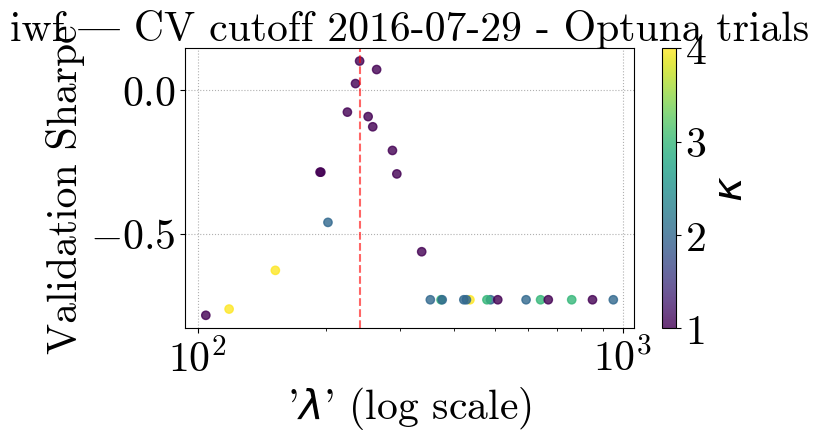

[I 2025-05-05 18:45:05,133] A new study created in memory with name: no-name-99b401b0-bcc3-4c7d-b5b9-4fc6157761c6
[I 2025-05-05 18:45:07,774] Trial 0 finished with value: 1.1761137233486407 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: 1.1761137233486407.
[I 2025-05-05 18:45:12,112] Trial 1 finished with value: 1.1761137233486407 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: 1.1761137233486407.
[I 2025-05-05 18:45:13,630] Trial 2 finished with value: 1.2210706451344155 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 2 with value: 1.2210706451344155.
[I 2025-05-05 18:45:17,458] Trial 3 finished with value: 1.2804431254290012 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 3 with value: 1.2804431254290012.
[I 2025-05-05 18:45:20,007] Trial 4 finished with value: 1.1761137233486407 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is trial 3 w

Optuna best λ=133.6842, κ=4, Sharpe=1.6561


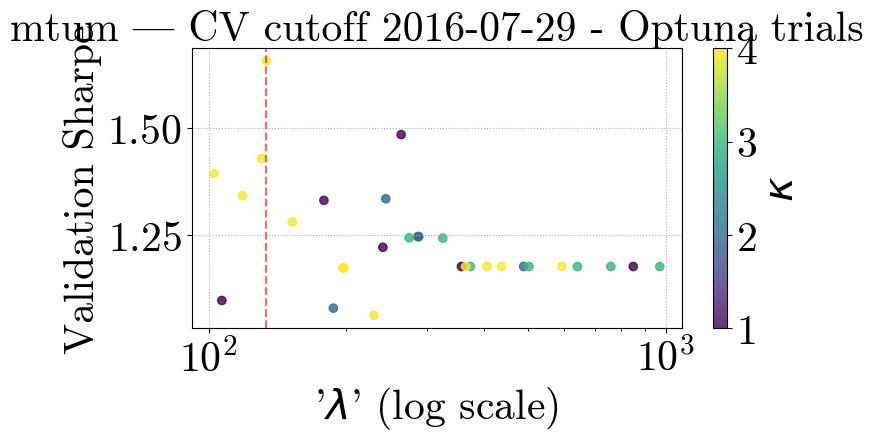

[I 2025-05-05 18:46:29,637] A new study created in memory with name: no-name-233f5d06-2711-4b48-9896-a39f8858088f
[I 2025-05-05 18:46:31,655] Trial 0 finished with value: -1.003270615272709 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: -1.003270615272709.
[I 2025-05-05 18:46:33,786] Trial 1 finished with value: -1.003270615272709 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: -1.003270615272709.
[I 2025-05-05 18:46:35,474] Trial 2 finished with value: 0.17845887623544476 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 2 with value: 0.17845887623544476.
[I 2025-05-05 18:46:38,476] Trial 3 finished with value: 0.13424411340051665 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 2 with value: 0.17845887623544476.
[I 2025-05-05 18:46:40,615] Trial 4 finished with value: -1.003270615272709 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is trial

Optuna best λ=849.1984, κ=1, Sharpe=0.9853


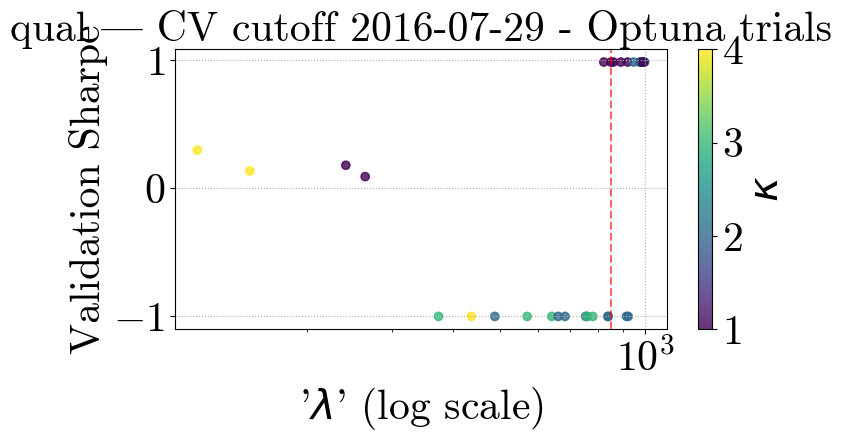

[I 2025-05-05 18:47:26,964] A new study created in memory with name: no-name-f762b2b5-07ec-44c9-b85c-0c04e00101c3
[I 2025-05-05 18:47:29,547] Trial 0 finished with value: -0.3232394253451738 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: -0.3232394253451738.
[I 2025-05-05 18:47:32,110] Trial 1 finished with value: -0.45440626720794997 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: -0.3232394253451738.
[I 2025-05-05 18:47:33,652] Trial 2 finished with value: -0.4544062672079501 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 0 with value: -0.3232394253451738.
[I 2025-05-05 18:47:38,885] Trial 3 finished with value: 0.08793222802465989 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 3 with value: 0.08793222802465989.
[I 2025-05-05 18:47:42,043] Trial 4 finished with value: -0.45440626720794997 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best i

Optuna best λ=164.8054, κ=4, Sharpe=0.0922


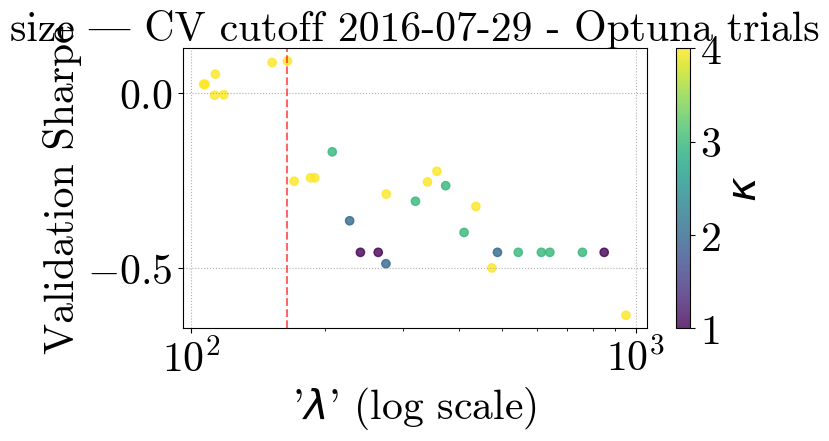

[I 2025-05-05 18:49:12,352] A new study created in memory with name: no-name-7a77b56f-7257-432c-b0f3-7399aff4a1b3
[I 2025-05-05 18:49:14,842] Trial 0 finished with value: -0.6393517814509033 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: -0.6393517814509033.
[I 2025-05-05 18:49:17,359] Trial 1 finished with value: -0.1120086532344493 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 1 with value: -0.1120086532344493.
[I 2025-05-05 18:49:19,011] Trial 2 finished with value: -1.0725463028556492 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 1 with value: -0.1120086532344493.
[I 2025-05-05 18:49:22,760] Trial 3 finished with value: -0.2511959902807573 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 1 with value: -0.1120086532344493.
[I 2025-05-05 18:49:25,402] Trial 4 finished with value: -0.6393517814509033 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is 

Optuna best λ=118.5260, κ=4, Sharpe=0.1312


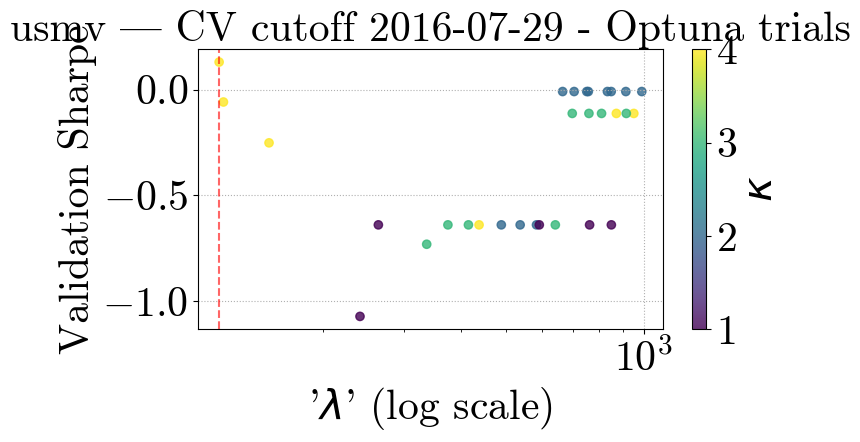

[I 2025-05-05 18:50:27,514] A new study created in memory with name: no-name-1a04bfce-01df-4721-bfdd-1b6541b286c3
[I 2025-05-05 18:50:31,064] Trial 0 finished with value: 0.2419735532868501 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: 0.2419735532868501.
[I 2025-05-05 18:50:34,317] Trial 1 finished with value: -0.06443852255193727 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: 0.2419735532868501.
[I 2025-05-05 18:50:36,134] Trial 2 finished with value: 0.17089456819208626 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 0 with value: 0.2419735532868501.
[I 2025-05-05 18:50:39,688] Trial 3 finished with value: 0.42593709250284584 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 3 with value: 0.42593709250284584.
[I 2025-05-05 18:50:43,435] Trial 4 finished with value: 0.08344521121844273 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is tri

Optuna best λ=380.2108, κ=2, Sharpe=0.6591


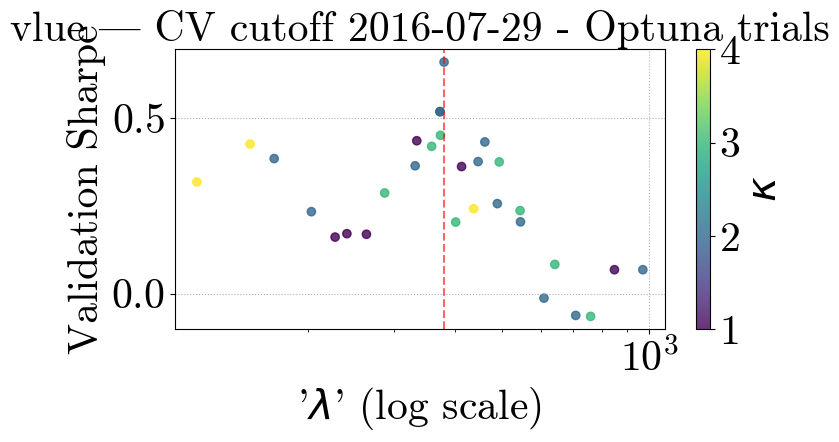

[I 2025-05-05 18:52:00,331] A new study created in memory with name: no-name-a8c434b2-5c14-4633-9eb7-d0a4c56abec3
[I 2025-05-05 18:52:04,231] Trial 0 finished with value: -0.16990143423043375 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: -0.16990143423043375.
[I 2025-05-05 18:52:07,362] Trial 1 finished with value: -0.16990143423043375 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: -0.16990143423043375.
[I 2025-05-05 18:52:08,667] Trial 2 finished with value: 0.9340796926487331 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 2 with value: 0.9340796926487331.
[I 2025-05-05 18:52:12,243] Trial 3 finished with value: -0.12320658615127834 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 2 with value: 0.9340796926487331.
[I 2025-05-05 18:52:15,134] Trial 4 finished with value: -0.16990143423043375 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best 

Optuna best λ=240.4168, κ=1, Sharpe=0.9341


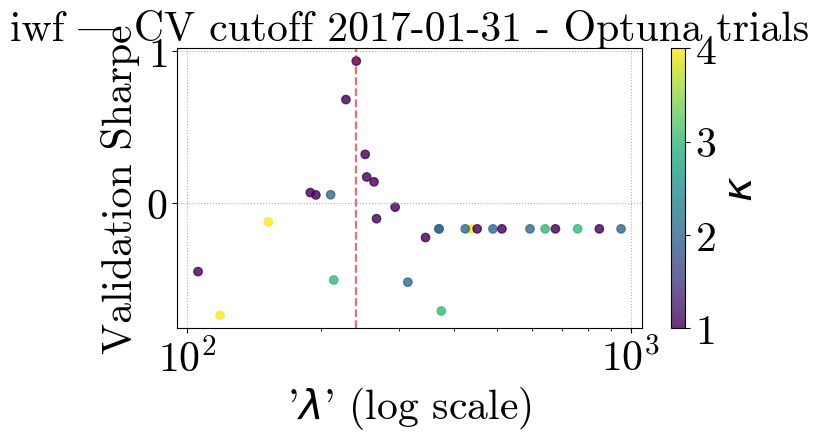

[I 2025-05-05 18:53:12,593] A new study created in memory with name: no-name-d15b70c2-6bb8-4a8c-a095-d4d2685cdbc8
[I 2025-05-05 18:53:14,623] Trial 0 finished with value: 0.728550374850522 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: 0.728550374850522.
[I 2025-05-05 18:53:17,062] Trial 1 finished with value: 0.728550374850522 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: 0.728550374850522.
[I 2025-05-05 18:53:18,748] Trial 2 finished with value: 0.8115811123972057 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 2 with value: 0.8115811123972057.
[I 2025-05-05 18:53:22,712] Trial 3 finished with value: 1.1146869711576746 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 3 with value: 1.1146869711576746.
[I 2025-05-05 18:53:25,331] Trial 4 finished with value: 0.728550374850522 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is trial 3 with v

Optuna best λ=103.0962, κ=3, Sharpe=1.3030


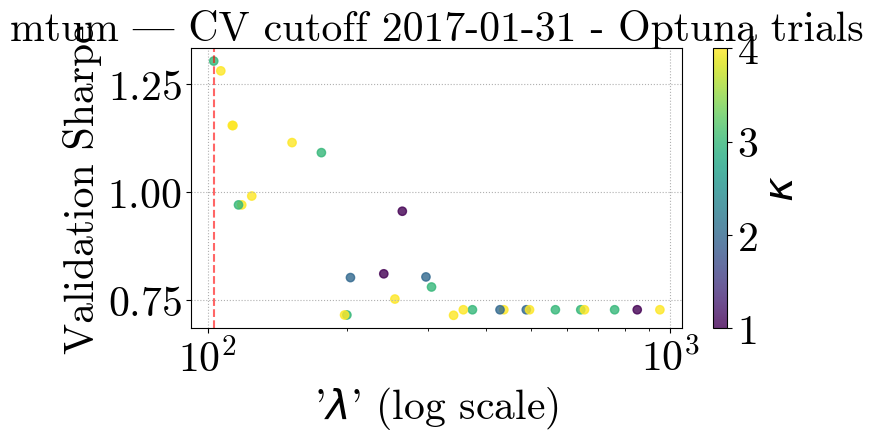

[I 2025-05-05 18:54:51,666] A new study created in memory with name: no-name-6906c8a7-56bf-478b-8f65-22c4205e88b3
[I 2025-05-05 18:54:54,691] Trial 0 finished with value: -0.6551736832562959 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: -0.6551736832562959.
[I 2025-05-05 18:54:57,241] Trial 1 finished with value: -0.6551736832562959 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: -0.6551736832562959.
[I 2025-05-05 18:54:59,073] Trial 2 finished with value: -0.06969218671191545 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 2 with value: -0.06969218671191545.
[I 2025-05-05 18:55:02,259] Trial 3 finished with value: 0.4083962760162615 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 3 with value: 0.4083962760162615.
[I 2025-05-05 18:55:04,715] Trial 4 finished with value: -0.6551736832562959 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is 

Optuna best λ=849.1984, κ=1, Sharpe=0.6379


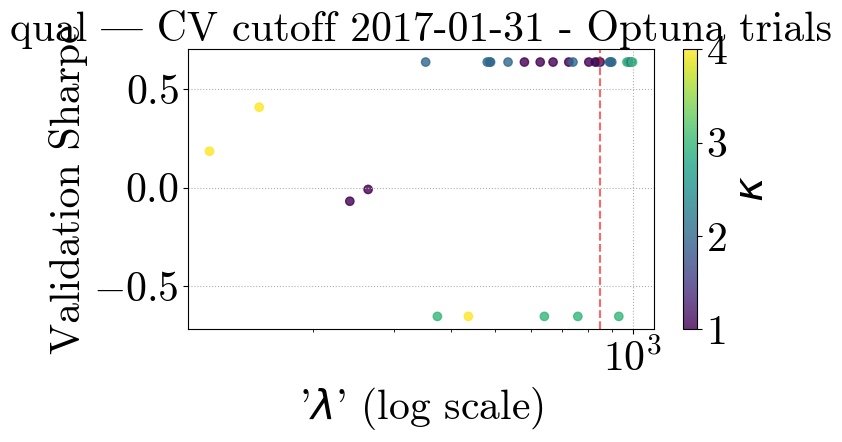

[I 2025-05-05 18:55:56,697] A new study created in memory with name: no-name-0c655954-ac41-40f2-ba80-6d2c15562144
[I 2025-05-05 18:55:58,826] Trial 0 finished with value: -0.3692993587402888 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: -0.3692993587402888.
[I 2025-05-05 18:56:01,876] Trial 1 finished with value: -0.4772219219268638 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: -0.3692993587402888.
[I 2025-05-05 18:56:03,550] Trial 2 finished with value: -0.4883520765484016 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 0 with value: -0.3692993587402888.
[I 2025-05-05 18:56:08,984] Trial 3 finished with value: 0.1788303972951285 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 3 with value: 0.1788303972951285.
[I 2025-05-05 18:56:12,234] Trial 4 finished with value: -0.4772219219268638 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is tr

Optuna best λ=152.2753, κ=4, Sharpe=0.1788


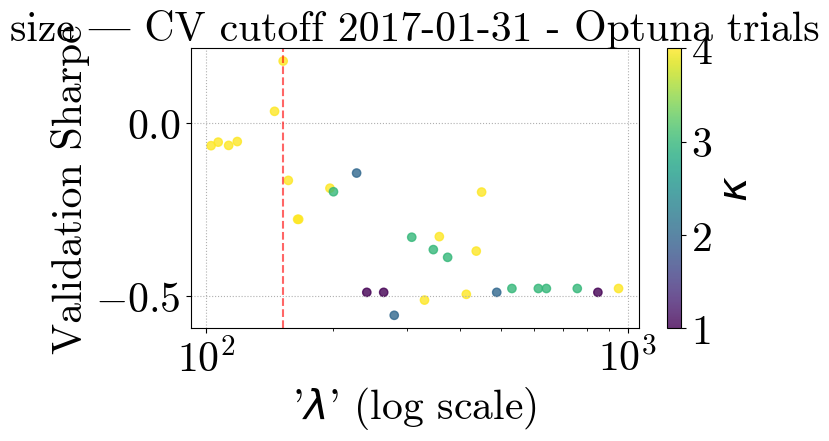

[I 2025-05-05 18:57:46,739] A new study created in memory with name: no-name-40228551-ddc1-4645-9b3e-0b2a1342d5c4
[I 2025-05-05 18:57:49,420] Trial 0 finished with value: -1.0245752344887928 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: -1.0245752344887928.
[I 2025-05-05 18:57:53,502] Trial 1 finished with value: -0.1552493311625918 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 1 with value: -0.1552493311625918.
[I 2025-05-05 18:57:54,901] Trial 2 finished with value: -0.5005949917613567 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 1 with value: -0.1552493311625918.
[I 2025-05-05 18:57:59,093] Trial 3 finished with value: -0.4081718912463481 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 1 with value: -0.1552493311625918.
[I 2025-05-05 18:58:00,851] Trial 4 finished with value: -0.48188174328030237 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is

Optuna best λ=849.1984, κ=1, Sharpe=0.0987


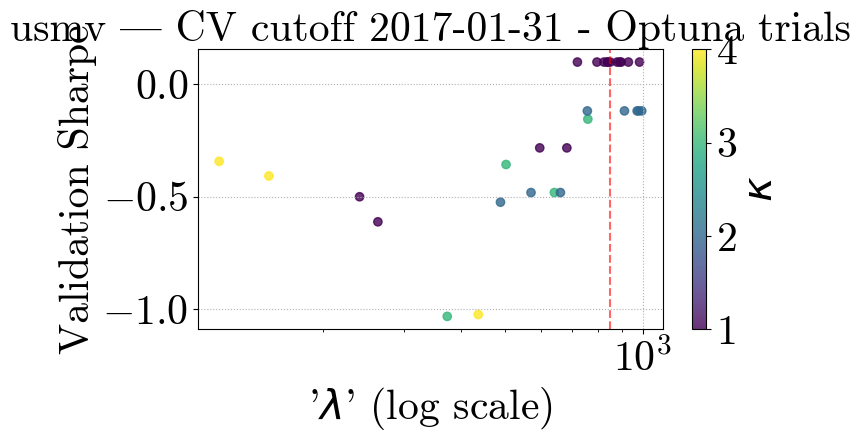

[I 2025-05-05 18:58:44,596] A new study created in memory with name: no-name-55bb1205-e499-4f39-9c67-c18a22dd1a36
[I 2025-05-05 18:58:47,658] Trial 0 finished with value: 0.7303849056895209 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: 0.7303849056895209.
[I 2025-05-05 18:58:49,858] Trial 1 finished with value: 0.3973380701987932 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: 0.7303849056895209.
[I 2025-05-05 18:58:51,742] Trial 2 finished with value: 0.639393666199999 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 0 with value: 0.7303849056895209.
[I 2025-05-05 18:58:55,480] Trial 3 finished with value: 0.972831145425539 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 3 with value: 0.972831145425539.
[I 2025-05-05 18:58:57,292] Trial 4 finished with value: 0.6538784338214138 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is trial 3 with

Optuna best λ=373.8180, κ=3, Sharpe=0.9965


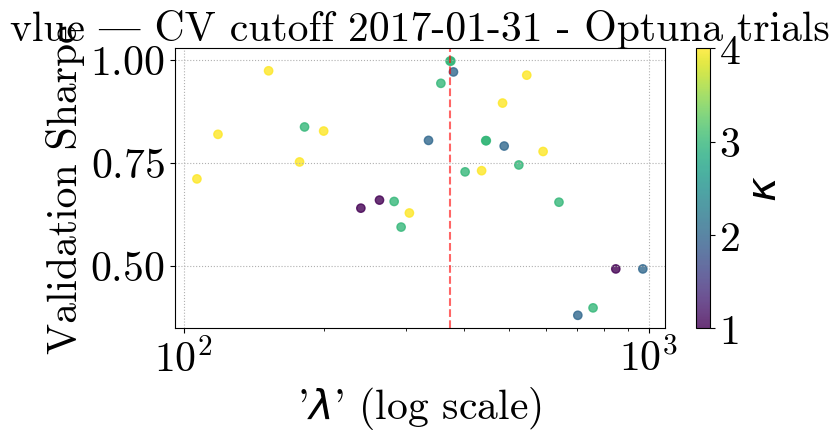

[I 2025-05-05 19:00:12,630] A new study created in memory with name: no-name-5eac8803-7b21-4058-ae7b-9ec85a7cddf5
[I 2025-05-05 19:00:16,853] Trial 0 finished with value: -0.6368910664980917 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: -0.6368910664980917.
[I 2025-05-05 19:00:20,860] Trial 1 finished with value: -0.6368910664980917 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: -0.6368910664980917.
[I 2025-05-05 19:00:22,612] Trial 2 finished with value: -0.12570722753864097 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 2 with value: -0.12570722753864097.
[I 2025-05-05 19:00:28,222] Trial 3 finished with value: -0.5363158366519409 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 2 with value: -0.12570722753864097.
[I 2025-05-05 19:00:32,729] Trial 4 finished with value: -0.6368910664980917 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best 

Optuna best λ=285.8700, κ=1, Sharpe=0.2017


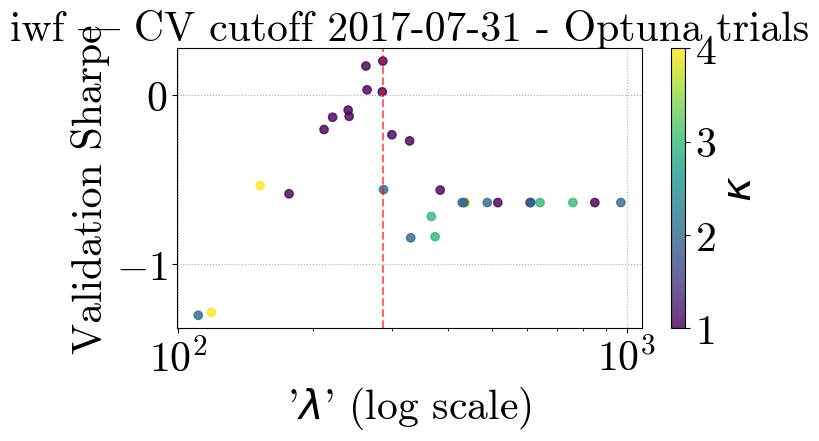

[I 2025-05-05 19:01:40,433] A new study created in memory with name: no-name-e339dc47-3f2c-45b6-8d46-1d0962fe10fa
[I 2025-05-05 19:01:42,718] Trial 0 finished with value: 1.2241679198414144 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: 1.2241679198414144.
[I 2025-05-05 19:01:44,806] Trial 1 finished with value: 1.2241679198414144 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: 1.2241679198414144.
[I 2025-05-05 19:01:46,409] Trial 2 finished with value: 1.3885344558276786 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 2 with value: 1.3885344558276786.
[I 2025-05-05 19:01:50,610] Trial 3 finished with value: 1.5217367878748222 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 3 with value: 1.5217367878748222.
[I 2025-05-05 19:01:53,177] Trial 4 finished with value: 1.2241679198414144 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is trial 3 w

Optuna best λ=103.0962, κ=3, Sharpe=1.8817


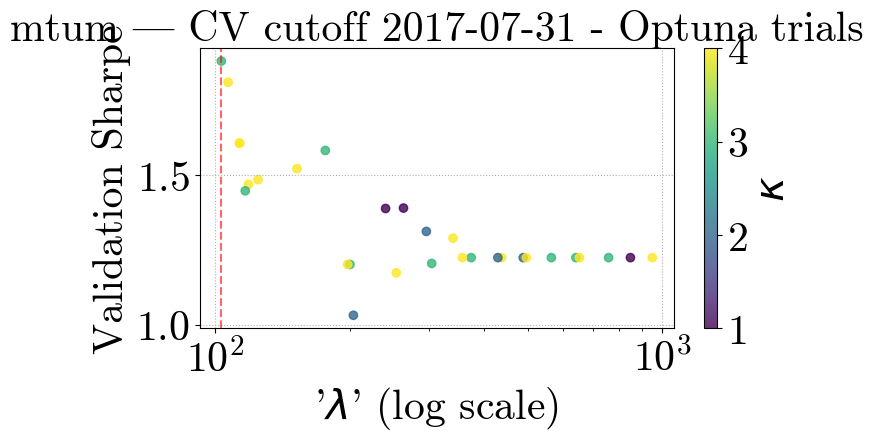

[I 2025-05-05 19:03:23,133] A new study created in memory with name: no-name-3c96ded1-6d89-4457-adf0-e7768dc479cd
[I 2025-05-05 19:03:25,977] Trial 0 finished with value: -0.7378163880806663 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: -0.7378163880806663.
[I 2025-05-05 19:03:28,899] Trial 1 finished with value: -0.7378163880806663 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: -0.7378163880806663.
[I 2025-05-05 19:03:30,355] Trial 2 finished with value: 0.07688474042653391 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 2 with value: 0.07688474042653391.
[I 2025-05-05 19:03:34,722] Trial 3 finished with value: 0.275220303723432 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 3 with value: 0.275220303723432.
[I 2025-05-05 19:03:37,594] Trial 4 finished with value: -0.7378163880806663 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is tria

Optuna best λ=767.4686, κ=1, Sharpe=0.7208


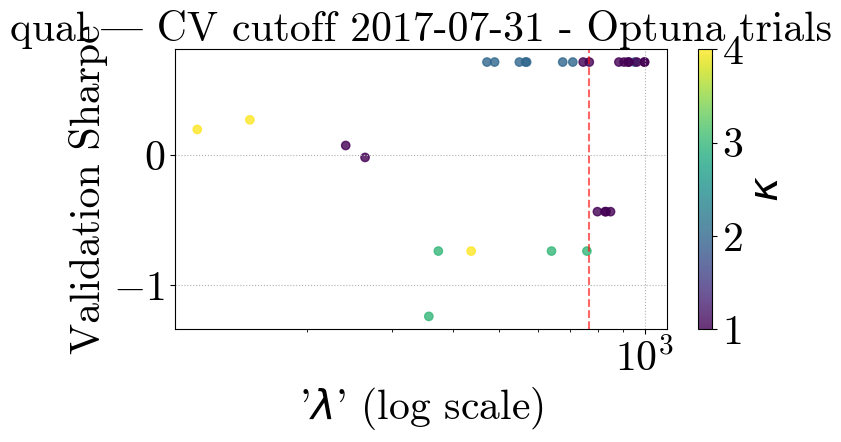

[I 2025-05-05 19:04:34,982] A new study created in memory with name: no-name-4a4c365e-7783-43db-9b71-892a8306ca6a
[I 2025-05-05 19:04:37,210] Trial 0 finished with value: -0.09044335190461486 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: -0.09044335190461486.
[I 2025-05-05 19:04:40,096] Trial 1 finished with value: -0.31052837434579755 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: -0.09044335190461486.
[I 2025-05-05 19:04:41,655] Trial 2 finished with value: -0.2572582555773584 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 0 with value: -0.09044335190461486.
[I 2025-05-05 19:04:45,160] Trial 3 finished with value: 0.41388815234845566 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 3 with value: 0.41388815234845566.
[I 2025-05-05 19:04:48,093] Trial 4 finished with value: -0.31052837434579755 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Be

Optuna best λ=145.2804, κ=4, Sharpe=0.4832


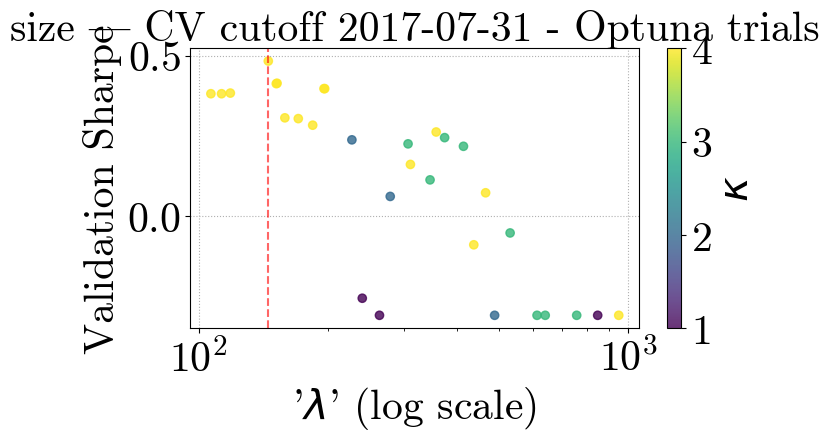

[I 2025-05-05 19:06:16,897] A new study created in memory with name: no-name-5083433c-ad46-4136-9e77-9b41292a955f
[I 2025-05-05 19:06:19,713] Trial 0 finished with value: -1.0066171367129113 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: -1.0066171367129113.
[I 2025-05-05 19:06:22,513] Trial 1 finished with value: 1.1794863961524154 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 1 with value: 1.1794863961524154.
[I 2025-05-05 19:06:24,172] Trial 2 finished with value: -0.9302248741555083 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 1 with value: 1.1794863961524154.
[I 2025-05-05 19:06:27,768] Trial 3 finished with value: -0.364632676707314 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 1 with value: 1.1794863961524154.
[I 2025-05-05 19:06:29,473] Trial 4 finished with value: -0.41412923805883317 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is tria

Optuna best λ=758.7945, κ=3, Sharpe=1.1795


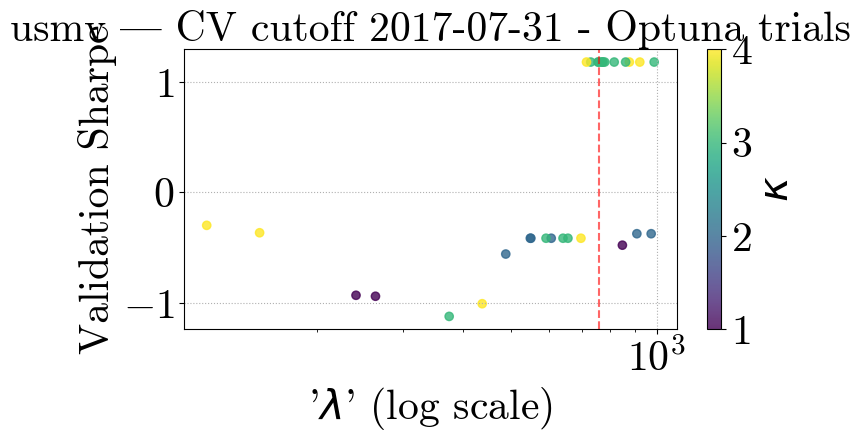

[I 2025-05-05 19:07:33,533] A new study created in memory with name: no-name-475688d6-ad95-4a59-90fd-95c0d1474824
[I 2025-05-05 19:07:35,847] Trial 0 finished with value: 0.12673869440389102 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: 0.12673869440389102.
[I 2025-05-05 19:07:38,450] Trial 1 finished with value: -0.24427373900792423 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: 0.12673869440389102.
[I 2025-05-05 19:07:40,391] Trial 2 finished with value: 0.12015548995087078 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 0 with value: 0.12673869440389102.
[I 2025-05-05 19:07:42,849] Trial 3 finished with value: 0.3586740318438115 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 3 with value: 0.3586740318438115.
[I 2025-05-05 19:07:44,898] Trial 4 finished with value: 0.14272012092644779 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is t

Optuna best λ=380.2108, κ=2, Sharpe=0.4135


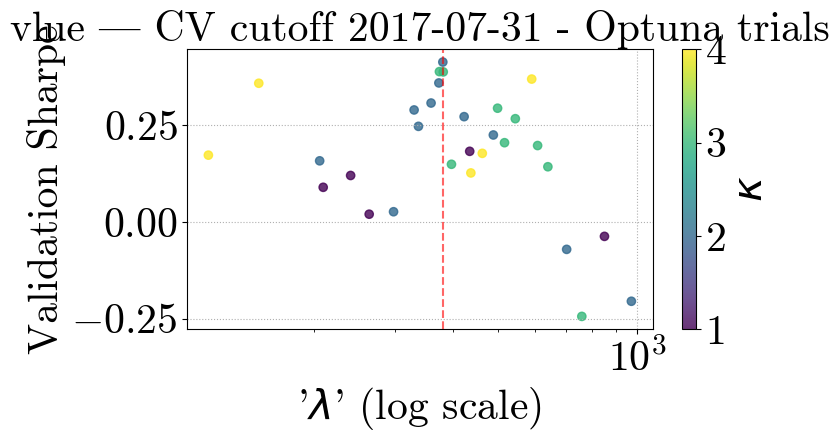

[I 2025-05-05 19:08:56,615] A new study created in memory with name: no-name-ad4a5fff-a802-46dd-8a38-0319dde9901a
[I 2025-05-05 19:08:59,787] Trial 0 finished with value: -0.6693405954750244 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: -0.6693405954750244.
[I 2025-05-05 19:09:02,695] Trial 1 finished with value: -0.8322555030421472 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: -0.6693405954750244.
[I 2025-05-05 19:09:04,444] Trial 2 finished with value: -0.21442580412413226 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 2 with value: -0.21442580412413226.
[I 2025-05-05 19:09:08,294] Trial 3 finished with value: -0.6232159761178551 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 2 with value: -0.21442580412413226.
[I 2025-05-05 19:09:11,196] Trial 4 finished with value: -0.8322555030421472 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best 

Optuna best λ=302.2059, κ=1, Sharpe=-0.0475


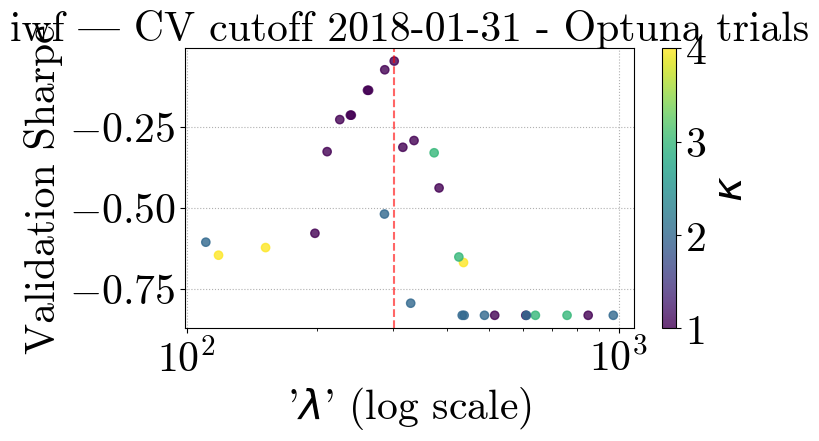

[I 2025-05-05 19:10:16,370] A new study created in memory with name: no-name-2dd31b3e-4201-4eb0-b257-14d5d0416751
[I 2025-05-05 19:10:18,725] Trial 0 finished with value: 1.3641644415664627 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: 1.3641644415664627.
[I 2025-05-05 19:10:20,929] Trial 1 finished with value: 1.3641644415664627 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: 1.3641644415664627.
[I 2025-05-05 19:10:22,767] Trial 2 finished with value: 1.552345998177922 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 2 with value: 1.552345998177922.
[I 2025-05-05 19:10:27,594] Trial 3 finished with value: 1.6389326498462027 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 3 with value: 1.6389326498462027.
[I 2025-05-05 19:10:29,966] Trial 4 finished with value: 1.3641644415664627 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is trial 3 wit

Optuna best λ=131.3723, κ=4, Sharpe=2.0002


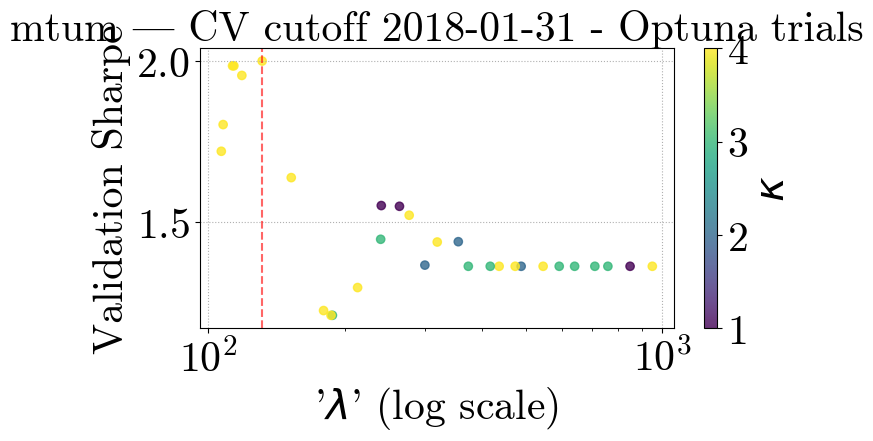

[I 2025-05-05 19:11:52,347] A new study created in memory with name: no-name-1f9bba59-0a93-4295-96c5-b4d11c606889
[I 2025-05-05 19:11:55,384] Trial 0 finished with value: 0.6509218552307324 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: 0.6509218552307324.
[I 2025-05-05 19:11:58,116] Trial 1 finished with value: 0.6509218552307324 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: 0.6509218552307324.
[I 2025-05-05 19:11:59,761] Trial 2 finished with value: -0.08383591816534003 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 0 with value: 0.6509218552307324.
[I 2025-05-05 19:12:05,180] Trial 3 finished with value: 0.40780647379408047 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 0 with value: 0.6509218552307324.
[I 2025-05-05 19:12:07,700] Trial 4 finished with value: 0.6509218552307324 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is trial 

Optuna best λ=316.1123, κ=2, Sharpe=0.7966


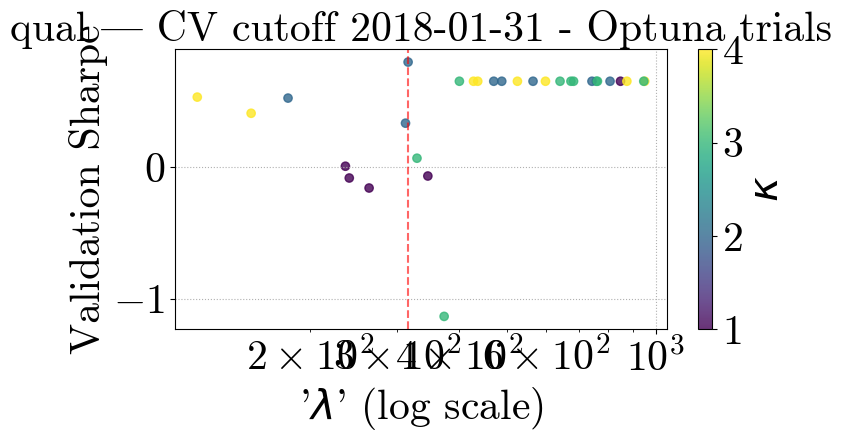

[I 2025-05-05 19:13:32,374] A new study created in memory with name: no-name-b60110f8-07f7-4751-bdde-d49f6f349077
[I 2025-05-05 19:13:34,667] Trial 0 finished with value: -0.10678423004746013 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: -0.10678423004746013.
[I 2025-05-05 19:13:36,911] Trial 1 finished with value: -0.07417517673596982 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 1 with value: -0.07417517673596982.
[I 2025-05-05 19:13:38,249] Trial 2 finished with value: -0.10678423004746007 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 1 with value: -0.07417517673596982.
[I 2025-05-05 19:13:41,651] Trial 3 finished with value: -0.017427825162839777 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 3 with value: -0.017427825162839777.
[I 2025-05-05 19:13:43,794] Trial 4 finished with value: -0.10678423004746013 and parameters: {'lambda': 641.0035105688879, 'kappa': 3

Optuna best λ=980.1965, κ=2, Sharpe=0.1389


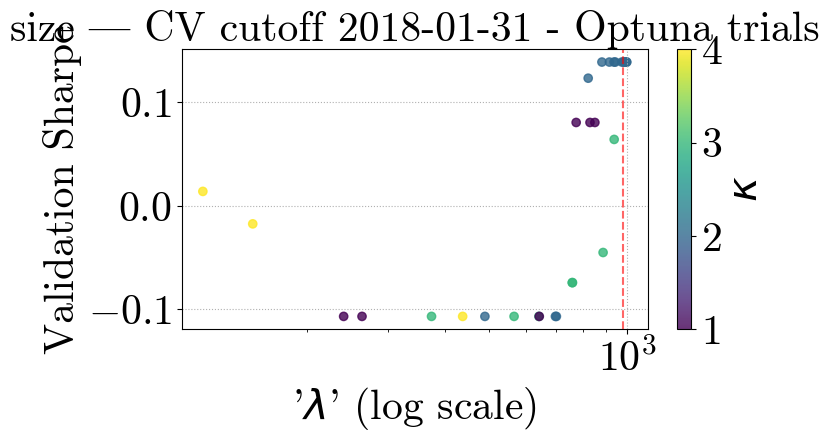

[I 2025-05-05 19:14:34,377] A new study created in memory with name: no-name-5930050c-67bd-4fb6-bfdf-c1ec16175e07
[I 2025-05-05 19:14:36,971] Trial 0 finished with value: -0.7411738451095233 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: -0.7411738451095233.
[I 2025-05-05 19:14:40,073] Trial 1 finished with value: 0.08246829190799912 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 1 with value: 0.08246829190799912.
[I 2025-05-05 19:14:41,739] Trial 2 finished with value: -0.5726241115293473 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 1 with value: 0.08246829190799912.
[I 2025-05-05 19:14:46,066] Trial 3 finished with value: -0.055560584801232694 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 1 with value: 0.08246829190799912.
[I 2025-05-05 19:14:49,103] Trial 4 finished with value: 0.08246829190799912 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best i

Optuna best λ=758.7945, κ=3, Sharpe=0.0825


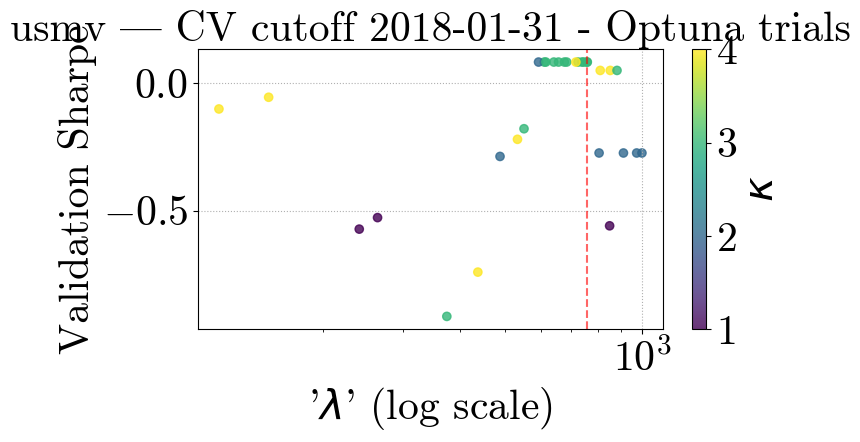

[I 2025-05-05 19:16:01,323] A new study created in memory with name: no-name-bd71c85b-df68-4e65-945b-826079c1b19d
[I 2025-05-05 19:16:03,247] Trial 0 finished with value: 0.4784661942017253 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: 0.4784661942017253.
[I 2025-05-05 19:16:05,297] Trial 1 finished with value: 0.45976176337218283 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: 0.4784661942017253.
[I 2025-05-05 19:16:07,358] Trial 2 finished with value: 0.3152603304582055 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 0 with value: 0.4784661942017253.
[I 2025-05-05 19:16:10,439] Trial 3 finished with value: 0.5961076545402622 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 3 with value: 0.5961076545402622.
[I 2025-05-05 19:16:12,424] Trial 4 finished with value: 0.44250435652599085 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is trial 3

Optuna best λ=849.1984, κ=1, Sharpe=0.6518


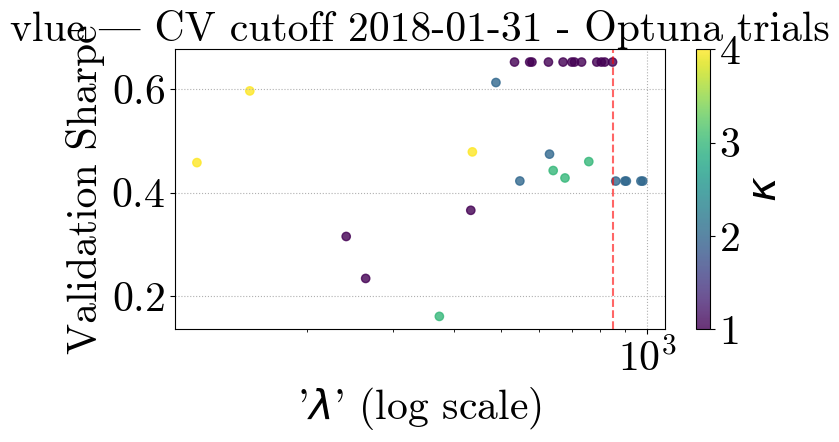

[I 2025-05-05 19:17:03,371] A new study created in memory with name: no-name-c866ef22-a639-4c17-b0d7-b1d8ba4afe2a
[I 2025-05-05 19:17:06,506] Trial 0 finished with value: -0.3987306326986233 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: -0.3987306326986233.
[I 2025-05-05 19:17:09,570] Trial 1 finished with value: -0.3987306326986233 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: -0.3987306326986233.
[I 2025-05-05 19:17:11,380] Trial 2 finished with value: -0.15338039132184603 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 2 with value: -0.15338039132184603.
[I 2025-05-05 19:17:14,321] Trial 3 finished with value: -0.12594490778692757 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 3 with value: -0.12594490778692757.
[I 2025-05-05 19:17:17,159] Trial 4 finished with value: -0.3987306326986233 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best

Optuna best λ=970.7828, κ=2, Sharpe=0.5835


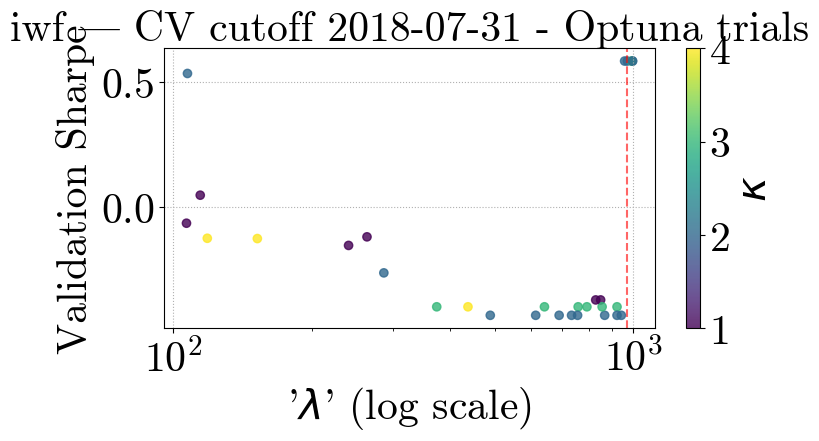

[I 2025-05-05 19:18:10,327] A new study created in memory with name: no-name-127a90c9-ef51-4385-9a99-cfcbc18515da
[I 2025-05-05 19:18:12,620] Trial 0 finished with value: 1.0313840716670115 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: 1.0313840716670115.
[I 2025-05-05 19:18:14,796] Trial 1 finished with value: 1.0313840716670115 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: 1.0313840716670115.
[I 2025-05-05 19:18:16,689] Trial 2 finished with value: 1.143878188941943 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 2 with value: 1.143878188941943.
[I 2025-05-05 19:18:21,059] Trial 3 finished with value: 1.3582410834654433 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 3 with value: 1.3582410834654433.
[I 2025-05-05 19:18:23,249] Trial 4 finished with value: 1.0313840716670115 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is trial 3 wit

Optuna best λ=110.6778, κ=4, Sharpe=1.4377


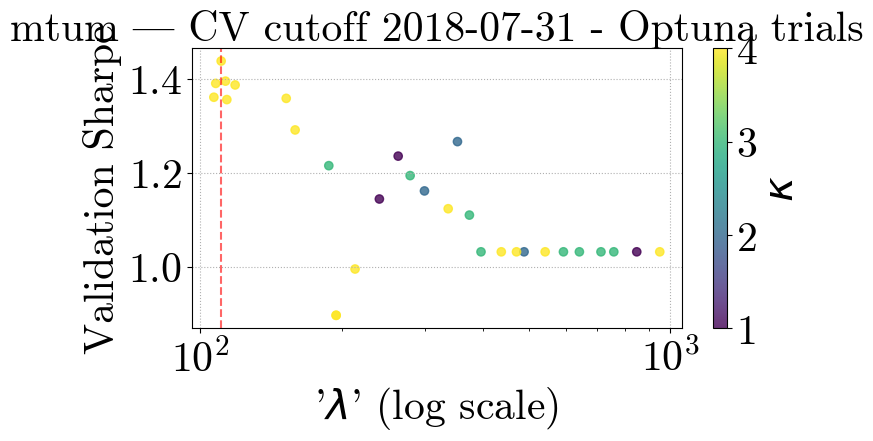

[I 2025-05-05 19:19:40,017] A new study created in memory with name: no-name-78e18ea8-4552-4523-9486-1593be926868
[I 2025-05-05 19:19:42,166] Trial 0 finished with value: 0.45715484506004617 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: 0.45715484506004617.
[I 2025-05-05 19:19:44,036] Trial 1 finished with value: 0.45715484506004617 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: 0.45715484506004617.
[I 2025-05-05 19:19:45,596] Trial 2 finished with value: 0.469961643778492 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 2 with value: 0.469961643778492.
[I 2025-05-05 19:19:49,706] Trial 3 finished with value: 0.3929652279523663 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 2 with value: 0.469961643778492.
[I 2025-05-05 19:19:51,661] Trial 4 finished with value: 0.45715484506004617 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is trial 2

Optuna best λ=849.1984, κ=1, Sharpe=0.7814


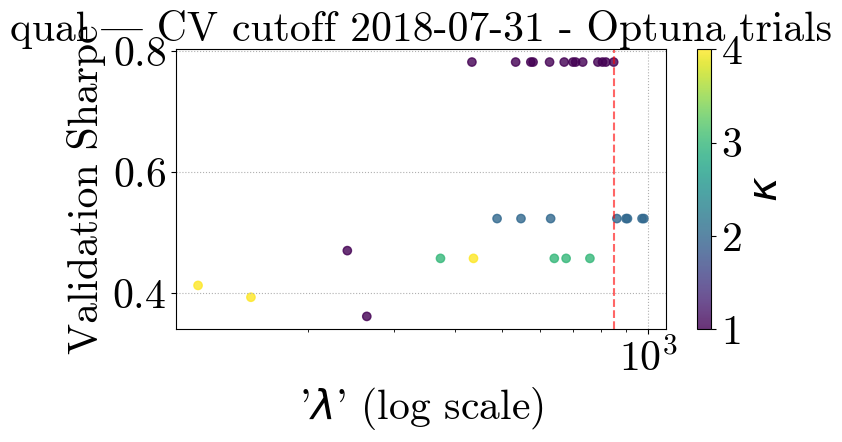

[I 2025-05-05 19:20:42,941] A new study created in memory with name: no-name-f4ebb335-9f3a-4933-963a-c5a7f8e1b40b
[I 2025-05-05 19:20:44,953] Trial 0 finished with value: -0.358827108732753 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: -0.358827108732753.
[I 2025-05-05 19:20:46,699] Trial 1 finished with value: -0.358827108732753 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: -0.358827108732753.
[I 2025-05-05 19:20:48,343] Trial 2 finished with value: 0.4052503942275845 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 2 with value: 0.4052503942275845.
[I 2025-05-05 19:20:51,631] Trial 3 finished with value: 0.053119302068857 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 2 with value: 0.4052503942275845.
[I 2025-05-05 19:20:53,673] Trial 4 finished with value: -0.358827108732753 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is trial 2 wi

Optuna best λ=240.4168, κ=1, Sharpe=0.4053


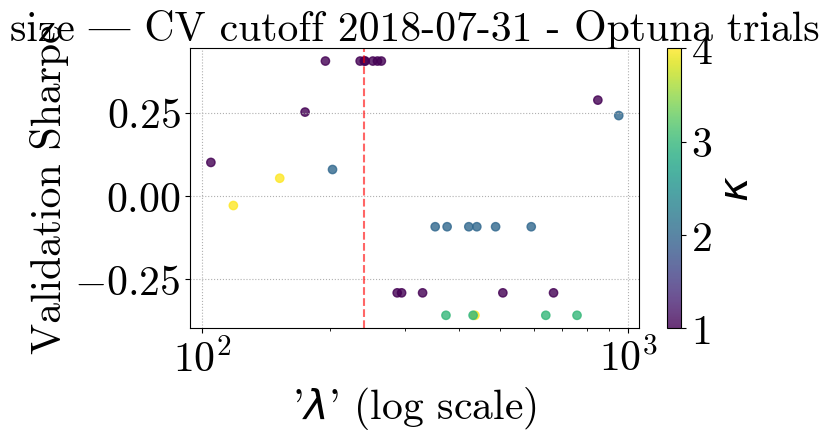

[I 2025-05-05 19:21:46,490] A new study created in memory with name: no-name-a22ba60f-0146-4ed4-9080-3b888a0c4f13
[I 2025-05-05 19:21:49,343] Trial 0 finished with value: -0.5081636089050469 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: -0.5081636089050469.
[I 2025-05-05 19:21:52,317] Trial 1 finished with value: -0.02857046241574455 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 1 with value: -0.02857046241574455.
[I 2025-05-05 19:21:53,793] Trial 2 finished with value: -0.6287354421900969 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 1 with value: -0.02857046241574455.
[I 2025-05-05 19:21:57,465] Trial 3 finished with value: -0.41231790073152375 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 1 with value: -0.02857046241574455.
[I 2025-05-05 19:22:00,193] Trial 4 finished with value: -0.02857046241574455 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Be

Optuna best λ=849.1984, κ=1, Sharpe=-0.0073


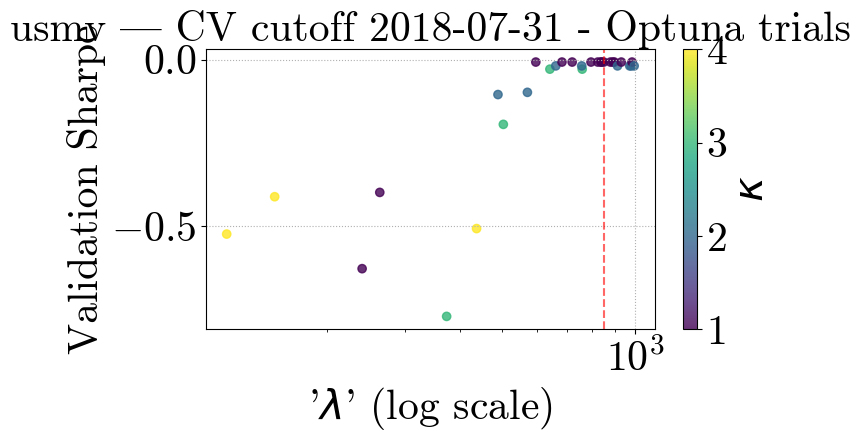

[I 2025-05-05 19:22:47,565] A new study created in memory with name: no-name-8da07af4-21bb-41d3-87f0-87817286d3ce
[I 2025-05-05 19:22:50,302] Trial 0 finished with value: 0.7596830718451636 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: 0.7596830718451636.
[I 2025-05-05 19:22:52,446] Trial 1 finished with value: 0.7173330969959526 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: 0.7596830718451636.
[I 2025-05-05 19:22:54,367] Trial 2 finished with value: 0.5023530398206512 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 0 with value: 0.7596830718451636.
[I 2025-05-05 19:22:56,938] Trial 3 finished with value: 0.6460058771670192 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 0 with value: 0.7596830718451636.
[I 2025-05-05 19:22:58,754] Trial 4 finished with value: 0.6636683713146954 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is trial 0 w

Optuna best λ=461.4918, κ=2, Sharpe=0.8049


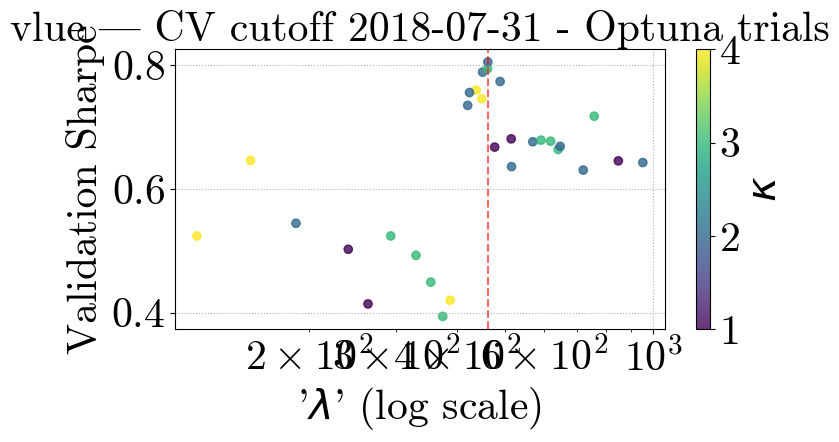

[I 2025-05-05 19:24:08,221] A new study created in memory with name: no-name-273fafba-b27e-4571-bf81-163acd763574
[I 2025-05-05 19:24:10,519] Trial 0 finished with value: 0.19528829785995497 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: 0.19528829785995497.
[I 2025-05-05 19:24:12,458] Trial 1 finished with value: 0.133005772751673 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: 0.19528829785995497.
[I 2025-05-05 19:24:14,188] Trial 2 finished with value: -0.012288205438173326 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 0 with value: 0.19528829785995497.
[I 2025-05-05 19:24:17,588] Trial 3 finished with value: 0.07277461216719085 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 0 with value: 0.19528829785995497.
[I 2025-05-05 19:24:19,518] Trial 4 finished with value: -0.10710713691842388 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is

Optuna best λ=837.2633, κ=2, Sharpe=0.4712


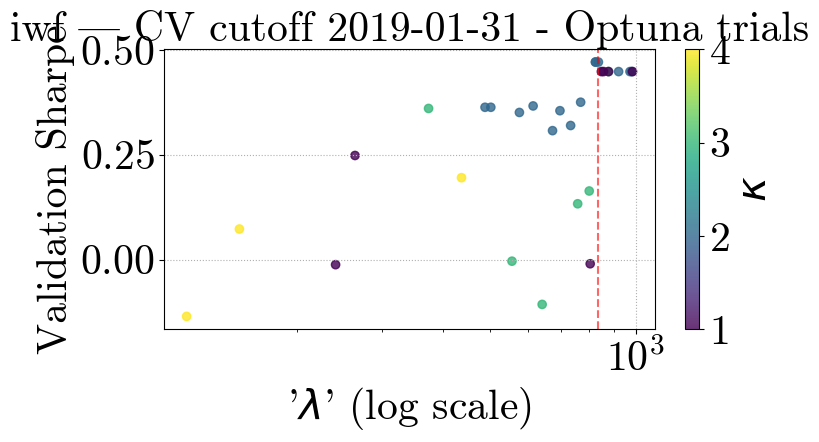

[I 2025-05-05 19:25:11,965] A new study created in memory with name: no-name-3b5e8926-7fff-420c-89f2-b5f67af3453d
[I 2025-05-05 19:25:14,082] Trial 0 finished with value: 0.6302420478156143 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: 0.6302420478156143.
[I 2025-05-05 19:25:16,134] Trial 1 finished with value: 0.9361815235097943 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 1 with value: 0.9361815235097943.
[I 2025-05-05 19:25:17,916] Trial 2 finished with value: 0.9987556376077141 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 2 with value: 0.9987556376077141.
[I 2025-05-05 19:25:22,271] Trial 3 finished with value: 0.7939202808855574 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 2 with value: 0.9987556376077141.
[I 2025-05-05 19:25:24,352] Trial 4 finished with value: 0.9432081513279954 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is trial 2 w

Optuna best λ=118.5260, κ=4, Sharpe=1.0324


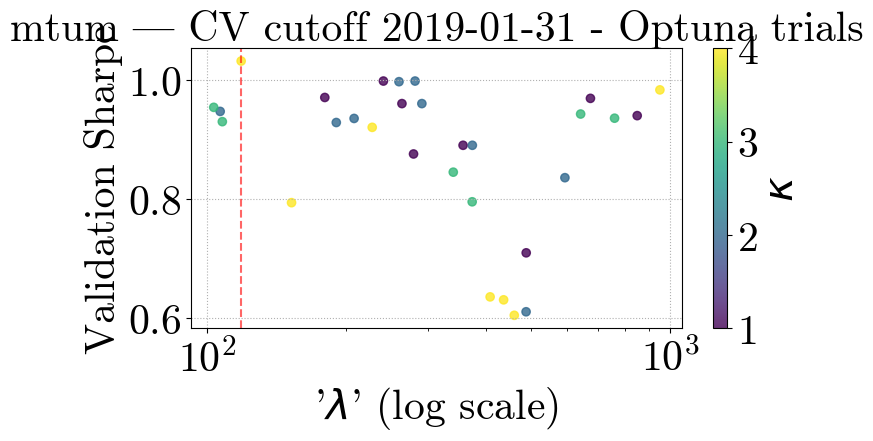

[I 2025-05-05 19:26:32,784] A new study created in memory with name: no-name-915be474-9e22-4fe8-99d2-401f7e431cb0
[I 2025-05-05 19:26:34,896] Trial 0 finished with value: -0.026504308711194774 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: -0.026504308711194774.
[I 2025-05-05 19:26:37,700] Trial 1 finished with value: -0.09028027063562453 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: -0.026504308711194774.
[I 2025-05-05 19:26:39,251] Trial 2 finished with value: 0.01294943057163736 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 2 with value: 0.01294943057163736.
[I 2025-05-05 19:26:42,824] Trial 3 finished with value: -0.04322340816186568 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 2 with value: 0.01294943057163736.
[I 2025-05-05 19:26:44,982] Trial 4 finished with value: 0.02181779373462128 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. 

Optuna best λ=238.0819, κ=2, Sharpe=0.2434


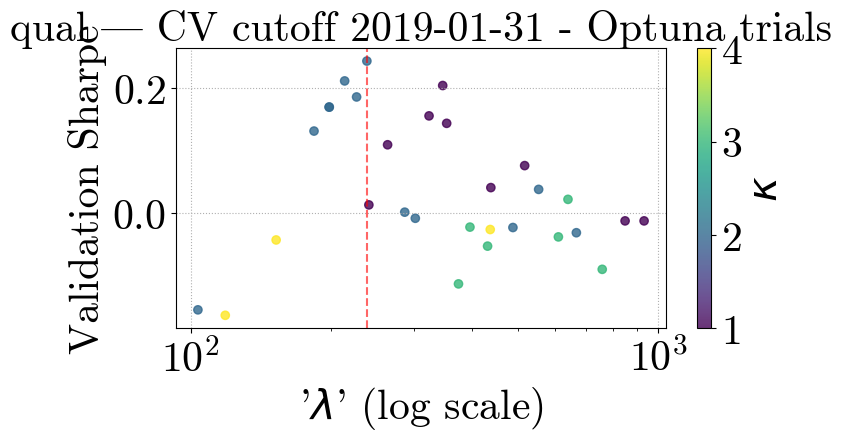

[I 2025-05-05 19:28:26,392] A new study created in memory with name: no-name-7af1c204-b433-4f53-9242-2a4ecf414a6b
[I 2025-05-05 19:28:28,542] Trial 0 finished with value: 0.04767709352532157 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: 0.04767709352532157.
[I 2025-05-05 19:28:30,357] Trial 1 finished with value: 0.04767709352532157 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: 0.04767709352532157.
[I 2025-05-05 19:28:32,722] Trial 2 finished with value: -0.07789327026966224 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 0 with value: 0.04767709352532157.
[I 2025-05-05 19:28:36,405] Trial 3 finished with value: 0.1845005213460015 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 3 with value: 0.1845005213460015.
[I 2025-05-05 19:28:38,309] Trial 4 finished with value: 0.04767709352532157 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is t

Optuna best λ=176.4809, κ=4, Sharpe=0.2632


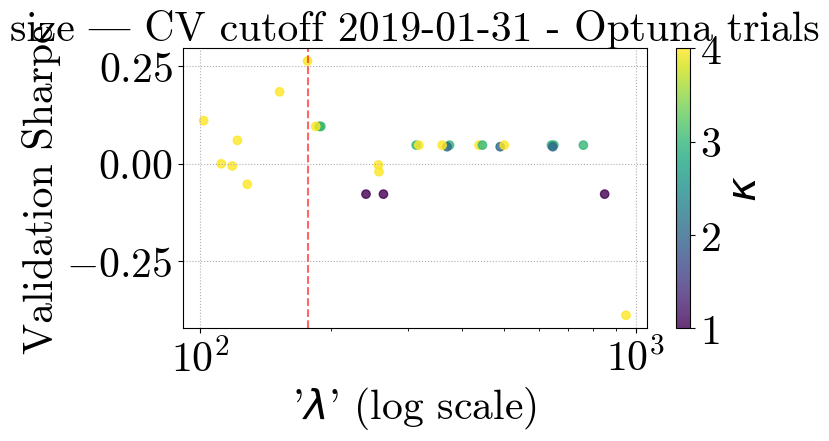

[I 2025-05-05 19:30:04,403] A new study created in memory with name: no-name-73204863-5f04-4fd3-8458-4af335e1fb2f
[I 2025-05-05 19:30:06,475] Trial 0 finished with value: -0.24480236785624862 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: -0.24480236785624862.
[I 2025-05-05 19:30:08,589] Trial 1 finished with value: 0.01236383604620918 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 1 with value: 0.01236383604620918.
[I 2025-05-05 19:30:10,092] Trial 2 finished with value: -0.2693025014020307 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 1 with value: 0.01236383604620918.
[I 2025-05-05 19:30:12,605] Trial 3 finished with value: -0.4109004583178838 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 1 with value: 0.01236383604620918.
[I 2025-05-05 19:30:14,626] Trial 4 finished with value: 0.01236383604620918 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best i

Optuna best λ=805.2667, κ=2, Sharpe=0.0192


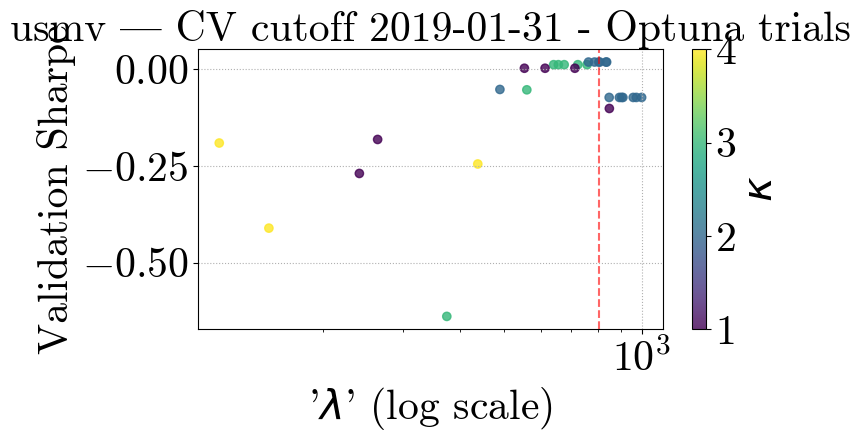

[I 2025-05-05 19:31:17,906] A new study created in memory with name: no-name-27c73184-0868-4c9a-86a6-e34760735787
[I 2025-05-05 19:31:21,887] Trial 0 finished with value: 0.19668528604482716 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: 0.19668528604482716.
[I 2025-05-05 19:31:24,725] Trial 1 finished with value: -0.06984376413818394 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: 0.19668528604482716.
[I 2025-05-05 19:31:26,386] Trial 2 finished with value: 0.2284284047552307 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 2 with value: 0.2284284047552307.
[I 2025-05-05 19:31:30,216] Trial 3 finished with value: 0.7492201841867249 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 3 with value: 0.7492201841867249.
[I 2025-05-05 19:31:33,068] Trial 4 finished with value: 0.007162617750521167 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is tr

Optuna best λ=207.8218, κ=3, Sharpe=0.7691


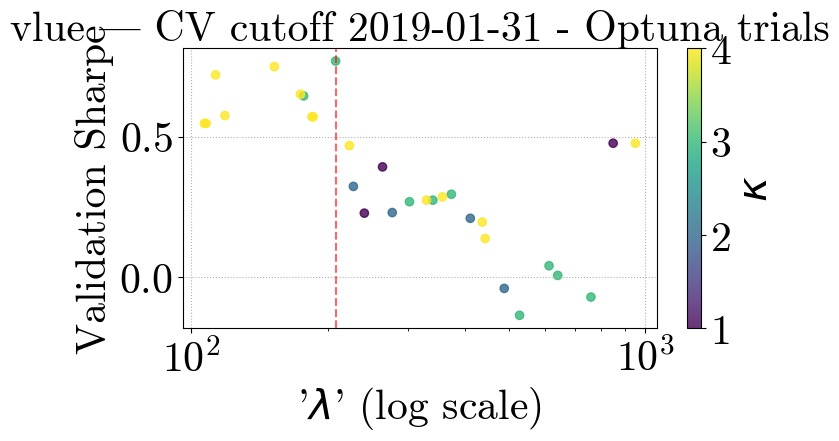

[I 2025-05-05 19:32:56,487] A new study created in memory with name: no-name-dba89107-d289-4d44-8557-6f5c030a2b1a
[I 2025-05-05 19:32:59,258] Trial 0 finished with value: 0.5337415941826628 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: 0.5337415941826628.
[I 2025-05-05 19:33:01,745] Trial 1 finished with value: 0.41148638268996357 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: 0.5337415941826628.
[I 2025-05-05 19:33:03,372] Trial 2 finished with value: 0.6754480446252125 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 2 with value: 0.6754480446252125.
[I 2025-05-05 19:33:08,127] Trial 3 finished with value: 0.3595947495635308 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 2 with value: 0.6754480446252125.
[I 2025-05-05 19:33:11,059] Trial 4 finished with value: 0.33661666872178847 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is trial 2

Optuna best λ=849.1984, κ=1, Sharpe=0.7635


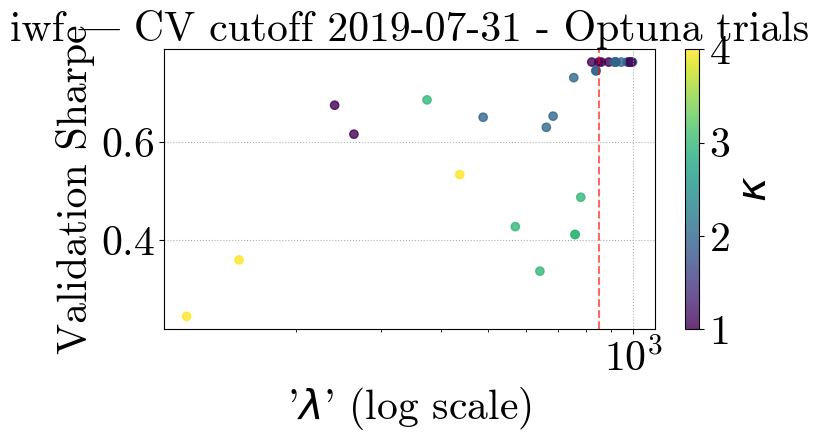

[I 2025-05-05 19:33:54,571] A new study created in memory with name: no-name-8ae64b6a-9729-4c0a-995f-489f60cd6698
[I 2025-05-05 19:33:56,897] Trial 0 finished with value: 0.8728242393859833 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: 0.8728242393859833.
[I 2025-05-05 19:33:58,818] Trial 1 finished with value: 1.1522102771428224 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 1 with value: 1.1522102771428224.
[I 2025-05-05 19:34:00,528] Trial 2 finished with value: 1.2603158067046918 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 2 with value: 1.2603158067046918.
[I 2025-05-05 19:34:05,591] Trial 3 finished with value: 1.0693754394267676 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 2 with value: 1.2603158067046918.
[I 2025-05-05 19:34:07,845] Trial 4 finished with value: 1.1430785283003877 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is trial 2 w

Optuna best λ=972.5834, κ=2, Sharpe=1.3495


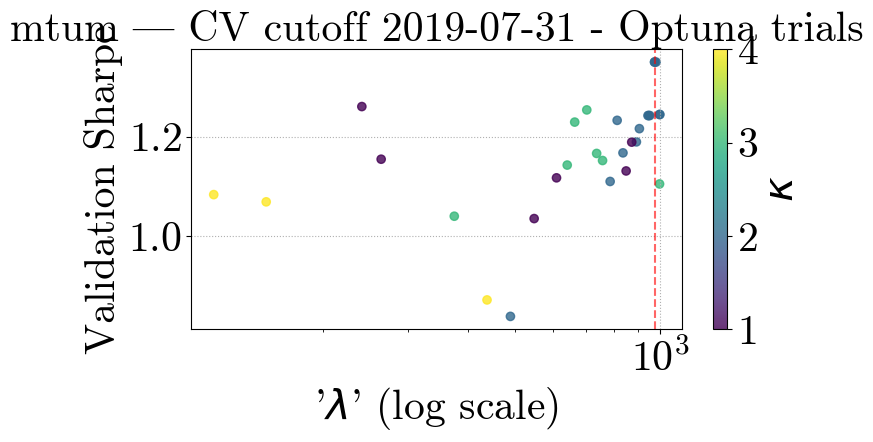

[I 2025-05-05 19:34:58,720] A new study created in memory with name: no-name-de660538-f9f5-4d57-96d7-a2308b2e090d
[I 2025-05-05 19:35:01,421] Trial 0 finished with value: 0.5278698689065212 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: 0.5278698689065212.
[I 2025-05-05 19:35:03,977] Trial 1 finished with value: 0.5455986127099818 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 1 with value: 0.5455986127099818.
[I 2025-05-05 19:35:05,464] Trial 2 finished with value: 0.6610317573917079 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 2 with value: 0.6610317573917079.
[I 2025-05-05 19:35:08,917] Trial 3 finished with value: 0.13491829236024663 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 2 with value: 0.6610317573917079.
[I 2025-05-05 19:35:11,404] Trial 4 finished with value: 0.7415666674419227 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is trial 4 

Optuna best λ=323.7564, κ=1, Sharpe=0.9414


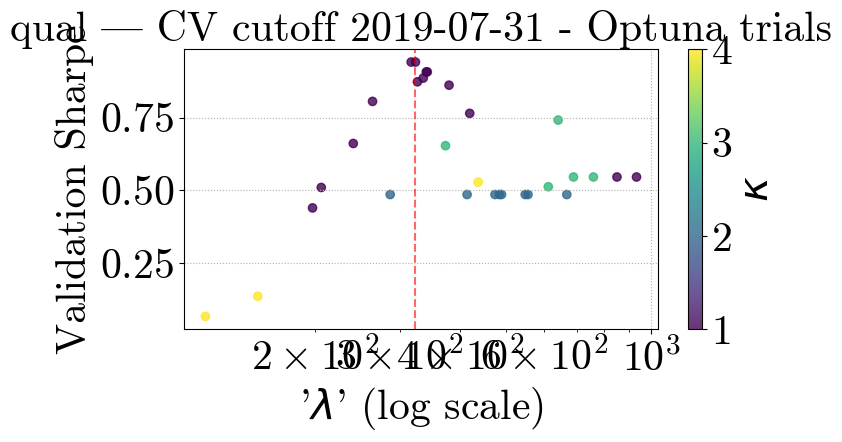

[I 2025-05-05 19:36:49,820] A new study created in memory with name: no-name-ea277939-f569-41ca-89f2-9bd62e95c1b7
[I 2025-05-05 19:36:52,431] Trial 0 finished with value: 0.3540931365306978 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: 0.3540931365306978.
[I 2025-05-05 19:36:54,383] Trial 1 finished with value: -0.3078204904161299 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: 0.3540931365306978.
[I 2025-05-05 19:36:56,742] Trial 2 finished with value: 0.35409313653069774 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 0 with value: 0.3540931365306978.
[I 2025-05-05 19:37:01,623] Trial 3 finished with value: -0.05895780015793035 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 0 with value: 0.3540931365306978.
[I 2025-05-05 19:37:03,744] Trial 4 finished with value: 0.3540931365306978 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is trial

Optuna best λ=488.7505, κ=2, Sharpe=0.3541


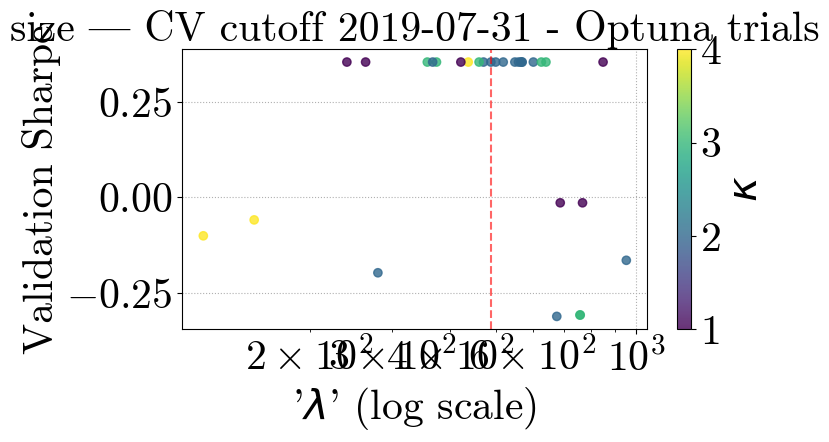

[I 2025-05-05 19:38:05,900] A new study created in memory with name: no-name-d1a3b88d-693f-425b-8631-b19cecba12e7
[I 2025-05-05 19:38:08,934] Trial 0 finished with value: -0.5581338680520702 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: -0.5581338680520702.
[I 2025-05-05 19:38:10,898] Trial 1 finished with value: -0.040058563043987236 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 1 with value: -0.040058563043987236.
[I 2025-05-05 19:38:12,249] Trial 2 finished with value: -0.23535651862546025 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 1 with value: -0.040058563043987236.
[I 2025-05-05 19:38:17,886] Trial 3 finished with value: -0.2284038907104395 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 1 with value: -0.040058563043987236.
[I 2025-05-05 19:38:19,897] Trial 4 finished with value: -0.5958952681369155 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}.

Optuna best λ=849.1984, κ=1, Sharpe=0.1813


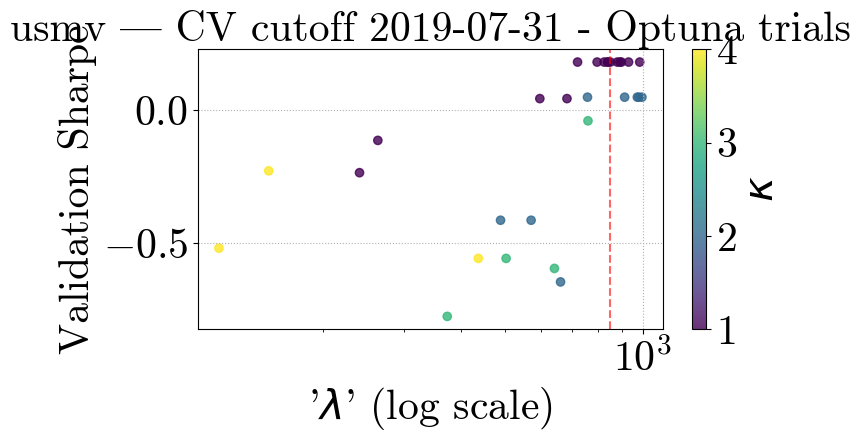

[I 2025-05-05 19:39:09,041] A new study created in memory with name: no-name-c078fb43-307b-460e-952f-95d8a66d9f54
[I 2025-05-05 19:39:13,387] Trial 0 finished with value: 0.6067981669916354 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: 0.6067981669916354.
[I 2025-05-05 19:39:15,882] Trial 1 finished with value: 0.36903606868686817 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: 0.6067981669916354.
[I 2025-05-05 19:39:17,559] Trial 2 finished with value: 0.48570367979060086 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 0 with value: 0.6067981669916354.
[I 2025-05-05 19:39:21,642] Trial 3 finished with value: 0.7174075601588531 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 3 with value: 0.7174075601588531.
[I 2025-05-05 19:39:24,769] Trial 4 finished with value: 0.5327223811615802 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is trial 3

Optuna best λ=118.5260, κ=4, Sharpe=0.7838


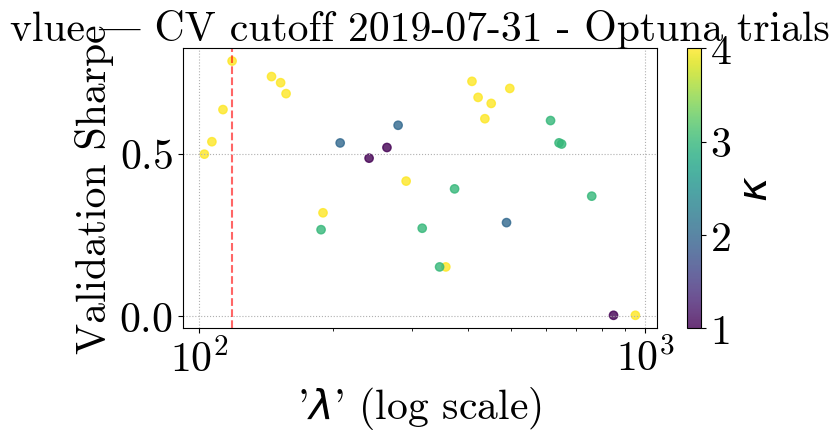

[I 2025-05-05 19:40:52,665] A new study created in memory with name: no-name-3e387114-2f64-488b-b4d2-d746139bbef8
[I 2025-05-05 19:40:54,613] Trial 0 finished with value: 0.5527650542487832 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: 0.5527650542487832.
[I 2025-05-05 19:40:56,495] Trial 1 finished with value: 0.4786384549609889 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: 0.5527650542487832.
[I 2025-05-05 19:40:58,311] Trial 2 finished with value: 0.41896770652734017 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 0 with value: 0.5527650542487832.
[I 2025-05-05 19:41:04,792] Trial 3 finished with value: 0.4136583512510139 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 0 with value: 0.5527650542487832.
[I 2025-05-05 19:41:06,882] Trial 4 finished with value: 0.24891580621647114 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is trial 0

Optuna best λ=849.1984, κ=1, Sharpe=1.1919


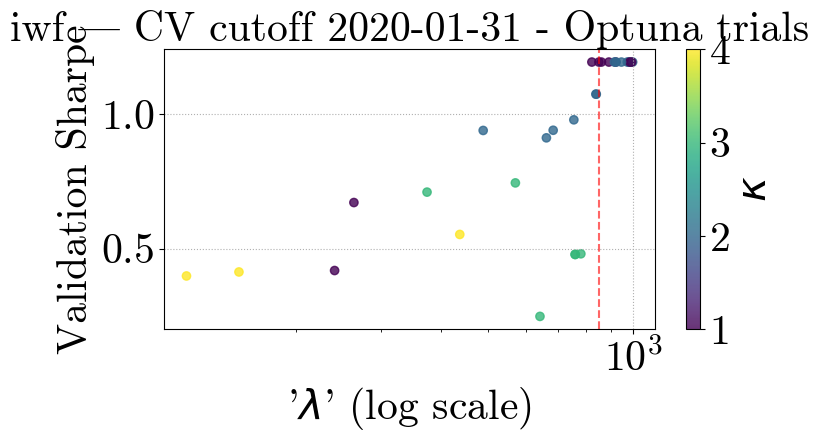

[I 2025-05-05 19:41:46,942] A new study created in memory with name: no-name-5295f01a-b29a-4b1f-8e32-f5f6efcd3ae0
[I 2025-05-05 19:41:49,470] Trial 0 finished with value: 1.1451258547254997 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: 1.1451258547254997.
[I 2025-05-05 19:41:51,761] Trial 1 finished with value: 1.4405431928906298 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 1 with value: 1.4405431928906298.
[I 2025-05-05 19:41:53,592] Trial 2 finished with value: 1.5323095685134118 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 2 with value: 1.5323095685134118.
[I 2025-05-05 19:41:59,235] Trial 3 finished with value: 1.344581247433495 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 2 with value: 1.5323095685134118.
[I 2025-05-05 19:42:01,424] Trial 4 finished with value: 1.4972012079206232 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is trial 2 wi

Optuna best λ=757.8202, κ=2, Sharpe=1.5867


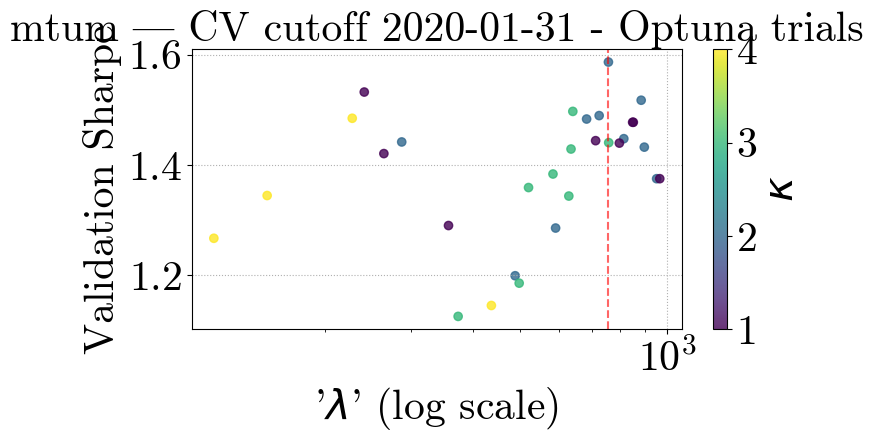

[I 2025-05-05 19:42:58,581] A new study created in memory with name: no-name-c1c17655-f943-418d-8cea-f5b47d2c6e96
[I 2025-05-05 19:43:01,625] Trial 0 finished with value: 0.7235830706905565 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: 0.7235830706905565.
[I 2025-05-05 19:43:04,396] Trial 1 finished with value: 1.0616314001148444 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 1 with value: 1.0616314001148444.
[I 2025-05-05 19:43:05,923] Trial 2 finished with value: 0.9555643043840804 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 1 with value: 1.0616314001148444.
[I 2025-05-05 19:43:10,159] Trial 3 finished with value: -0.35359986659736 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 1 with value: 1.0616314001148444.
[I 2025-05-05 19:43:12,721] Trial 4 finished with value: 1.0531055872388888 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is trial 1 wi

Optuna best λ=302.3178, κ=1, Sharpe=1.1429


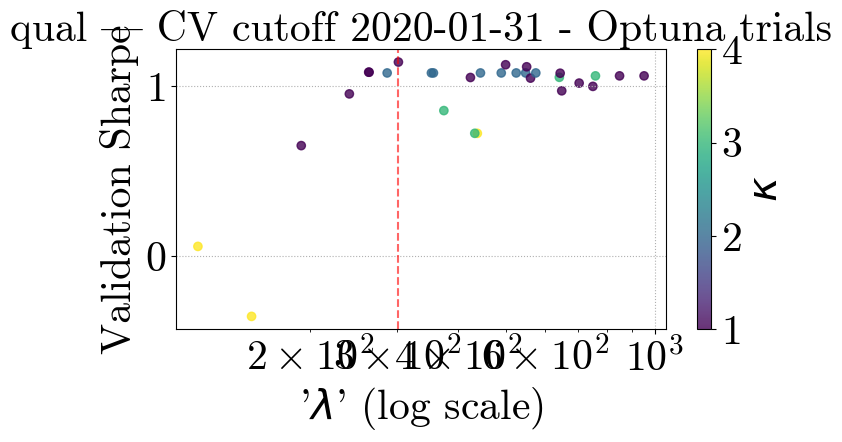

[I 2025-05-05 19:45:12,867] A new study created in memory with name: no-name-adc7377d-5b54-4390-a48c-1418cf10c431
[I 2025-05-05 19:45:14,888] Trial 0 finished with value: 0.3499115737633395 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: 0.3499115737633395.
[I 2025-05-05 19:45:16,992] Trial 1 finished with value: 0.3499115737633395 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: 0.3499115737633395.
[I 2025-05-05 19:45:18,564] Trial 2 finished with value: 0.3499115737633394 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 0 with value: 0.3499115737633395.
[I 2025-05-05 19:45:24,934] Trial 3 finished with value: -0.22395727817888889 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 0 with value: 0.3499115737633395.
[I 2025-05-05 19:45:27,014] Trial 4 finished with value: 0.3499115737633395 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is trial 0

Optuna best λ=437.0861, κ=4, Sharpe=0.3499


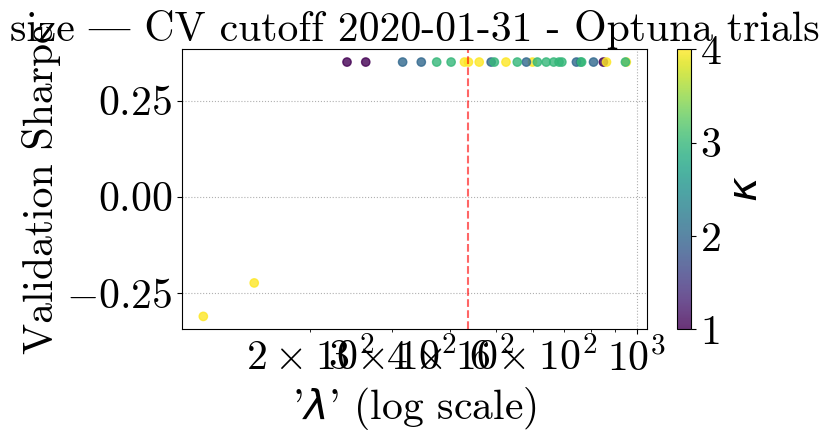

[I 2025-05-05 19:46:29,495] A new study created in memory with name: no-name-83d713fa-d738-42d7-8e8a-a6653d118c15
[I 2025-05-05 19:46:31,419] Trial 0 finished with value: -0.5403997689031461 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: -0.5403997689031461.
[I 2025-05-05 19:46:33,480] Trial 1 finished with value: 0.5325092518820823 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 1 with value: 0.5325092518820823.
[I 2025-05-05 19:46:34,941] Trial 2 finished with value: -0.6555064739476706 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 1 with value: 0.5325092518820823.
[I 2025-05-05 19:46:38,661] Trial 3 finished with value: -0.07136846129413324 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 1 with value: 0.5325092518820823.
[I 2025-05-05 19:46:40,516] Trial 4 finished with value: 0.5325092518820823 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is tria

Optuna best λ=758.7945, κ=3, Sharpe=0.5325


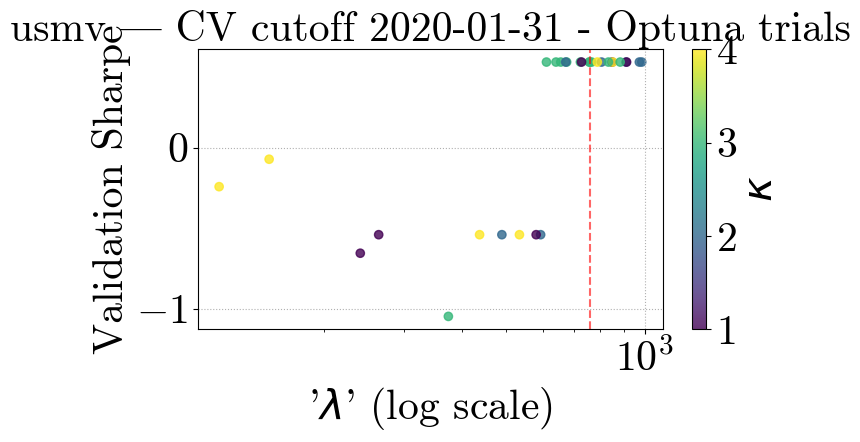

[I 2025-05-05 19:47:36,900] A new study created in memory with name: no-name-ce85defb-4286-4ec1-8083-20316b1168a8
[I 2025-05-05 19:47:41,538] Trial 0 finished with value: -0.2221874435826729 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: -0.2221874435826729.
[I 2025-05-05 19:47:44,635] Trial 1 finished with value: -0.26910514344472547 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: -0.2221874435826729.
[I 2025-05-05 19:47:46,173] Trial 2 finished with value: -0.17261582736472064 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 2 with value: -0.17261582736472064.
[I 2025-05-05 19:47:48,706] Trial 3 finished with value: -0.49756240275664093 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 2 with value: -0.17261582736472064.
[I 2025-05-05 19:47:51,684] Trial 4 finished with value: -0.5254114439476664 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Bes

Optuna best λ=180.7325, κ=1, Sharpe=-0.0356


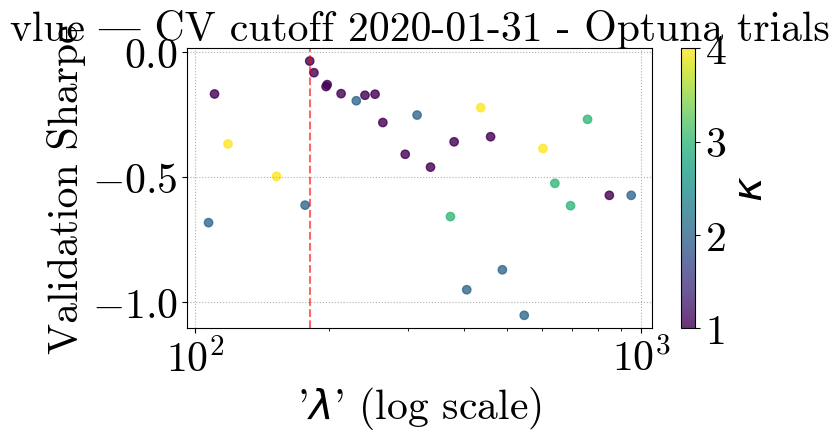

[I 2025-05-05 19:48:46,810] A new study created in memory with name: no-name-1b5d15b2-e364-47d4-8fa4-fe1fdc23c003
[I 2025-05-05 19:48:49,840] Trial 0 finished with value: 1.2101847391402498 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: 1.2101847391402498.
[I 2025-05-05 19:48:52,508] Trial 1 finished with value: 1.0421823795975558 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: 1.2101847391402498.
[I 2025-05-05 19:48:54,000] Trial 2 finished with value: 1.0950781102202425 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 0 with value: 1.2101847391402498.
[I 2025-05-05 19:48:58,370] Trial 3 finished with value: 1.0841108893107945 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 0 with value: 1.2101847391402498.
[I 2025-05-05 19:49:01,049] Trial 4 finished with value: 1.0494484926504988 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is trial 0 w

Optuna best λ=118.5260, κ=4, Sharpe=1.4821


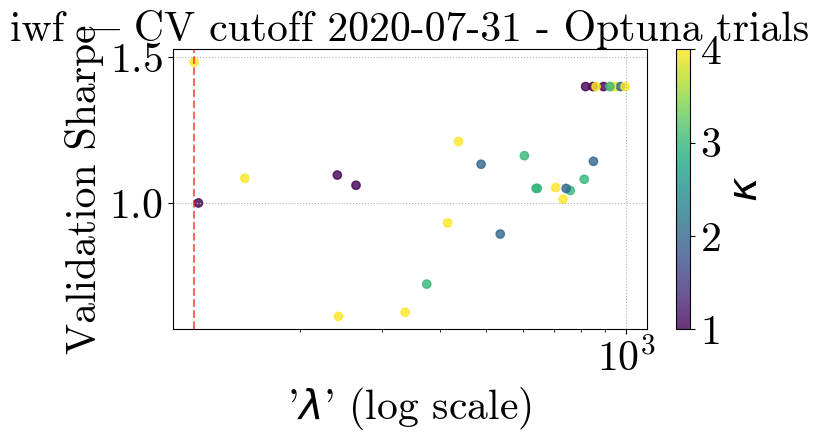

[I 2025-05-05 19:50:05,572] A new study created in memory with name: no-name-3c9e6a53-98df-4313-8d06-f8a8b99bd357
[I 2025-05-05 19:50:07,659] Trial 0 finished with value: 0.40766134651060976 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: 0.40766134651060976.
[I 2025-05-05 19:50:09,609] Trial 1 finished with value: 1.1199482067801458 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 1 with value: 1.1199482067801458.
[I 2025-05-05 19:50:11,547] Trial 2 finished with value: 0.858883844536669 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 1 with value: 1.1199482067801458.
[I 2025-05-05 19:50:15,476] Trial 3 finished with value: 0.8139696525500035 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 1 with value: 1.1199482067801458.
[I 2025-05-05 19:50:17,328] Trial 4 finished with value: 1.128354910836678 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is trial 4 w

Optuna best λ=842.8806, κ=3, Sharpe=1.1639


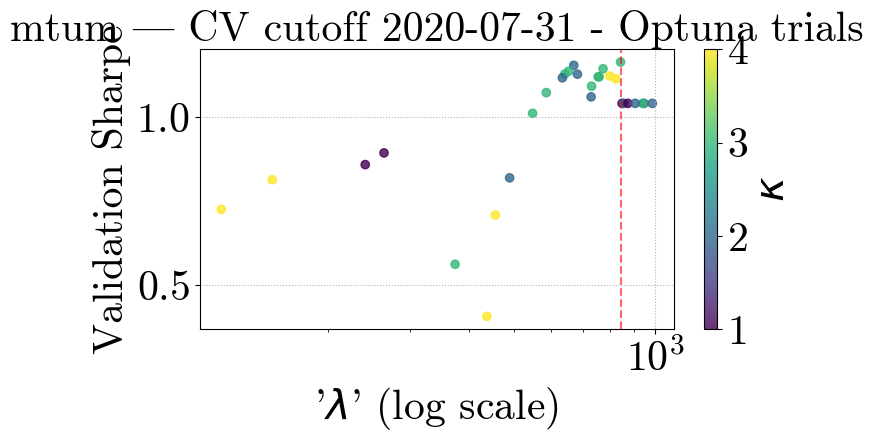

[I 2025-05-05 19:51:16,537] A new study created in memory with name: no-name-e88bacfe-b9b6-4b1c-8ca6-efe6a839ba6e
[I 2025-05-05 19:51:20,752] Trial 0 finished with value: -0.13866164130667633 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: -0.13866164130667633.
[I 2025-05-05 19:51:24,080] Trial 1 finished with value: 0.6903136504168149 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 1 with value: 0.6903136504168149.
[I 2025-05-05 19:51:25,586] Trial 2 finished with value: 0.29250207180949267 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 1 with value: 0.6903136504168149.
[I 2025-05-05 19:51:30,372] Trial 3 finished with value: -0.15591145150466745 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 1 with value: 0.6903136504168149.
[I 2025-05-05 19:51:33,905] Trial 4 finished with value: 0.6029657554932849 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is tr

Optuna best λ=735.0505, κ=1, Sharpe=0.9056


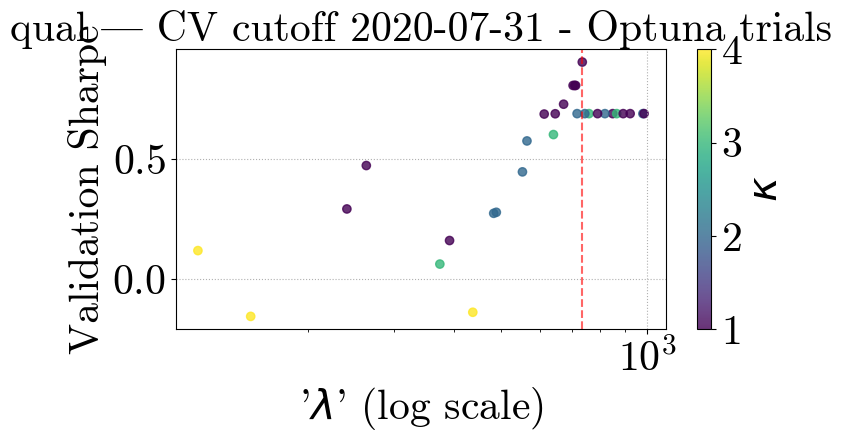

[I 2025-05-05 19:53:03,865] A new study created in memory with name: no-name-0ce877e4-1b2a-4f86-b92d-4030bd3df406
[I 2025-05-05 19:53:07,516] Trial 0 finished with value: 0.5761558960267503 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: 0.5761558960267503.
[I 2025-05-05 19:53:10,652] Trial 1 finished with value: 0.20154512963863178 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: 0.5761558960267503.
[I 2025-05-05 19:53:13,464] Trial 2 finished with value: 0.27766209076002124 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 0 with value: 0.5761558960267503.
[I 2025-05-05 19:53:17,687] Trial 3 finished with value: -0.1332698563898071 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 0 with value: 0.5761558960267503.
[I 2025-05-05 19:53:20,762] Trial 4 finished with value: 0.28372439237711966 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is trial

Optuna best λ=849.1984, κ=1, Sharpe=0.6650


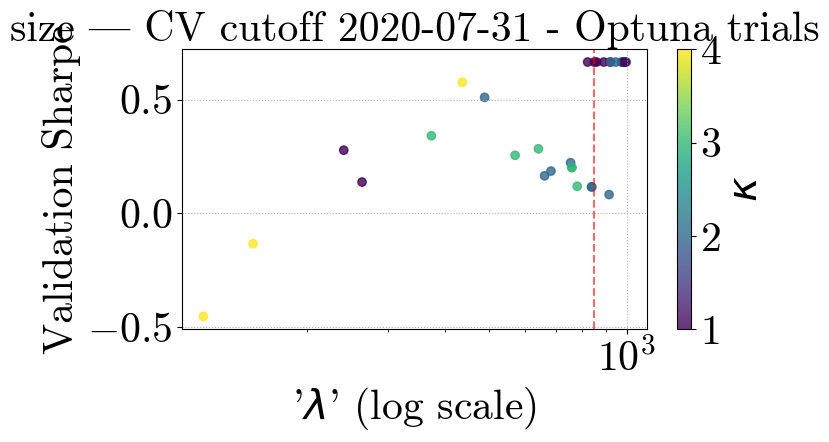

[I 2025-05-05 19:54:07,297] A new study created in memory with name: no-name-330447b3-15c3-4c55-815e-9a0501e43b7e
[I 2025-05-05 19:54:09,911] Trial 0 finished with value: -1.274270996671171 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: -1.274270996671171.
[I 2025-05-05 19:54:12,161] Trial 1 finished with value: 0.013560326529959778 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 1 with value: 0.013560326529959778.
[I 2025-05-05 19:54:13,680] Trial 2 finished with value: -1.3242889474901804 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 1 with value: 0.013560326529959778.
[I 2025-05-05 19:54:17,256] Trial 3 finished with value: -0.6100454613612565 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 1 with value: 0.013560326529959778.
[I 2025-05-05 19:54:19,453] Trial 4 finished with value: 0.013560326529959778 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best 

Optuna best λ=973.2627, κ=2, Sharpe=0.0136


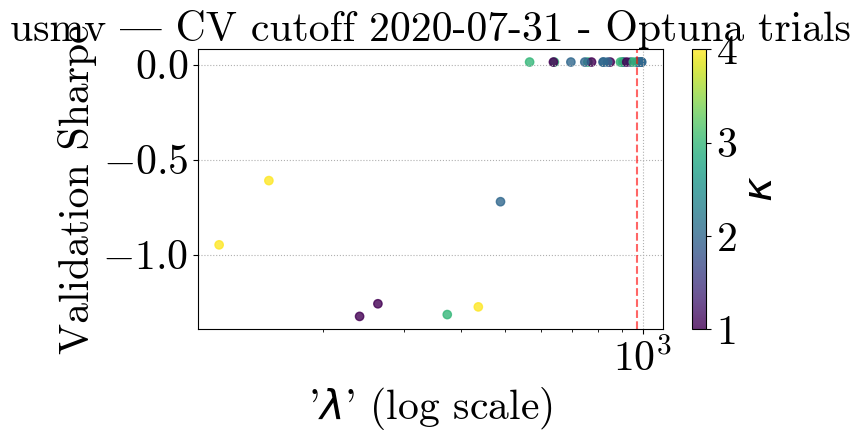

[I 2025-05-05 19:55:13,249] A new study created in memory with name: no-name-59eff1ca-8914-4268-81a8-b4d724b36485
[I 2025-05-05 19:55:16,728] Trial 0 finished with value: -0.10909712472652494 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: -0.10909712472652494.
[I 2025-05-05 19:55:18,924] Trial 1 finished with value: -0.507245628310628 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: -0.10909712472652494.
[I 2025-05-05 19:55:20,599] Trial 2 finished with value: -0.4866100844981803 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 0 with value: -0.10909712472652494.
[I 2025-05-05 19:55:24,453] Trial 3 finished with value: 0.22389003052430784 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 3 with value: 0.22389003052430784.
[I 2025-05-05 19:55:26,547] Trial 4 finished with value: -0.5372697253620058 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best 

Optuna best λ=152.2753, κ=4, Sharpe=0.2239


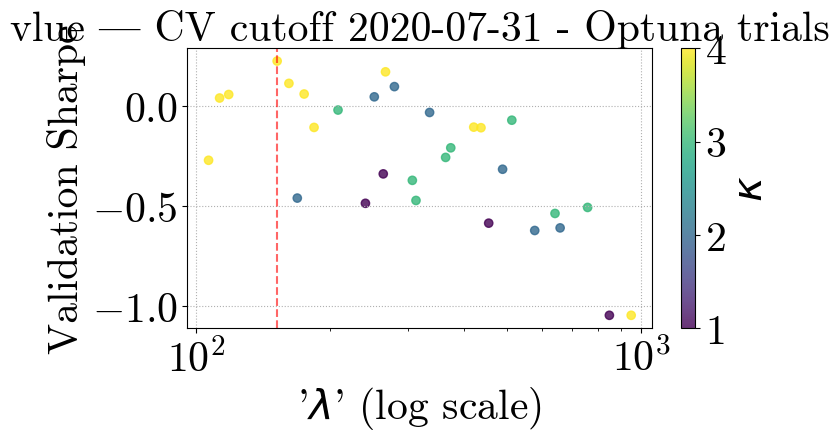

[I 2025-05-05 19:56:45,472] A new study created in memory with name: no-name-8147ce9c-39ee-4d90-9947-6778265ff2a1
[I 2025-05-05 19:56:47,752] Trial 0 finished with value: 1.0363137537567038 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: 1.0363137537567038.
[I 2025-05-05 19:56:50,076] Trial 1 finished with value: 0.8877873680746976 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: 1.0363137537567038.
[I 2025-05-05 19:56:51,859] Trial 2 finished with value: 0.9623171083120107 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 0 with value: 1.0363137537567038.
[I 2025-05-05 19:56:56,295] Trial 3 finished with value: 0.9032729375979033 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 0 with value: 1.0363137537567038.
[I 2025-05-05 19:56:58,522] Trial 4 finished with value: 0.873522942470355 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is trial 0 wi

Optuna best λ=603.8575, κ=2, Sharpe=1.2664


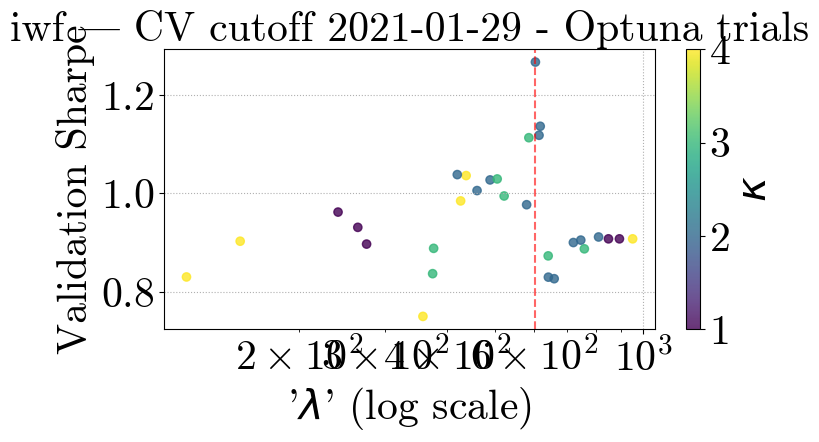

[I 2025-05-05 19:57:56,579] A new study created in memory with name: no-name-a0f0d45c-39fa-4a16-85ed-57aae244777b
[I 2025-05-05 19:57:58,825] Trial 0 finished with value: 0.451681038242956 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: 0.451681038242956.
[I 2025-05-05 19:58:01,146] Trial 1 finished with value: 0.5899202606834315 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 1 with value: 0.5899202606834315.
[I 2025-05-05 19:58:02,794] Trial 2 finished with value: 0.7618179070507333 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 2 with value: 0.7618179070507333.
[I 2025-05-05 19:58:06,429] Trial 3 finished with value: 0.4622621852752881 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 2 with value: 0.7618179070507333.
[I 2025-05-05 19:58:08,604] Trial 4 finished with value: 0.5614861913869404 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is trial 2 wit

Optuna best λ=227.8049, κ=1, Sharpe=0.7872


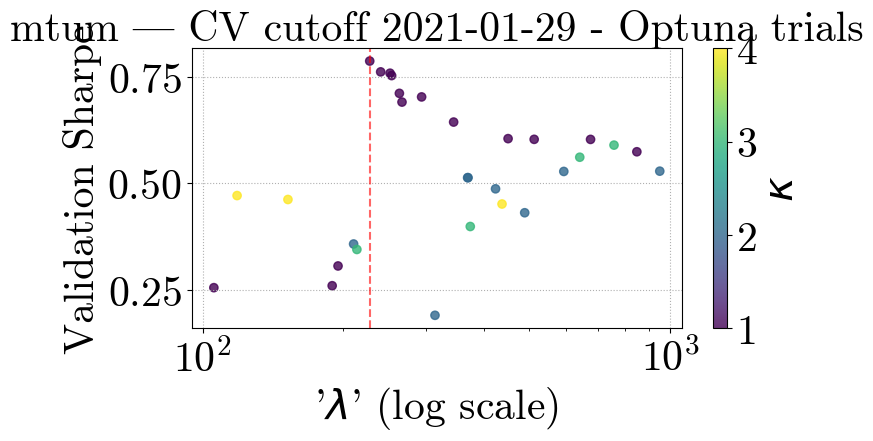

[I 2025-05-05 19:59:13,938] A new study created in memory with name: no-name-0ac8c919-4f42-4de2-8f6b-4e6e7f4adde3
[I 2025-05-05 19:59:17,262] Trial 0 finished with value: -0.2361837375965246 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: -0.2361837375965246.
[I 2025-05-05 19:59:20,127] Trial 1 finished with value: 0.08894032203406557 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 1 with value: 0.08894032203406557.
[I 2025-05-05 19:59:21,632] Trial 2 finished with value: 0.19532882691240874 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 2 with value: 0.19532882691240874.
[I 2025-05-05 19:59:24,300] Trial 3 finished with value: 0.06984591998973008 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 2 with value: 0.19532882691240874.
[I 2025-05-05 19:59:27,406] Trial 4 finished with value: 0.19421968079249521 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is 

Optuna best λ=849.1984, κ=1, Sharpe=0.5886


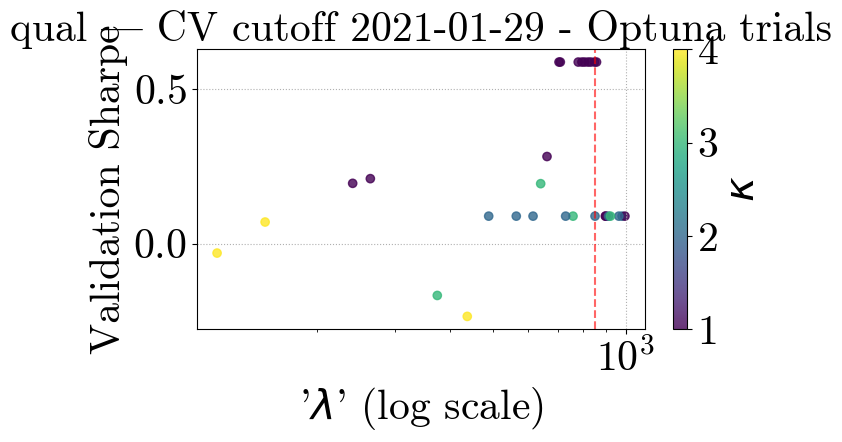

[I 2025-05-05 20:00:44,585] A new study created in memory with name: no-name-146e004d-b2b8-4975-9847-7a75410165c9
[I 2025-05-05 20:00:47,411] Trial 0 finished with value: 0.5605408300379631 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: 0.5605408300379631.
[I 2025-05-05 20:00:49,610] Trial 1 finished with value: 0.47030073205606304 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: 0.5605408300379631.
[I 2025-05-05 20:00:51,677] Trial 2 finished with value: 0.450081620348251 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 0 with value: 0.5605408300379631.
[I 2025-05-05 20:00:57,282] Trial 3 finished with value: 0.10213582128409843 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 0 with value: 0.5605408300379631.
[I 2025-05-05 20:00:59,873] Trial 4 finished with value: 0.5504517814813047 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is trial 0 

Optuna best λ=849.1984, κ=1, Sharpe=0.6079


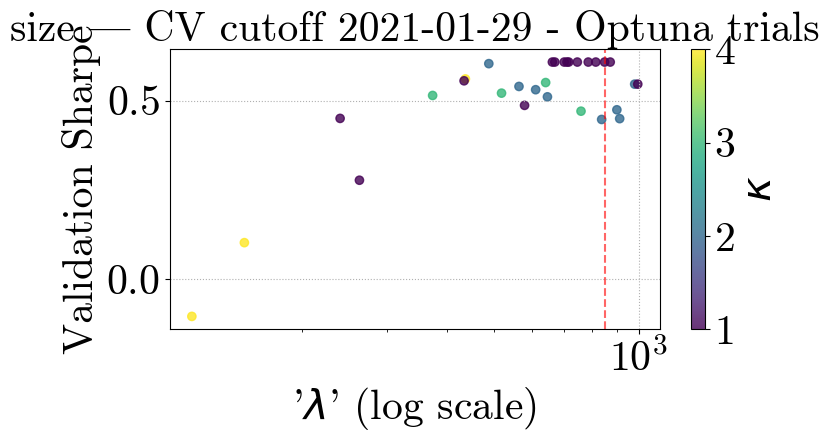

[I 2025-05-05 20:01:49,237] A new study created in memory with name: no-name-0feda347-2c3a-4b29-9964-1af5f0015a72
[I 2025-05-05 20:01:51,858] Trial 0 finished with value: -1.7013591080925339 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: -1.7013591080925339.
[I 2025-05-05 20:01:53,735] Trial 1 finished with value: 0.09240394867082126 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 1 with value: 0.09240394867082126.
[I 2025-05-05 20:01:55,478] Trial 2 finished with value: -1.4749829165415012 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 1 with value: 0.09240394867082126.
[I 2025-05-05 20:01:59,185] Trial 3 finished with value: -0.3889442479502475 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 1 with value: 0.09240394867082126.
[I 2025-05-05 20:02:01,061] Trial 4 finished with value: -0.9673229398423094 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is 

Optuna best λ=973.2627, κ=2, Sharpe=0.1221


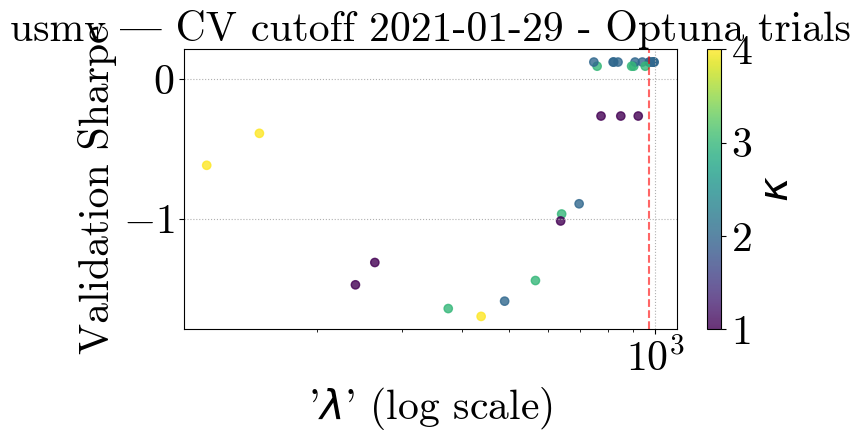

[I 2025-05-05 20:02:51,520] A new study created in memory with name: no-name-ec9e24ad-0aa7-434e-87d5-b025cd0e0961
[I 2025-05-05 20:02:53,758] Trial 0 finished with value: -0.004438622492763593 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: -0.004438622492763593.
[I 2025-05-05 20:02:55,838] Trial 1 finished with value: -0.5939440193759408 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: -0.004438622492763593.
[I 2025-05-05 20:02:58,148] Trial 2 finished with value: -0.11934843508311792 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 0 with value: -0.004438622492763593.
[I 2025-05-05 20:03:02,607] Trial 3 finished with value: 0.011054763660760095 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 3 with value: 0.011054763660760095.
[I 2025-05-05 20:03:04,730] Trial 4 finished with value: -1.062590702415008 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}

Optuna best λ=118.5260, κ=4, Sharpe=0.3319


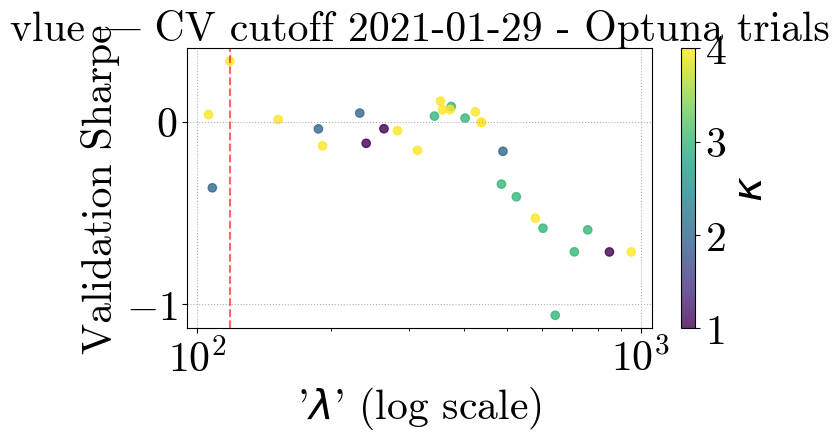

[I 2025-05-05 20:04:29,802] A new study created in memory with name: no-name-ccef0ef7-81fc-4597-811b-2b5d8fe1421c
[I 2025-05-05 20:04:31,899] Trial 0 finished with value: 0.7608012449780496 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: 0.7608012449780496.
[I 2025-05-05 20:04:34,139] Trial 1 finished with value: 0.6529233038082264 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: 0.7608012449780496.
[I 2025-05-05 20:04:35,659] Trial 2 finished with value: 0.7156057953707597 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 0 with value: 0.7608012449780496.
[I 2025-05-05 20:04:40,012] Trial 3 finished with value: 0.6549418683107268 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 0 with value: 0.7608012449780496.
[I 2025-05-05 20:04:42,289] Trial 4 finished with value: 0.6601674827728806 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is trial 0 w

Optuna best λ=424.8031, κ=2, Sharpe=0.8582


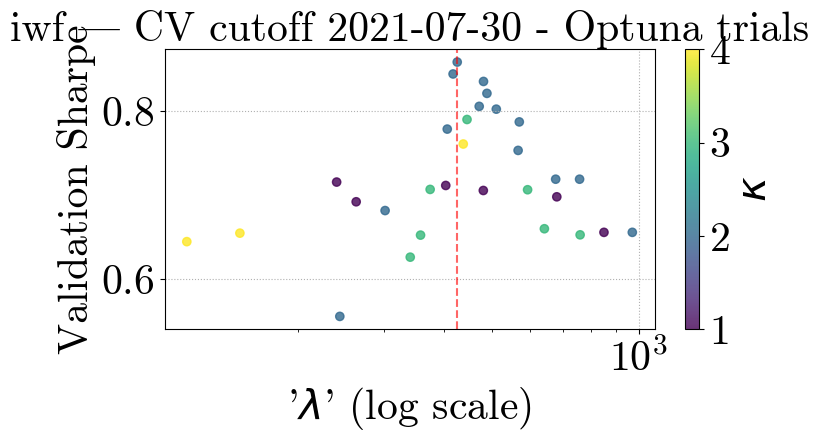

[I 2025-05-05 20:05:41,291] A new study created in memory with name: no-name-442c8beb-e9fa-4ea3-ac8c-5bf086c4183c
[I 2025-05-05 20:05:44,875] Trial 0 finished with value: 0.1624140855910321 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: 0.1624140855910321.
[I 2025-05-05 20:05:46,885] Trial 1 finished with value: 0.3013533971093744 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 1 with value: 0.3013533971093744.
[I 2025-05-05 20:05:48,307] Trial 2 finished with value: 0.22705806567361517 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 1 with value: 0.3013533971093744.
[I 2025-05-05 20:05:53,713] Trial 3 finished with value: -0.36943137490088457 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 1 with value: 0.3013533971093744.
[I 2025-05-05 20:05:55,961] Trial 4 finished with value: 0.3013533971093744 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is trial 

Optuna best λ=758.7945, κ=3, Sharpe=0.3014


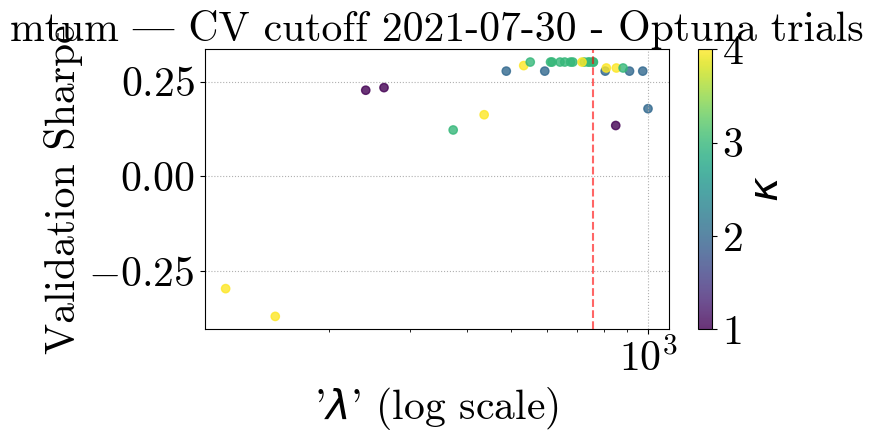

[I 2025-05-05 20:06:58,772] A new study created in memory with name: no-name-e20e0581-d52f-4ff2-9617-af0b256e1bb8
[I 2025-05-05 20:07:02,266] Trial 0 finished with value: -0.0035634873001502525 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: -0.0035634873001502525.
[I 2025-05-05 20:07:05,343] Trial 1 finished with value: 0.5196137522433947 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 1 with value: 0.5196137522433947.
[I 2025-05-05 20:07:07,238] Trial 2 finished with value: 0.4502041716341841 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 1 with value: 0.5196137522433947.
[I 2025-05-05 20:07:10,174] Trial 3 finished with value: -0.02476810453641397 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 1 with value: 0.5196137522433947.
[I 2025-05-05 20:07:13,320] Trial 4 finished with value: 0.609301470081764 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is 

Optuna best λ=764.7761, κ=1, Sharpe=0.8858


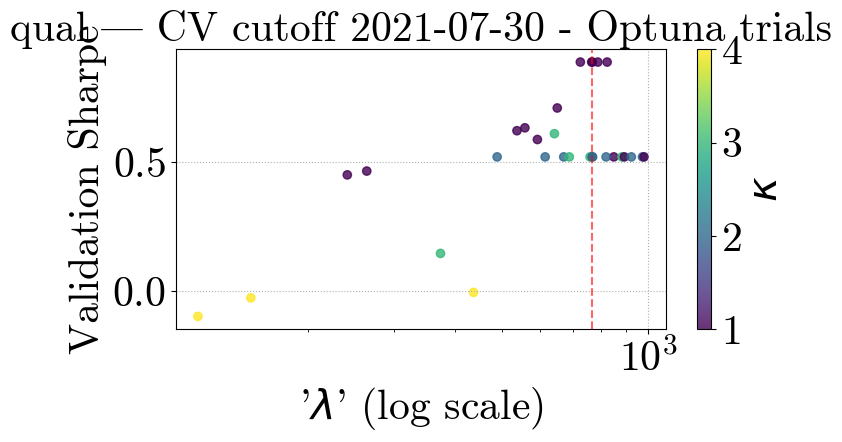

[I 2025-05-05 20:08:31,098] A new study created in memory with name: no-name-d4245fc6-3a59-415c-b961-aafdf056adf5
[I 2025-05-05 20:08:33,496] Trial 0 finished with value: 0.5818636334026374 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: 0.5818636334026374.
[I 2025-05-05 20:08:35,605] Trial 1 finished with value: 0.5183278999954938 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: 0.5818636334026374.
[I 2025-05-05 20:08:38,447] Trial 2 finished with value: 0.4056226578633203 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 0 with value: 0.5818636334026374.
[I 2025-05-05 20:08:41,945] Trial 3 finished with value: -0.04154704752832778 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 0 with value: 0.5818636334026374.
[I 2025-05-05 20:08:44,169] Trial 4 finished with value: 0.5743480747877625 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is trial 0

Optuna best λ=599.4554, κ=3, Sharpe=0.5997


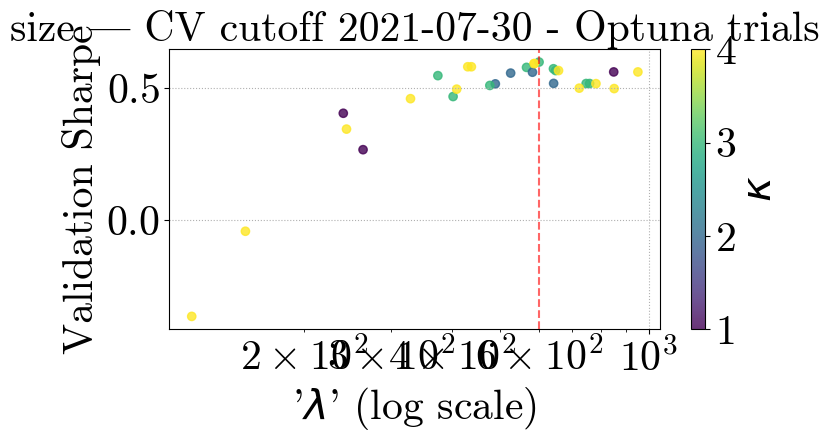

[I 2025-05-05 20:09:49,190] A new study created in memory with name: no-name-f3d731ea-ab52-4eed-ab1f-de145698cb9f
[I 2025-05-05 20:09:51,586] Trial 0 finished with value: -1.37237487432244 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: -1.37237487432244.
[I 2025-05-05 20:09:53,809] Trial 1 finished with value: -0.055313033774027784 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 1 with value: -0.055313033774027784.
[I 2025-05-05 20:09:55,333] Trial 2 finished with value: -1.3762433151650741 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 1 with value: -0.055313033774027784.
[I 2025-05-05 20:09:58,992] Trial 3 finished with value: -0.5497827320025509 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 1 with value: -0.055313033774027784.
[I 2025-05-05 20:10:01,125] Trial 4 finished with value: -0.4317461511772623 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best

Optuna best λ=807.9563, κ=2, Sharpe=0.3891


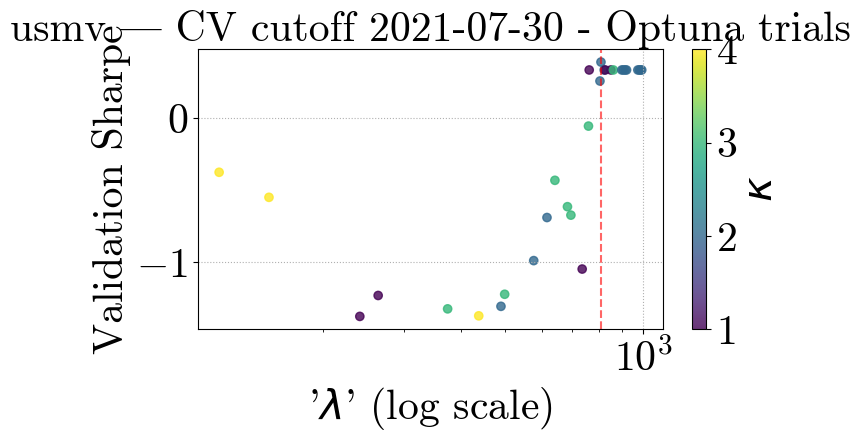

[I 2025-05-05 20:10:56,854] A new study created in memory with name: no-name-9d285a68-fffd-46e9-a751-aa7798bc6ab3
[I 2025-05-05 20:11:00,563] Trial 0 finished with value: 0.009595428728961266 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: 0.009595428728961266.
[I 2025-05-05 20:11:02,381] Trial 1 finished with value: -0.6947073380463322 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: 0.009595428728961266.
[I 2025-05-05 20:11:04,264] Trial 2 finished with value: 0.003902844396387167 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 0 with value: 0.009595428728961266.
[I 2025-05-05 20:11:08,716] Trial 3 finished with value: 0.19450398344668557 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 3 with value: 0.19450398344668557.
[I 2025-05-05 20:11:10,710] Trial 4 finished with value: -0.564855598073672 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best

Optuna best λ=375.3876, κ=3, Sharpe=0.3553


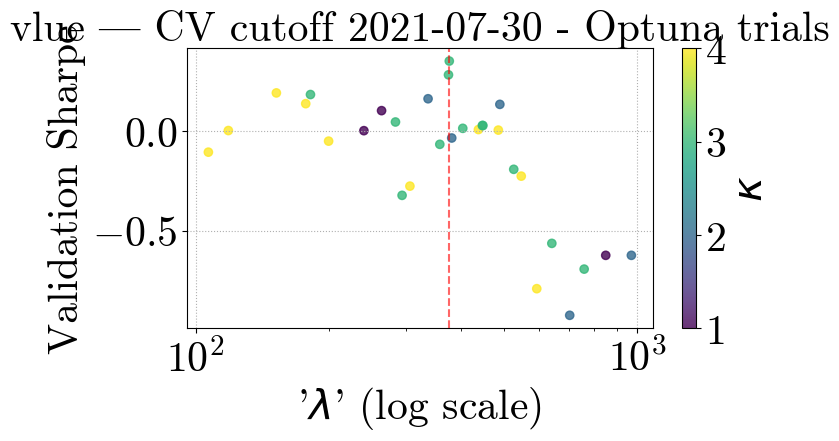

[I 2025-05-05 20:12:30,760] A new study created in memory with name: no-name-a9781d7f-669b-4865-b702-470b395ae8d2
[I 2025-05-05 20:12:33,349] Trial 0 finished with value: 0.5918406988869651 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: 0.5918406988869651.
[I 2025-05-05 20:12:36,263] Trial 1 finished with value: 0.5872581578470673 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: 0.5918406988869651.
[I 2025-05-05 20:12:38,055] Trial 2 finished with value: 0.5586062315457976 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 0 with value: 0.5918406988869651.
[I 2025-05-05 20:12:41,324] Trial 3 finished with value: 0.4538700726881374 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 0 with value: 0.5918406988869651.
[I 2025-05-05 20:12:44,489] Trial 4 finished with value: 0.5872581578470673 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is trial 0 w

Optuna best λ=459.9073, κ=4, Sharpe=0.6585


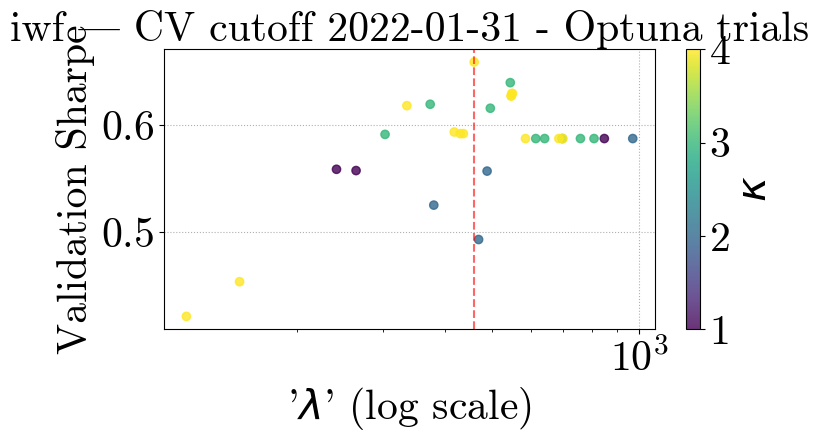

[I 2025-05-05 20:13:48,857] A new study created in memory with name: no-name-6e4d25ab-a3b6-42bb-aff5-594bd42f6175
[I 2025-05-05 20:13:51,279] Trial 0 finished with value: -0.20101843029018418 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: -0.20101843029018418.
[I 2025-05-05 20:13:53,415] Trial 1 finished with value: 0.1023862090625773 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 1 with value: 0.1023862090625773.
[I 2025-05-05 20:13:54,997] Trial 2 finished with value: -0.002099882220746192 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 1 with value: 0.1023862090625773.
[I 2025-05-05 20:14:00,456] Trial 3 finished with value: -0.18912468636478738 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 1 with value: 0.1023862090625773.
[I 2025-05-05 20:14:02,716] Trial 4 finished with value: 0.1023862090625773 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is 

Optuna best λ=729.2155, κ=1, Sharpe=1.0211


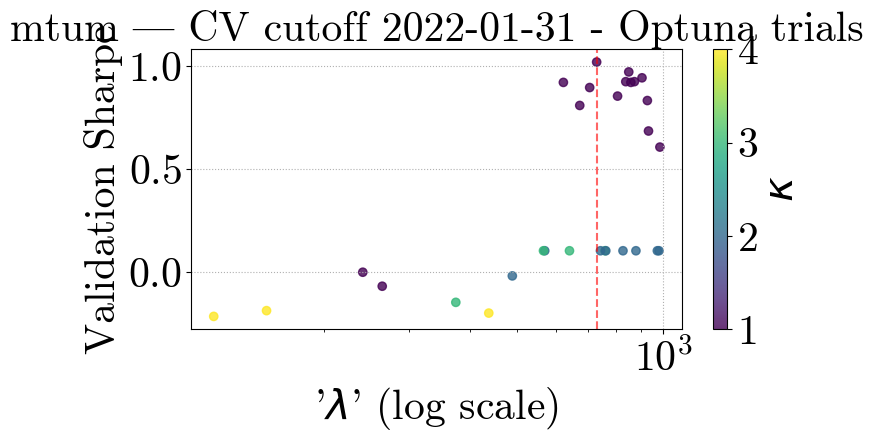

[I 2025-05-05 20:14:59,361] A new study created in memory with name: no-name-eeb039e7-7895-46d1-ab04-176ddfeca1c3
[I 2025-05-05 20:15:02,737] Trial 0 finished with value: -0.22434011337444376 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: -0.22434011337444376.
[I 2025-05-05 20:15:04,901] Trial 1 finished with value: 0.2098824794909263 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 1 with value: 0.2098824794909263.
[I 2025-05-05 20:15:06,721] Trial 2 finished with value: 0.018663532595396316 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 1 with value: 0.2098824794909263.
[I 2025-05-05 20:15:10,587] Trial 3 finished with value: -0.08337734958168175 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 1 with value: 0.2098824794909263.
[I 2025-05-05 20:15:13,398] Trial 4 finished with value: 0.2098824794909263 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is t

Optuna best λ=488.7505, κ=2, Sharpe=0.2099


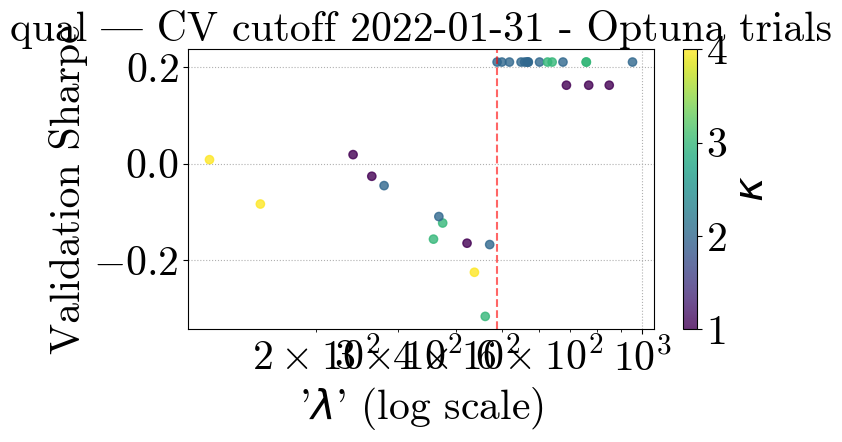

[I 2025-05-05 20:16:42,302] A new study created in memory with name: no-name-fab0600c-698f-4e93-acc5-6575f66a00a9
[I 2025-05-05 20:16:44,756] Trial 0 finished with value: 0.6399120195474278 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: 0.6399120195474278.
[I 2025-05-05 20:16:46,744] Trial 1 finished with value: 0.6290481333421506 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: 0.6399120195474278.
[I 2025-05-05 20:16:48,911] Trial 2 finished with value: 0.5679787596694972 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 0 with value: 0.6399120195474278.
[I 2025-05-05 20:16:52,049] Trial 3 finished with value: -0.12239196702809514 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 0 with value: 0.6399120195474278.
[I 2025-05-05 20:16:55,090] Trial 4 finished with value: 0.6052630039633944 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is trial 0

Optuna best λ=849.1984, κ=1, Sharpe=0.6973


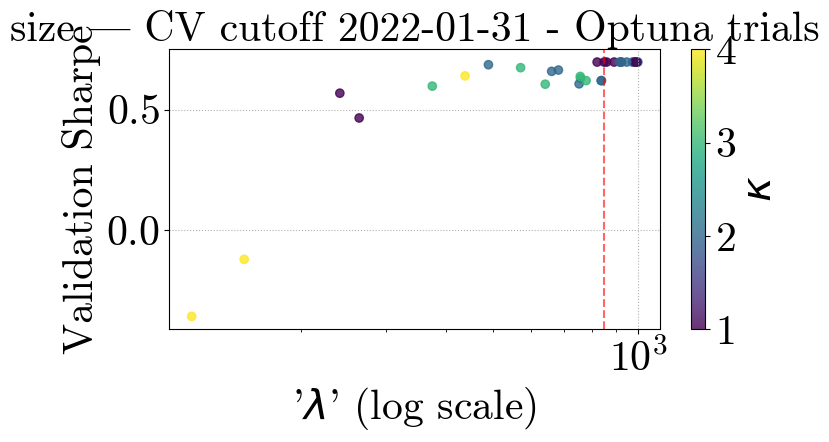

[I 2025-05-05 20:17:41,684] A new study created in memory with name: no-name-cfe8dd26-46ac-4a2b-8685-a15c51871757
[I 2025-05-05 20:17:43,891] Trial 0 finished with value: -1.2135769573378068 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: -1.2135769573378068.
[I 2025-05-05 20:17:46,044] Trial 1 finished with value: -0.6408885657154101 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 1 with value: -0.6408885657154101.
[I 2025-05-05 20:17:47,705] Trial 2 finished with value: -1.0951578612421726 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 1 with value: -0.6408885657154101.
[I 2025-05-05 20:17:52,960] Trial 3 finished with value: -0.779822693946126 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 1 with value: -0.6408885657154101.
[I 2025-05-05 20:17:55,085] Trial 4 finished with value: -1.1707834490442954 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is t

Optuna best λ=118.5260, κ=4, Sharpe=-0.6206


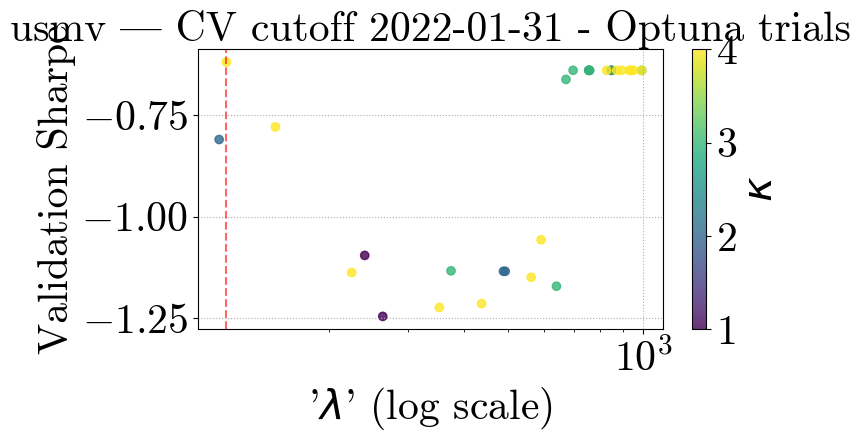

[I 2025-05-05 20:19:03,971] A new study created in memory with name: no-name-c4f2ab82-6ede-49fe-b46e-f586e0c756af
[I 2025-05-05 20:19:07,541] Trial 0 finished with value: 0.04079968611006255 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: 0.04079968611006255.
[I 2025-05-05 20:19:09,993] Trial 1 finished with value: -0.38937122167975385 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: 0.04079968611006255.
[I 2025-05-05 20:19:11,872] Trial 2 finished with value: 0.16394244327342344 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 2 with value: 0.16394244327342344.
[I 2025-05-05 20:19:15,425] Trial 3 finished with value: 0.28990836646721313 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 3 with value: 0.28990836646721313.
[I 2025-05-05 20:19:18,225] Trial 4 finished with value: 0.06579663394275713 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is

Optuna best λ=287.2865, κ=4, Sharpe=0.5986


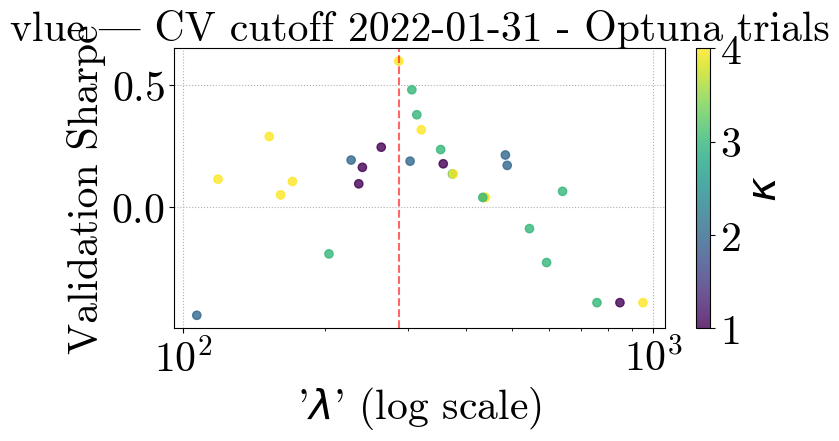

[I 2025-05-05 20:20:41,352] A new study created in memory with name: no-name-bd377294-5fa0-4afd-8bf8-8a6b95718af1
[I 2025-05-05 20:20:43,712] Trial 0 finished with value: 0.1475398894157626 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: 0.1475398894157626.
[I 2025-05-05 20:20:45,412] Trial 1 finished with value: 0.09388016568172551 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: 0.1475398894157626.
[I 2025-05-05 20:20:46,980] Trial 2 finished with value: 0.09627808913901045 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 0 with value: 0.1475398894157626.
[I 2025-05-05 20:20:50,681] Trial 3 finished with value: 0.20448142933938254 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 3 with value: 0.20448142933938254.
[I 2025-05-05 20:20:52,057] Trial 4 finished with value: -0.14259974795794544 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is tri

Optuna best λ=955.6456, κ=1, Sharpe=0.3445


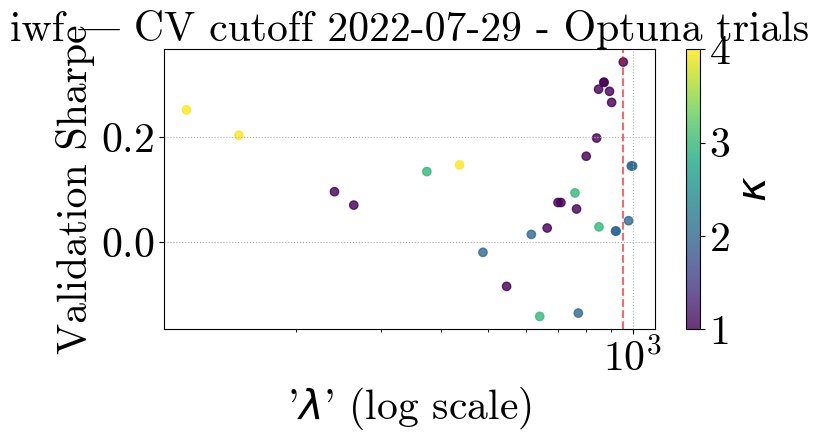

[I 2025-05-05 20:21:30,446] A new study created in memory with name: no-name-8068574a-5e00-49e1-bce0-aab703a20ef7
[I 2025-05-05 20:21:32,562] Trial 0 finished with value: -0.09617433804174529 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: -0.09617433804174529.
[I 2025-05-05 20:21:34,701] Trial 1 finished with value: -0.08701966523638628 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 1 with value: -0.08701966523638628.
[I 2025-05-05 20:21:36,188] Trial 2 finished with value: -0.06132960374389967 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 2 with value: -0.06132960374389967.
[I 2025-05-05 20:21:43,280] Trial 3 finished with value: -0.13167830037116326 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 2 with value: -0.06132960374389967.
[I 2025-05-05 20:21:45,201] Trial 4 finished with value: -0.15414203712234492 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}.

Optuna best λ=849.1984, κ=1, Sharpe=0.2110


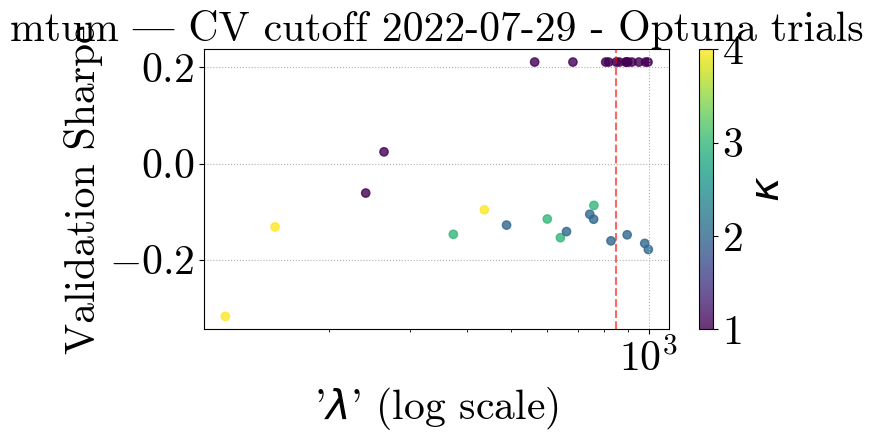

[I 2025-05-05 20:22:34,427] A new study created in memory with name: no-name-7e85d75c-a6dd-493b-9c69-8ae6299790fd
[I 2025-05-05 20:22:37,903] Trial 0 finished with value: -0.2647817336666736 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: -0.2647817336666736.
[I 2025-05-05 20:22:40,651] Trial 1 finished with value: -0.16339114495487808 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 1 with value: -0.16339114495487808.
[I 2025-05-05 20:22:42,303] Trial 2 finished with value: -0.025073331611104064 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 2 with value: -0.025073331611104064.
[I 2025-05-05 20:22:45,266] Trial 3 finished with value: -0.2711935121009891 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 2 with value: -0.025073331611104064.
[I 2025-05-05 20:22:48,165] Trial 4 finished with value: -0.08014759942269058 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}.

Optuna best λ=565.3012, κ=1, Sharpe=0.1255


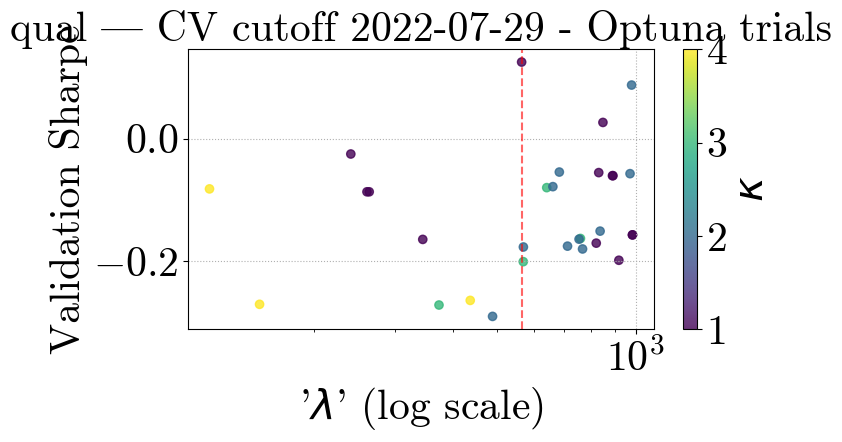

[I 2025-05-05 20:23:49,142] A new study created in memory with name: no-name-d2e6c0c4-8a38-4f2a-86ac-ccb4bc60630c
[I 2025-05-05 20:23:52,142] Trial 0 finished with value: 0.5827133642515706 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: 0.5827133642515706.
[I 2025-05-05 20:23:54,727] Trial 1 finished with value: 0.5997504067409098 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 1 with value: 0.5997504067409098.
[I 2025-05-05 20:23:56,212] Trial 2 finished with value: 0.4558849619381501 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 1 with value: 0.5997504067409098.
[I 2025-05-05 20:24:01,475] Trial 3 finished with value: 0.24783315916520748 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 1 with value: 0.5997504067409098.
[I 2025-05-05 20:24:04,359] Trial 4 finished with value: 0.5962206189991237 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is trial 1 

Optuna best λ=599.2055, κ=3, Sharpe=0.6012


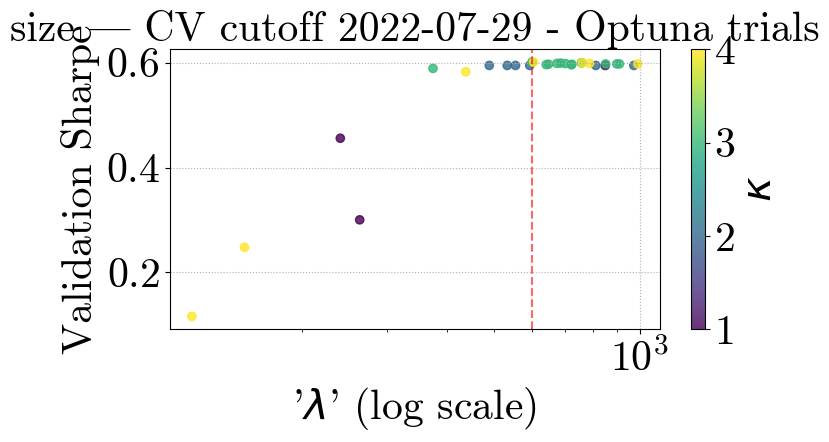

[I 2025-05-05 20:25:14,838] A new study created in memory with name: no-name-5b333eda-7d0b-4315-a75d-1eb1712fd387
[I 2025-05-05 20:25:17,052] Trial 0 finished with value: -1.0312304061164348 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: -1.0312304061164348.
[I 2025-05-05 20:25:19,432] Trial 1 finished with value: -0.6110736487259874 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 1 with value: -0.6110736487259874.
[I 2025-05-05 20:25:20,992] Trial 2 finished with value: -0.40811649130829863 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 2 with value: -0.40811649130829863.
[I 2025-05-05 20:25:26,580] Trial 3 finished with value: -0.17802280564404568 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 3 with value: -0.17802280564404568.
[I 2025-05-05 20:25:28,824] Trial 4 finished with value: -0.7737147664106189 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best

Optuna best λ=164.8054, κ=4, Sharpe=-0.0553


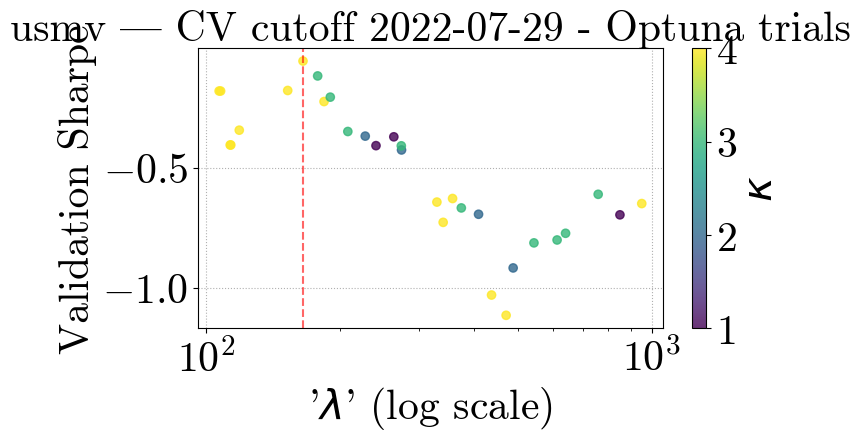

[I 2025-05-05 20:26:50,838] A new study created in memory with name: no-name-1ff44daa-8e04-48ec-805e-c22e658f31cd
[I 2025-05-05 20:26:53,937] Trial 0 finished with value: -0.006748498473252616 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: -0.006748498473252616.
[I 2025-05-05 20:26:56,527] Trial 1 finished with value: 0.056496539156395645 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 1 with value: 0.056496539156395645.
[I 2025-05-05 20:26:58,351] Trial 2 finished with value: 0.5021612885253063 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 2 with value: 0.5021612885253063.
[I 2025-05-05 20:27:02,253] Trial 3 finished with value: 0.34970574850760155 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 2 with value: 0.5021612885253063.
[I 2025-05-05 20:27:05,066] Trial 4 finished with value: 0.07193034151233899 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best 

Optuna best λ=263.6425, κ=1, Sharpe=0.6095


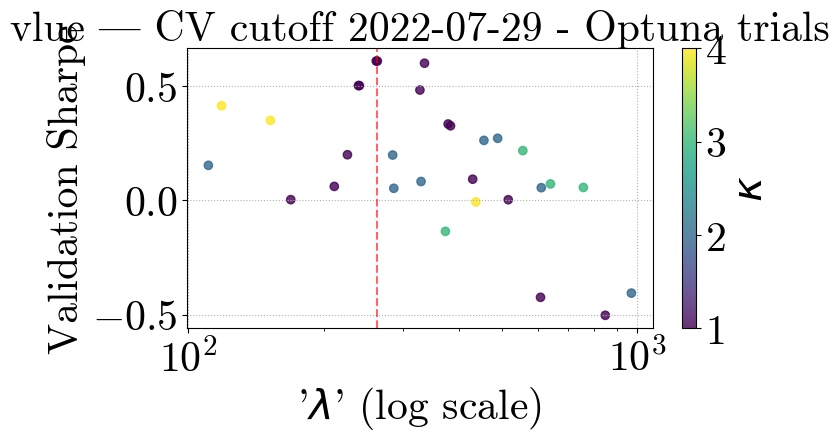

[I 2025-05-05 20:28:07,686] A new study created in memory with name: no-name-54ce1711-bc84-49a3-9bfa-094066db7bc2
[I 2025-05-05 20:28:10,037] Trial 0 finished with value: -0.06077591724157967 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: -0.06077591724157967.
[I 2025-05-05 20:28:11,687] Trial 1 finished with value: -0.2747436495362125 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: -0.06077591724157967.
[I 2025-05-05 20:28:13,303] Trial 2 finished with value: -0.0580969293007959 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 2 with value: -0.0580969293007959.
[I 2025-05-05 20:28:17,404] Trial 3 finished with value: 0.05590302281636168 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 3 with value: 0.05590302281636168.
[I 2025-05-05 20:28:18,702] Trial 4 finished with value: -0.19498844066822923 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best

Optuna best λ=999.4262, κ=1, Sharpe=0.1400


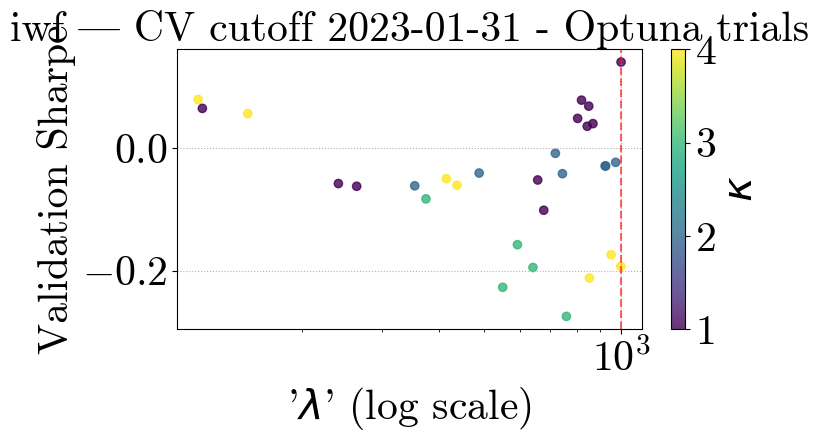

[I 2025-05-05 20:29:03,302] A new study created in memory with name: no-name-f6530bad-c4c7-46c8-8d96-b5f47f55621e
[I 2025-05-05 20:29:07,191] Trial 0 finished with value: -0.0576096620094334 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: -0.0576096620094334.
[I 2025-05-05 20:29:10,776] Trial 1 finished with value: -0.15685827246496367 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: -0.0576096620094334.
[I 2025-05-05 20:29:12,728] Trial 2 finished with value: 0.6955958191922277 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 2 with value: 0.6955958191922277.
[I 2025-05-05 20:29:19,705] Trial 3 finished with value: -0.5613072554169554 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 2 with value: 0.6955958191922277.
[I 2025-05-05 20:29:22,976] Trial 4 finished with value: -0.13548089411448386 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is t

Optuna best λ=240.4168, κ=1, Sharpe=0.6956


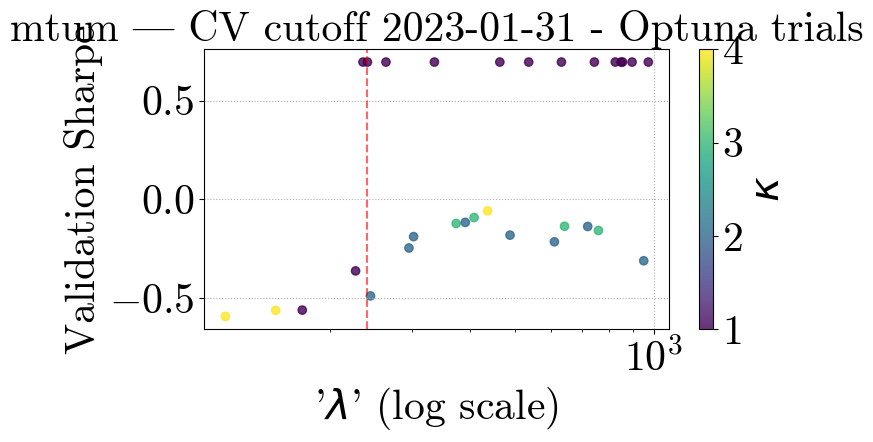

[I 2025-05-05 20:30:29,328] A new study created in memory with name: no-name-bebe802a-c8a9-481a-b9aa-bcafee02eda1
[I 2025-05-05 20:30:34,065] Trial 0 finished with value: -0.07405880029109196 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: -0.07405880029109196.
[I 2025-05-05 20:30:38,722] Trial 1 finished with value: -0.07405880029109196 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: -0.07405880029109196.
[I 2025-05-05 20:30:40,377] Trial 2 finished with value: 0.02077659774661103 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 2 with value: 0.02077659774661103.
[I 2025-05-05 20:30:43,799] Trial 3 finished with value: 0.1315312052744896 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 3 with value: 0.1315312052744896.
[I 2025-05-05 20:30:48,595] Trial 4 finished with value: -0.07405880029109196 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best 

Optuna best λ=113.0654, κ=4, Sharpe=0.3213


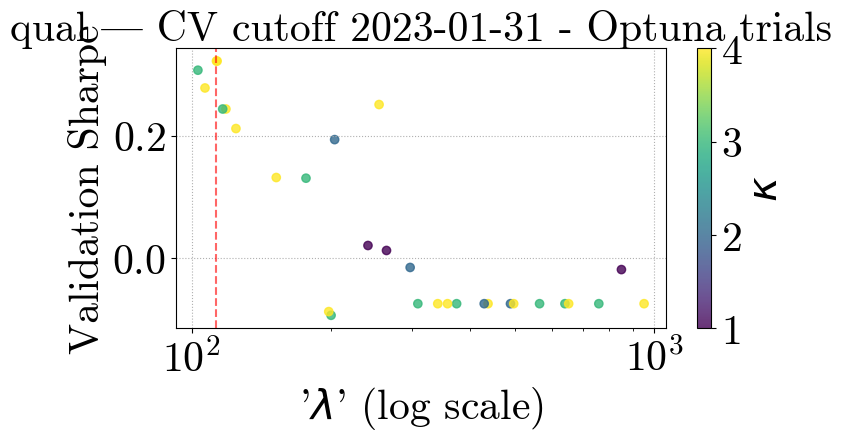

[I 2025-05-05 20:32:31,011] A new study created in memory with name: no-name-f8781371-128f-4219-b4c9-c067dfa1b109
[I 2025-05-05 20:32:33,828] Trial 0 finished with value: 0.3905292777466093 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: 0.3905292777466093.
[I 2025-05-05 20:32:36,159] Trial 1 finished with value: 0.3897037241429677 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: 0.3905292777466093.
[I 2025-05-05 20:32:37,810] Trial 2 finished with value: 0.22589602627375224 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 0 with value: 0.3905292777466093.
[I 2025-05-05 20:32:41,982] Trial 3 finished with value: 0.23898761289014325 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 0 with value: 0.3905292777466093.
[I 2025-05-05 20:32:44,383] Trial 4 finished with value: 0.39313840110184584 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is trial 

Optuna best λ=396.8990, κ=3, Sharpe=0.3978


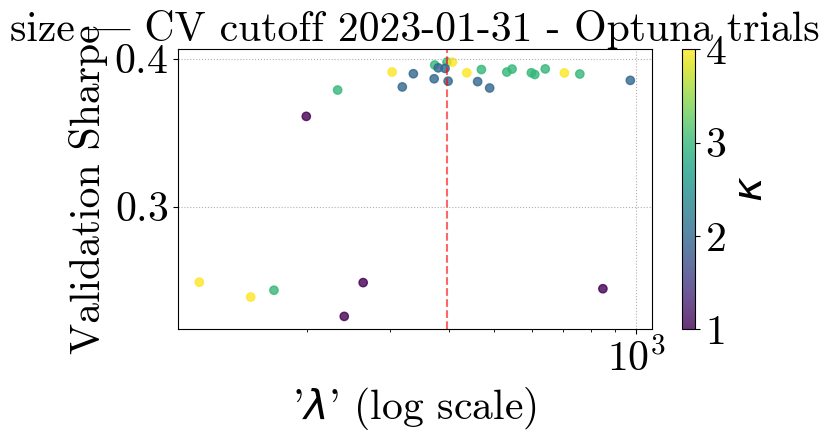

[I 2025-05-05 20:33:57,891] A new study created in memory with name: no-name-a3aab196-00e9-4ff1-a7c3-4315fcde6a06
[I 2025-05-05 20:34:00,062] Trial 0 finished with value: -0.343457911262993 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: -0.343457911262993.
[I 2025-05-05 20:34:01,830] Trial 1 finished with value: -0.7133101287739928 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: -0.343457911262993.
[I 2025-05-05 20:34:03,227] Trial 2 finished with value: -0.14194717219420336 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 2 with value: -0.14194717219420336.
[I 2025-05-05 20:34:06,500] Trial 3 finished with value: -0.08403308652872596 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 3 with value: -0.08403308652872596.
[I 2025-05-05 20:34:08,706] Trial 4 finished with value: -0.5238153120836535 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is

Optuna best λ=178.6162, κ=3, Sharpe=0.2062


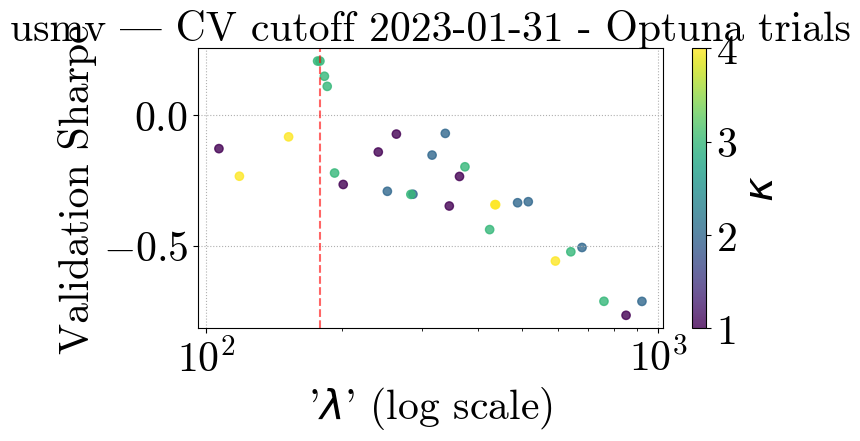

[I 2025-05-05 20:35:16,311] A new study created in memory with name: no-name-521da78c-bc83-4590-ba51-0926908a18d1
[I 2025-05-05 20:35:19,525] Trial 0 finished with value: 0.011593425562362853 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: 0.011593425562362853.
[I 2025-05-05 20:35:22,248] Trial 1 finished with value: -0.012429679833102687 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: 0.011593425562362853.
[I 2025-05-05 20:35:24,093] Trial 2 finished with value: 0.5458069059694483 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 2 with value: 0.5458069059694483.
[I 2025-05-05 20:35:31,279] Trial 3 finished with value: 0.6828164571193279 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 3 with value: 0.6828164571193279.
[I 2025-05-05 20:35:34,427] Trial 4 finished with value: 0.0006485081097658939 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best 

Optuna best λ=373.8180, κ=3, Sharpe=0.7771


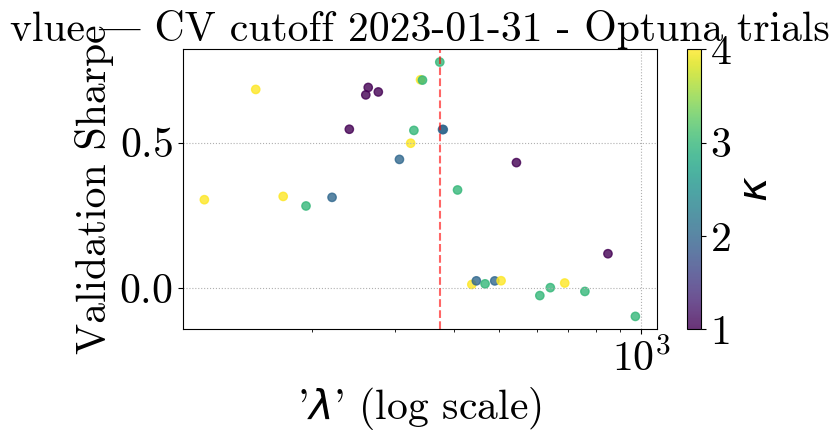

[I 2025-05-05 20:37:09,337] A new study created in memory with name: no-name-38c5ae04-1b72-4e5a-aa6e-b70e767f2cee
[I 2025-05-05 20:37:12,618] Trial 0 finished with value: -0.05935374507873351 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: -0.05935374507873351.
[I 2025-05-05 20:37:15,680] Trial 1 finished with value: -0.03878627860950789 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 1 with value: -0.03878627860950789.
[I 2025-05-05 20:37:17,475] Trial 2 finished with value: -0.21537782442594397 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 1 with value: -0.03878627860950789.
[I 2025-05-05 20:37:22,919] Trial 3 finished with value: -0.17823952856505879 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 1 with value: -0.03878627860950789.
[I 2025-05-05 20:37:25,774] Trial 4 finished with value: -0.044108089663983746 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}

Optuna best λ=832.3960, κ=1, Sharpe=0.0447


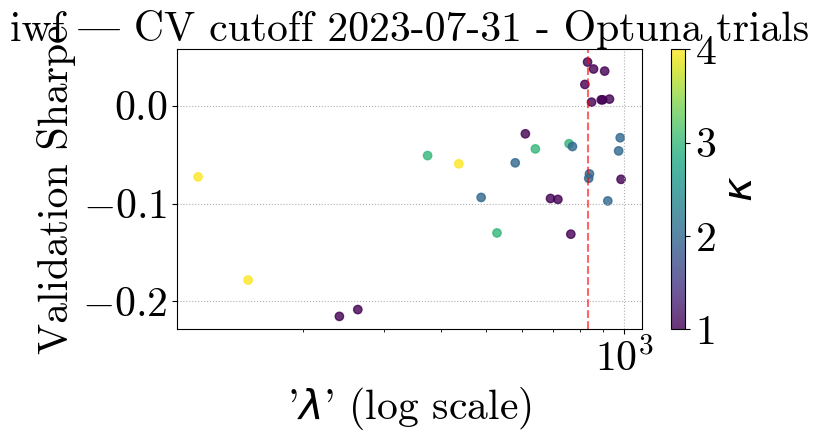

[I 2025-05-05 20:38:20,209] A new study created in memory with name: no-name-eb578516-284e-4408-a3db-8a3541609fb3
[I 2025-05-05 20:38:21,712] Trial 0 finished with value: -0.3996323208054902 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: -0.3996323208054902.
[I 2025-05-05 20:38:22,913] Trial 1 finished with value: -0.08087524403769052 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 1 with value: -0.08087524403769052.
[I 2025-05-05 20:38:24,618] Trial 2 finished with value: -1.0532790370077796 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 1 with value: -0.08087524403769052.
[I 2025-05-05 20:38:29,457] Trial 3 finished with value: -1.106244765279871 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 1 with value: -0.08087524403769052.
[I 2025-05-05 20:38:30,771] Trial 4 finished with value: -0.09687161361347099 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best

Optuna best λ=849.1984, κ=1, Sharpe=0.6352


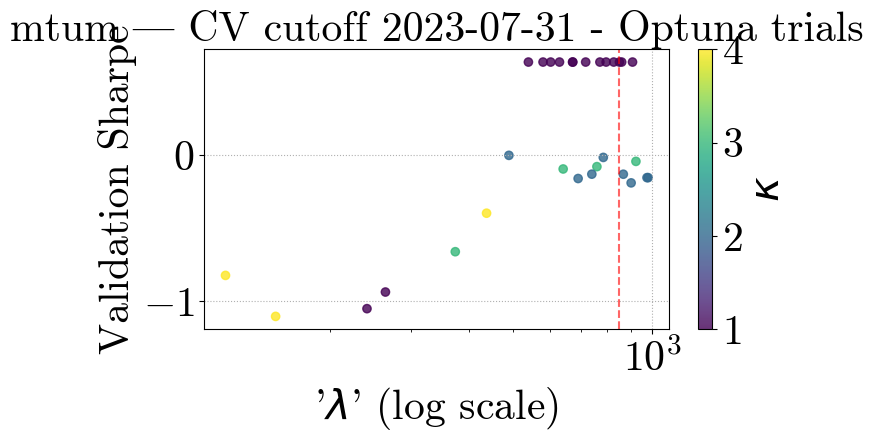

[I 2025-05-05 20:39:10,796] A new study created in memory with name: no-name-a7725cc2-7e20-4878-a446-cf2122300e19
[I 2025-05-05 20:39:15,366] Trial 0 finished with value: 0.37685072262502334 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: 0.37685072262502334.
[I 2025-05-05 20:39:19,457] Trial 1 finished with value: 0.37685072262502334 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: 0.37685072262502334.
[I 2025-05-05 20:39:21,059] Trial 2 finished with value: 0.42004775447489634 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 2 with value: 0.42004775447489634.
[I 2025-05-05 20:39:26,649] Trial 3 finished with value: 0.21276856106514236 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 2 with value: 0.42004775447489634.
[I 2025-05-05 20:39:31,438] Trial 4 finished with value: 0.37685072262502334 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is 

Optuna best λ=302.2059, κ=3, Sharpe=0.6405


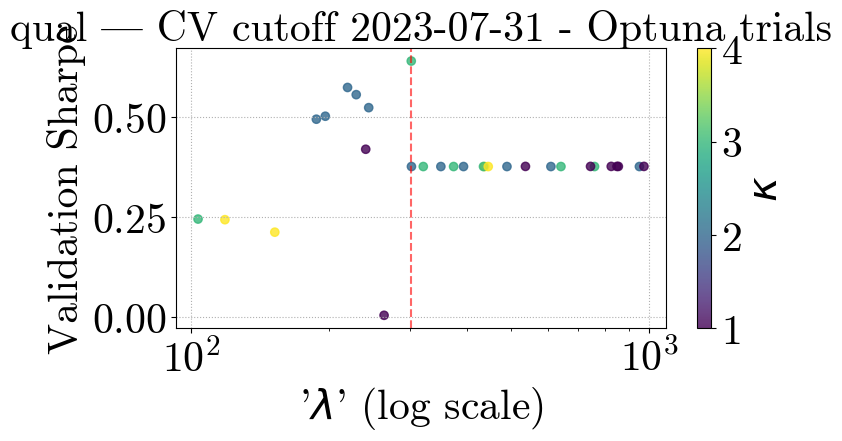

[I 2025-05-05 20:41:01,873] A new study created in memory with name: no-name-4868761d-a3b7-4e5e-9ed5-93b6e1187ddc
[I 2025-05-05 20:41:05,339] Trial 0 finished with value: 0.34881525235838784 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: 0.34881525235838784.
[I 2025-05-05 20:41:07,107] Trial 1 finished with value: 0.37346648032651997 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 1 with value: 0.37346648032651997.
[I 2025-05-05 20:41:09,392] Trial 2 finished with value: 0.37346648032651997 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 1 with value: 0.37346648032651997.
[I 2025-05-05 20:41:15,381] Trial 3 finished with value: 0.17466561028127828 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 1 with value: 0.37346648032651997.
[I 2025-05-05 20:41:17,816] Trial 4 finished with value: 0.37346648032651997 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is 

Optuna best λ=241.7682, κ=3, Sharpe=0.3868


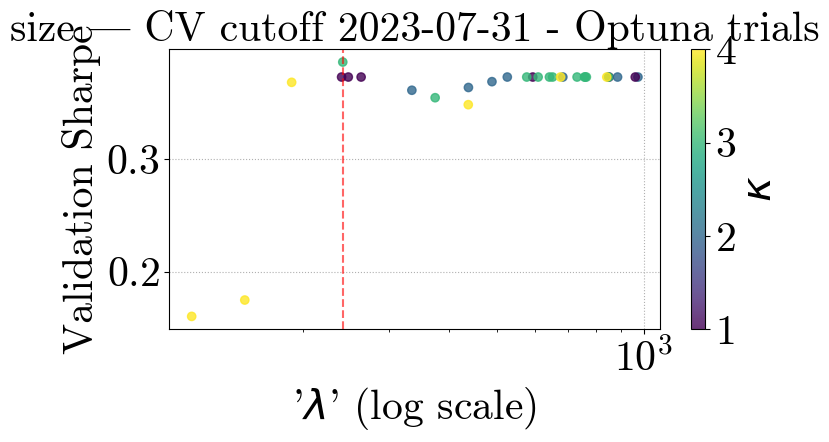

[I 2025-05-05 20:42:26,118] A new study created in memory with name: no-name-d8645720-35f6-40aa-a437-bd1ccf36391a
[I 2025-05-05 20:42:28,903] Trial 0 finished with value: 0.20462913488594087 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: 0.20462913488594087.
[I 2025-05-05 20:42:31,221] Trial 1 finished with value: -0.021352351578064158 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: 0.20462913488594087.
[I 2025-05-05 20:42:32,966] Trial 2 finished with value: -0.45827709649753035 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 0 with value: 0.20462913488594087.
[I 2025-05-05 20:42:37,347] Trial 3 finished with value: 0.22394362423056816 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 3 with value: 0.22394362423056816.
[I 2025-05-05 20:42:39,250] Trial 4 finished with value: 0.20896132140775606 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best 

Optuna best λ=118.5260, κ=4, Sharpe=0.5614


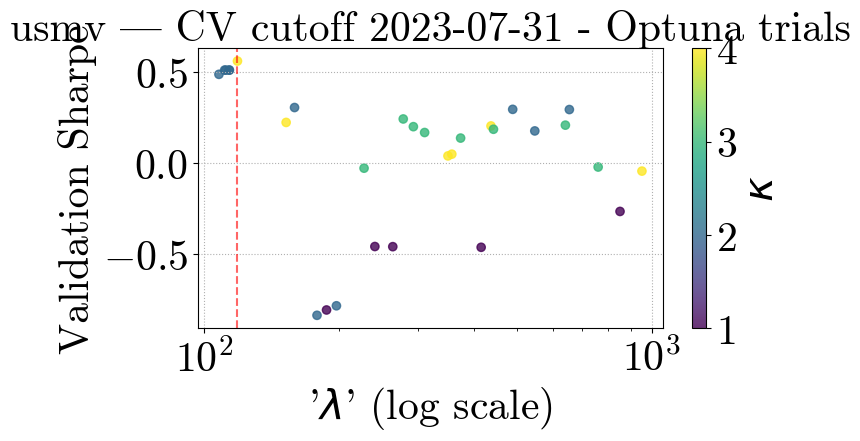

[I 2025-05-05 20:44:06,180] A new study created in memory with name: no-name-58e5049a-eeec-4ad0-9420-a1488410f98c
[I 2025-05-05 20:44:09,427] Trial 0 finished with value: -0.09796909383241838 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: -0.09796909383241838.
[I 2025-05-05 20:44:11,547] Trial 1 finished with value: -0.38317319589041776 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: -0.09796909383241838.
[I 2025-05-05 20:44:13,141] Trial 2 finished with value: 0.31532451712489046 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 2 with value: 0.31532451712489046.
[I 2025-05-05 20:44:17,827] Trial 3 finished with value: -0.06271109507017751 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 2 with value: 0.31532451712489046.
[I 2025-05-05 20:44:20,098] Trial 4 finished with value: -0.826132853934007 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best

Optuna best λ=227.8049, κ=1, Sharpe=0.3552


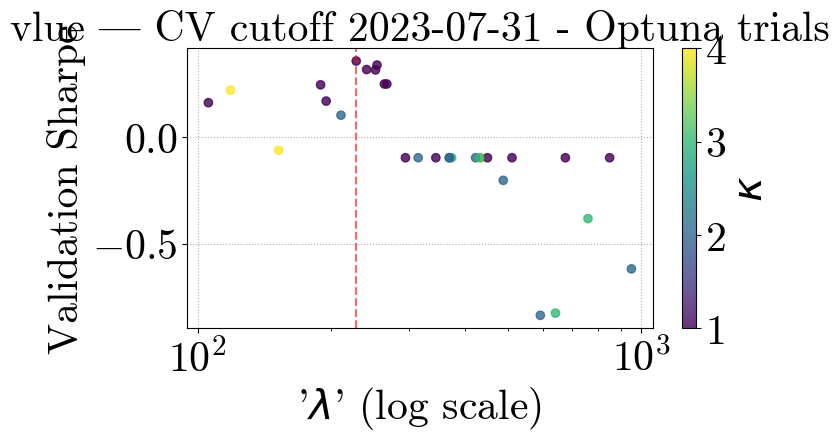

[I 2025-05-05 20:45:20,748] A new study created in memory with name: no-name-2105f4ea-073e-436f-9c91-a4d79e591c4c
[I 2025-05-05 20:45:23,626] Trial 0 finished with value: -0.15695920002005137 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: -0.15695920002005137.
[I 2025-05-05 20:45:26,721] Trial 1 finished with value: -0.20599094656071434 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: -0.15695920002005137.
[I 2025-05-05 20:45:28,386] Trial 2 finished with value: -0.04416581290134694 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 2 with value: -0.04416581290134694.
[I 2025-05-05 20:45:31,719] Trial 3 finished with value: -0.22372673761887857 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 2 with value: -0.04416581290134694.
[I 2025-05-05 20:45:34,783] Trial 4 finished with value: -0.16064221429249742 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}.

Optuna best λ=662.5033, κ=1, Sharpe=0.0484


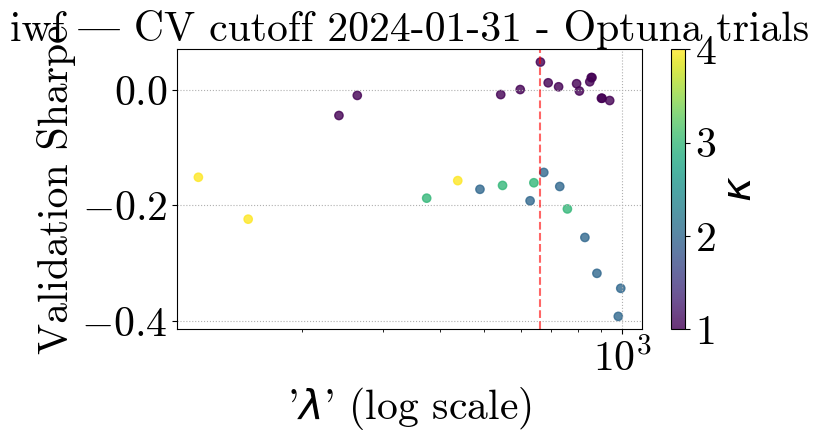

[I 2025-05-05 20:46:26,733] A new study created in memory with name: no-name-0796e703-d3fe-4187-bd61-4c773e1b5064
[I 2025-05-05 20:46:29,159] Trial 0 finished with value: -0.46913096503221785 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: -0.46913096503221785.
[I 2025-05-05 20:46:31,613] Trial 1 finished with value: -0.4629553389960346 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 1 with value: -0.4629553389960346.
[I 2025-05-05 20:46:33,174] Trial 2 finished with value: -0.4607620594501545 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 2 with value: -0.4607620594501545.
[I 2025-05-05 20:46:36,263] Trial 3 finished with value: -0.46678403944978325 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 2 with value: -0.4607620594501545.
[I 2025-05-05 20:46:38,885] Trial 4 finished with value: -0.4629553389960346 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best 

Optuna best λ=849.1984, κ=1, Sharpe=-0.4301


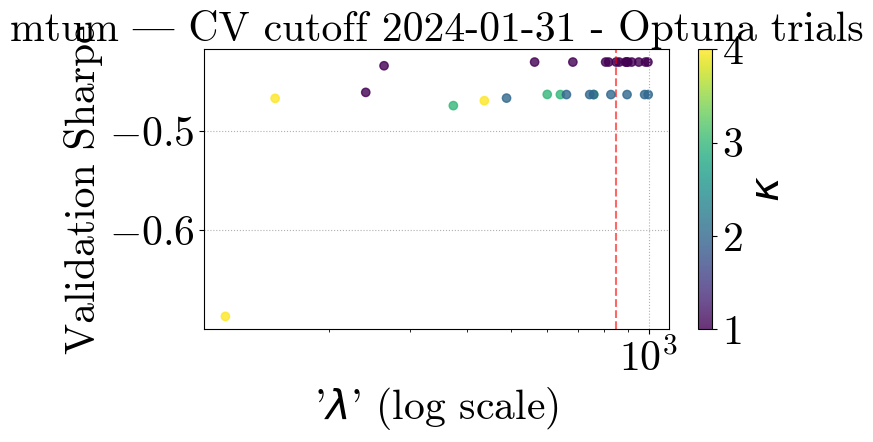

[I 2025-05-05 20:47:24,450] A new study created in memory with name: no-name-c3ad62a1-14a9-4377-ad82-41f3b831bbc8
[I 2025-05-05 20:47:26,803] Trial 0 finished with value: 0.03009874847117666 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: 0.03009874847117666.
[I 2025-05-05 20:47:28,699] Trial 1 finished with value: 0.03009874847117666 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: 0.03009874847117666.
[I 2025-05-05 20:47:30,244] Trial 2 finished with value: -0.17526472016343303 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 0 with value: 0.03009874847117666.
[I 2025-05-05 20:47:34,477] Trial 3 finished with value: -0.19051266258160487 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 0 with value: 0.03009874847117666.
[I 2025-05-05 20:47:36,249] Trial 4 finished with value: 0.03009874847117666 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best i

Optuna best λ=203.6530, κ=2, Sharpe=0.9443


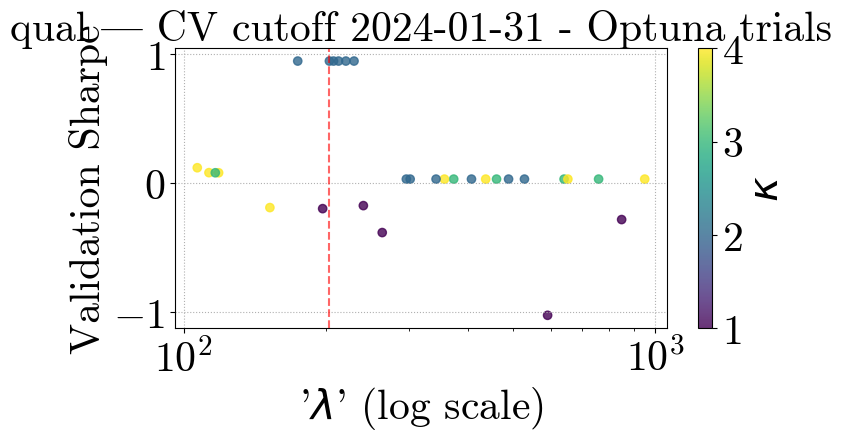

[I 2025-05-05 20:48:47,300] A new study created in memory with name: no-name-e1d90899-99dd-40d3-aab3-adf3ce8a609b
[I 2025-05-05 20:48:49,192] Trial 0 finished with value: 0.427268902260415 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: 0.427268902260415.
[I 2025-05-05 20:48:49,916] Trial 1 finished with value: 0.427268902260415 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: 0.427268902260415.
[I 2025-05-05 20:48:51,741] Trial 2 finished with value: 0.1565179119490993 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 0 with value: 0.427268902260415.
[I 2025-05-05 20:48:56,094] Trial 3 finished with value: 0.24214416735176195 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 0 with value: 0.427268902260415.
[I 2025-05-05 20:48:56,885] Trial 4 finished with value: 0.427268902260415 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is trial 0 with va

Optuna best λ=437.0861, κ=4, Sharpe=0.4273


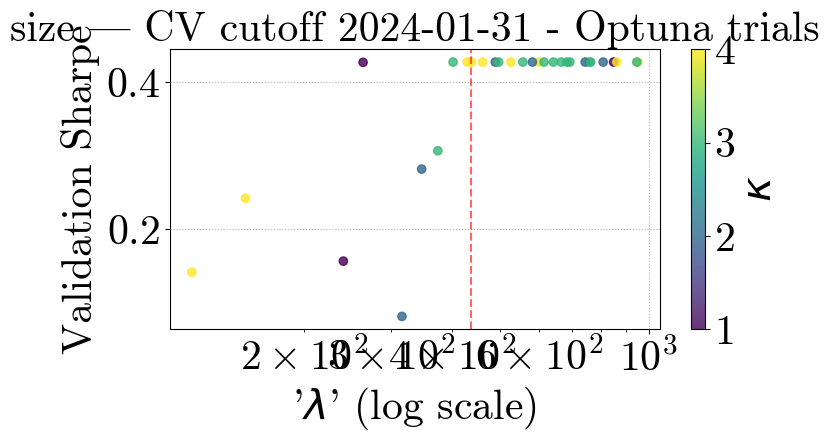

[I 2025-05-05 20:49:37,913] A new study created in memory with name: no-name-0fc6481d-4242-40f1-9b43-3bb94195ae66
[I 2025-05-05 20:49:40,808] Trial 0 finished with value: -0.3331740905262573 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: -0.3331740905262573.
[I 2025-05-05 20:49:41,240] Trial 1 finished with value: -0.025820646506187886 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 1 with value: -0.025820646506187886.
[I 2025-05-05 20:49:42,759] Trial 2 finished with value: -0.13925241489005458 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 1 with value: -0.025820646506187886.
[I 2025-05-05 20:49:47,427] Trial 3 finished with value: 0.7173623171512301 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 3 with value: 0.7173623171512301.
[I 2025-05-05 20:49:49,999] Trial 4 finished with value: -0.20790807353738047 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Be

Optuna best λ=145.2804, κ=4, Sharpe=0.7424


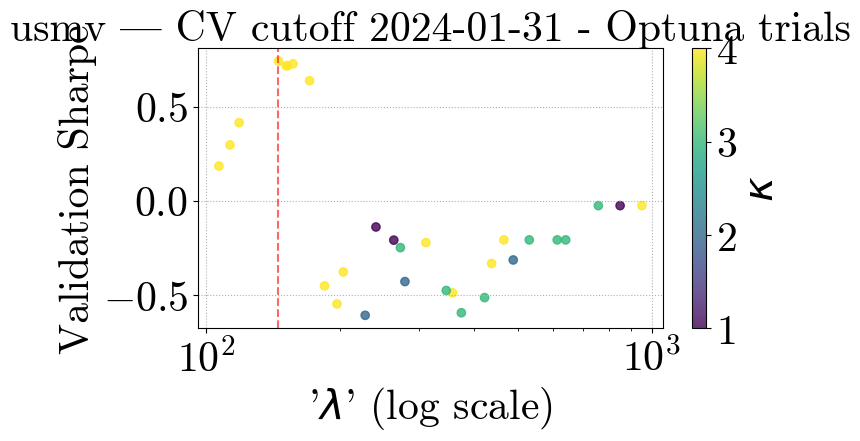

[I 2025-05-05 20:51:15,745] A new study created in memory with name: no-name-34851750-adec-4485-a9d8-ff80f1796575
[I 2025-05-05 20:51:20,176] Trial 0 finished with value: 0.16868331829882807 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: 0.16868331829882807.
[I 2025-05-05 20:51:23,148] Trial 1 finished with value: 0.37264578844772334 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 1 with value: 0.37264578844772334.
[I 2025-05-05 20:51:25,602] Trial 2 finished with value: 0.16868331829882816 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 1 with value: 0.37264578844772334.
[I 2025-05-05 20:51:30,760] Trial 3 finished with value: -0.288740675616017 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 1 with value: 0.37264578844772334.
[I 2025-05-05 20:51:33,218] Trial 4 finished with value: 0.37264578844772334 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is t

Optuna best λ=758.7945, κ=3, Sharpe=0.3726


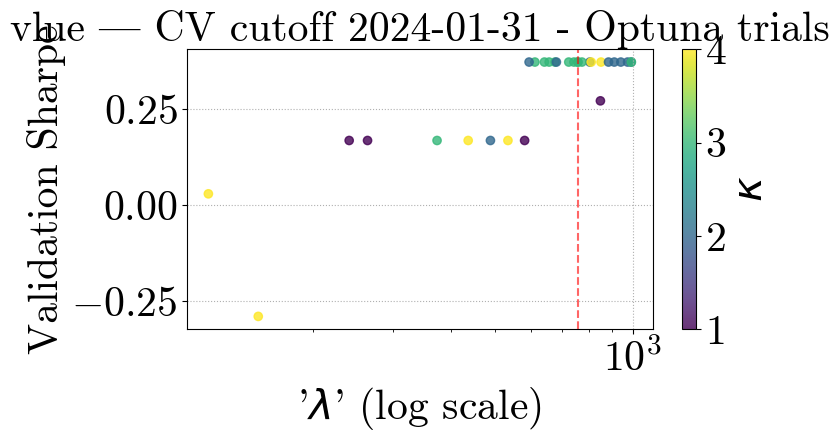

[I 2025-05-05 20:52:34,387] A new study created in memory with name: no-name-7353791c-3c7b-4804-bdcc-d0203f9becf5
[I 2025-05-05 20:52:35,946] Trial 0 finished with value: 0.04343469673547703 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: 0.04343469673547703.
[I 2025-05-05 20:52:37,191] Trial 1 finished with value: 0.09410854868646543 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 1 with value: 0.09410854868646543.
[I 2025-05-05 20:52:38,736] Trial 2 finished with value: 0.266418432259749 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 2 with value: 0.266418432259749.
[I 2025-05-05 20:52:42,274] Trial 3 finished with value: 0.13527127649094223 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 2 with value: 0.266418432259749.
[I 2025-05-05 20:52:43,824] Trial 4 finished with value: 0.023583858035953028 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is trial

Optuna best λ=894.8522, κ=1, Sharpe=0.2827


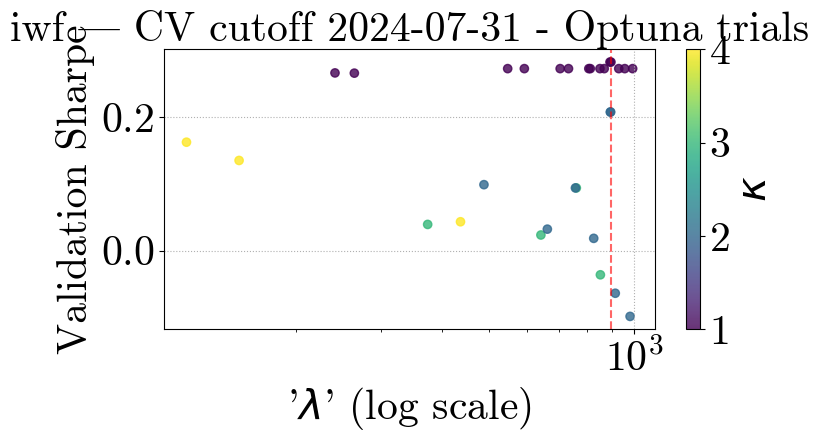

[I 2025-05-05 20:53:26,136] A new study created in memory with name: no-name-782f4c2f-48e2-49d3-a21d-b72e58d95c46
[I 2025-05-05 20:53:28,756] Trial 0 finished with value: 0.3077019851866844 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: 0.3077019851866844.
[I 2025-05-05 20:53:31,485] Trial 1 finished with value: 0.49000941428512457 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 1 with value: 0.49000941428512457.
[I 2025-05-05 20:53:33,213] Trial 2 finished with value: 0.614048320447389 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 2 with value: 0.614048320447389.
[I 2025-05-05 20:53:36,531] Trial 3 finished with value: 0.27255945969428375 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 2 with value: 0.614048320447389.
[I 2025-05-05 20:53:39,096] Trial 4 finished with value: 0.4060742166047003 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is trial 2 w

Optuna best λ=262.0603, κ=1, Sharpe=0.8646


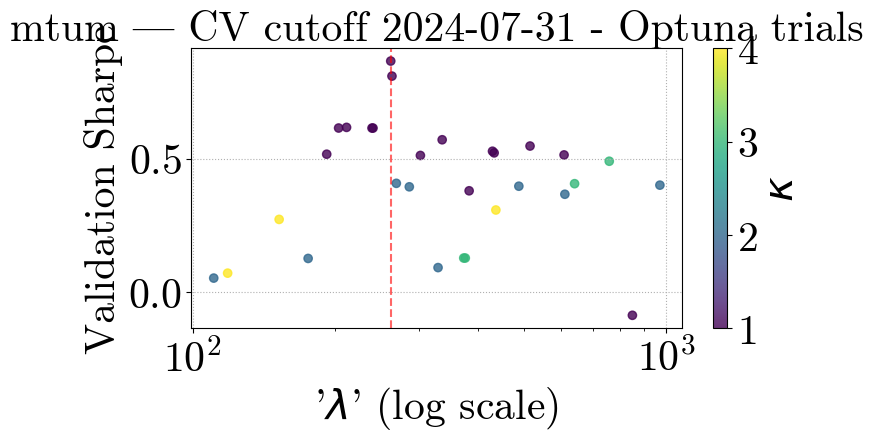

[I 2025-05-05 20:54:33,571] A new study created in memory with name: no-name-c9c2a64e-853b-4a8b-a52f-06ae0e9420b3
[I 2025-05-05 20:54:35,590] Trial 0 finished with value: -0.23003198477028988 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: -0.23003198477028988.
[I 2025-05-05 20:54:37,535] Trial 1 finished with value: 0.01830071211467115 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 1 with value: 0.01830071211467115.
[I 2025-05-05 20:54:39,231] Trial 2 finished with value: -0.08415635594794202 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 1 with value: 0.01830071211467115.
[I 2025-05-05 20:54:43,163] Trial 3 finished with value: 0.04196438052689941 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 3 with value: 0.04196438052689941.
[I 2025-05-05 20:54:45,172] Trial 4 finished with value: -0.2698968641132833 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best 

Optuna best λ=913.7122, κ=1, Sharpe=0.9838


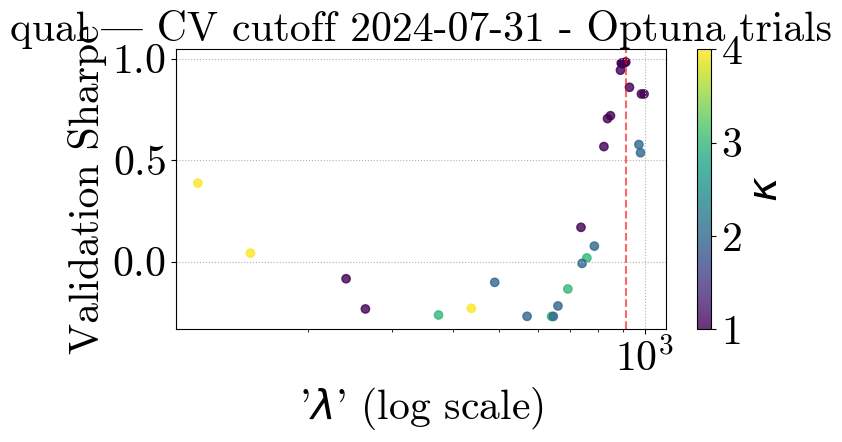

[I 2025-05-05 20:55:31,936] A new study created in memory with name: no-name-5298a603-9b41-4efe-94c3-10fe26115c75
[I 2025-05-05 20:55:32,617] Trial 0 finished with value: 0.5012408687545277 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: 0.5012408687545277.
[I 2025-05-05 20:55:33,409] Trial 1 finished with value: 0.5012408687545277 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: 0.5012408687545277.
[I 2025-05-05 20:55:35,314] Trial 2 finished with value: 0.5012408687545277 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 0 with value: 0.5012408687545277.
[I 2025-05-05 20:55:41,504] Trial 3 finished with value: 0.4537296019263715 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 0 with value: 0.5012408687545277.
[I 2025-05-05 20:55:42,091] Trial 4 finished with value: 0.5012408687545277 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is trial 0 w

Optuna best λ=333.1822, κ=2, Sharpe=0.5013


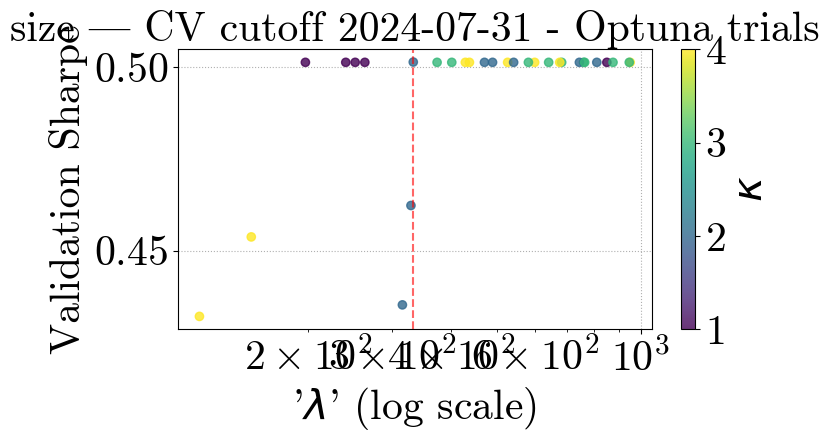

[I 2025-05-05 20:56:19,901] A new study created in memory with name: no-name-5037c6e9-15dc-444e-991b-64c2471a7f79
[I 2025-05-05 20:56:22,395] Trial 0 finished with value: -0.31243282447751525 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: -0.31243282447751525.
[I 2025-05-05 20:56:24,554] Trial 1 finished with value: -0.5261124589145109 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: -0.31243282447751525.
[I 2025-05-05 20:56:25,985] Trial 2 finished with value: -0.32947013206510867 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 0 with value: -0.31243282447751525.
[I 2025-05-05 20:56:32,478] Trial 3 finished with value: 0.6924784855392595 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 3 with value: 0.6924784855392595.
[I 2025-05-05 20:56:34,905] Trial 4 finished with value: -0.7553117580015819 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best 

Optuna best λ=152.2753, κ=4, Sharpe=0.6925


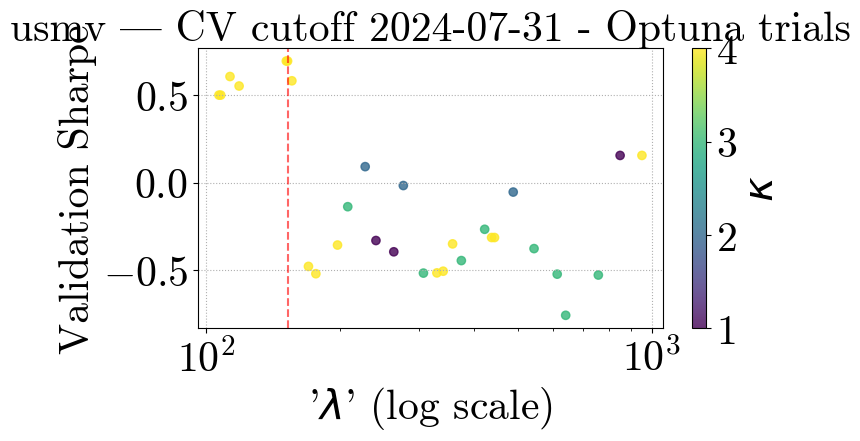

[I 2025-05-05 20:57:58,291] A new study created in memory with name: no-name-00490b89-460c-449b-81bf-58e1ce255e41
[I 2025-05-05 20:58:03,132] Trial 0 finished with value: 0.3718054907594993 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: 0.3718054907594993.
[I 2025-05-05 20:58:05,380] Trial 1 finished with value: 0.3718054907594993 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: 0.3718054907594993.
[I 2025-05-05 20:58:07,140] Trial 2 finished with value: -0.6030681112420057 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 0 with value: 0.3718054907594993.
[I 2025-05-05 20:58:11,798] Trial 3 finished with value: -0.5332711922403954 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 0 with value: 0.3718054907594993.
[I 2025-05-05 20:58:14,224] Trial 4 finished with value: 0.3718054907594993 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is trial 0

Optuna best λ=437.0861, κ=4, Sharpe=0.3718


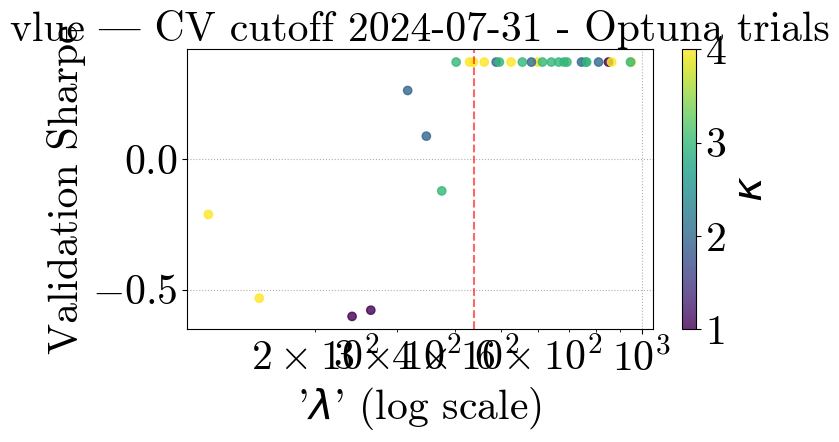

[I 2025-05-05 20:59:25,204] A new study created in memory with name: no-name-52b2bff4-a65f-436a-96fd-2b5502780798
[I 2025-05-05 20:59:26,632] Trial 0 finished with value: 0.6107139296342721 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: 0.6107139296342721.
[I 2025-05-05 20:59:27,862] Trial 1 finished with value: 0.6124424556322926 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 1 with value: 0.6124424556322926.
[I 2025-05-05 20:59:29,301] Trial 2 finished with value: 0.6507171812014994 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 2 with value: 0.6507171812014994.
[I 2025-05-05 20:59:31,402] Trial 3 finished with value: 0.6247450927917476 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 2 with value: 0.6507171812014994.
[I 2025-05-05 20:59:33,194] Trial 4 finished with value: 0.6123626208217989 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is trial 2 w

Optuna best λ=240.4168, κ=1, Sharpe=0.6507


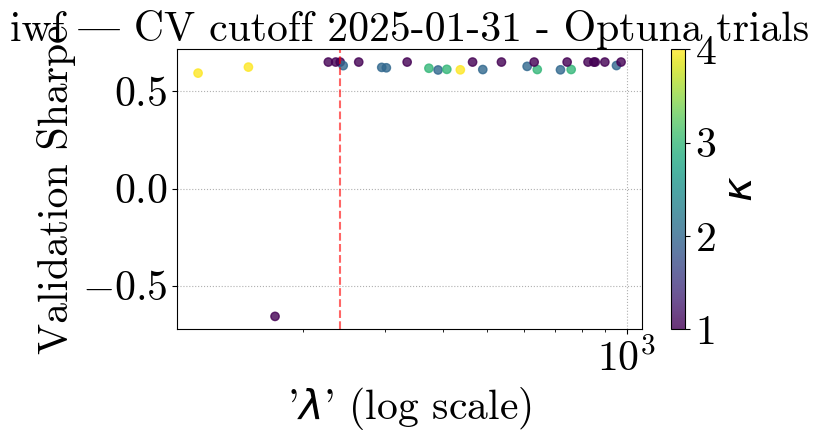

[I 2025-05-05 21:00:15,892] A new study created in memory with name: no-name-980cffed-c812-4242-8aa3-1f2843d82b8f
[I 2025-05-05 21:00:18,249] Trial 0 finished with value: -0.07432325114350817 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: -0.07432325114350817.
[I 2025-05-05 21:00:20,540] Trial 1 finished with value: -0.052573406325524305 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 1 with value: -0.052573406325524305.
[I 2025-05-05 21:00:22,115] Trial 2 finished with value: 0.4402115572510204 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 2 with value: 0.4402115572510204.
[I 2025-05-05 21:00:25,321] Trial 3 finished with value: -7.224621035369724e-05 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 2 with value: 0.4402115572510204.
[I 2025-05-05 21:00:27,862] Trial 4 finished with value: -0.0443827057342661 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Be

Optuna best λ=198.0798, κ=1, Sharpe=0.4417


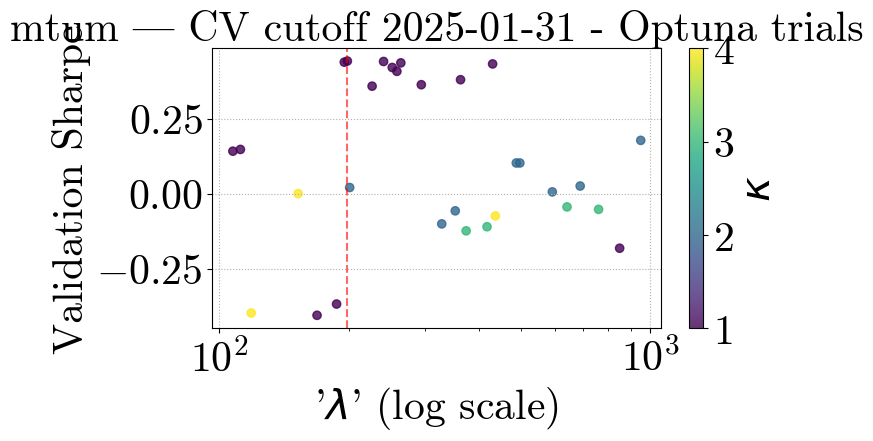

[I 2025-05-05 21:01:26,005] A new study created in memory with name: no-name-4dcc7b59-8fd6-47e5-9717-44191a7afa1e
[I 2025-05-05 21:01:28,178] Trial 0 finished with value: 0.009974268393240945 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: 0.009974268393240945.
[I 2025-05-05 21:01:30,470] Trial 1 finished with value: 0.5890471839277431 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 1 with value: 0.5890471839277431.
[I 2025-05-05 21:01:33,241] Trial 2 finished with value: 0.0818889353854918 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 1 with value: 0.5890471839277431.
[I 2025-05-05 21:01:37,123] Trial 3 finished with value: 0.034770921500916756 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 1 with value: 0.5890471839277431.
[I 2025-05-05 21:01:39,430] Trial 4 finished with value: 0.04732299155327674 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is tr

Optuna best λ=802.7004, κ=2, Sharpe=0.7617


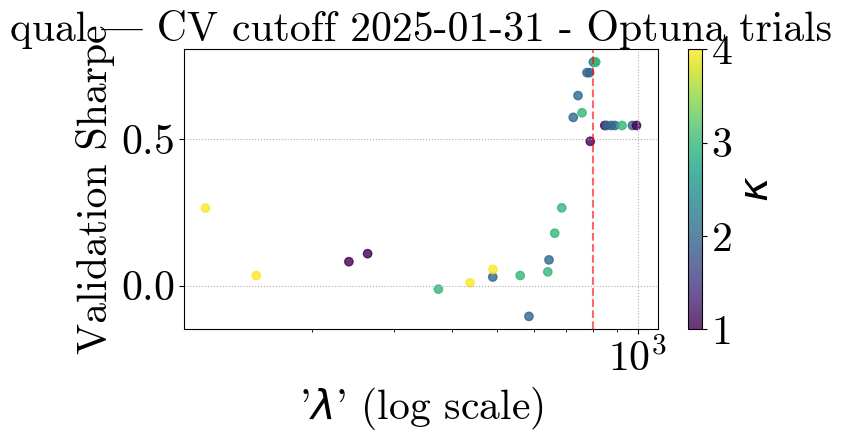

[I 2025-05-05 21:02:28,388] A new study created in memory with name: no-name-4888552a-b3c3-42a5-a938-785f51aac565
[I 2025-05-05 21:02:31,312] Trial 0 finished with value: 0.5807085639718884 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: 0.5807085639718884.
[I 2025-05-05 21:02:31,908] Trial 1 finished with value: 0.5807085639718884 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: 0.5807085639718884.
[I 2025-05-05 21:02:33,632] Trial 2 finished with value: 0.49304943626876613 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 0 with value: 0.5807085639718884.
[I 2025-05-05 21:02:37,906] Trial 3 finished with value: 0.5110507206972184 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 0 with value: 0.5807085639718884.
[I 2025-05-05 21:02:38,374] Trial 4 finished with value: 0.5807085639718884 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is trial 0 

Optuna best λ=437.0861, κ=4, Sharpe=0.5807


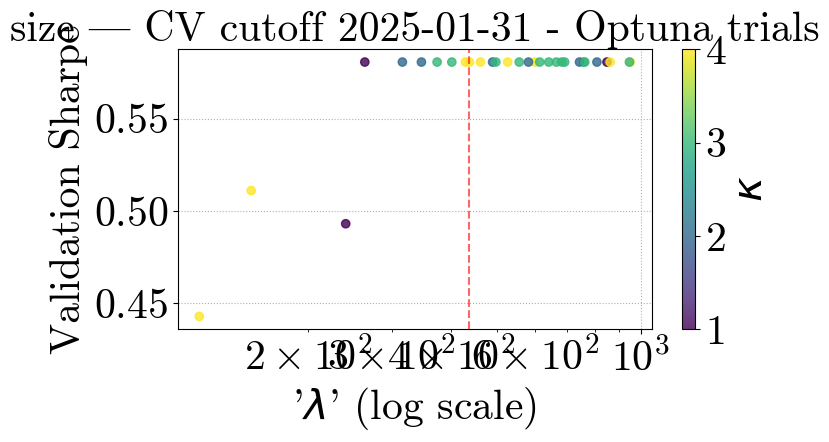

[I 2025-05-05 21:03:24,070] A new study created in memory with name: no-name-d345f7a9-0e7a-4862-978e-eb5db64303e6
[I 2025-05-05 21:03:26,746] Trial 0 finished with value: 0.08167290774729274 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: 0.08167290774729274.
[I 2025-05-05 21:03:28,988] Trial 1 finished with value: 0.21719585681917866 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 1 with value: 0.21719585681917866.
[I 2025-05-05 21:03:31,280] Trial 2 finished with value: 0.3176643663520725 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 2 with value: 0.3176643663520725.
[I 2025-05-05 21:03:34,696] Trial 3 finished with value: 0.7931847776606445 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 3 with value: 0.7931847776606445.
[I 2025-05-05 21:03:37,139] Trial 4 finished with value: 0.21719585681917866 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is tria

Optuna best λ=206.8836, κ=2, Sharpe=0.9282


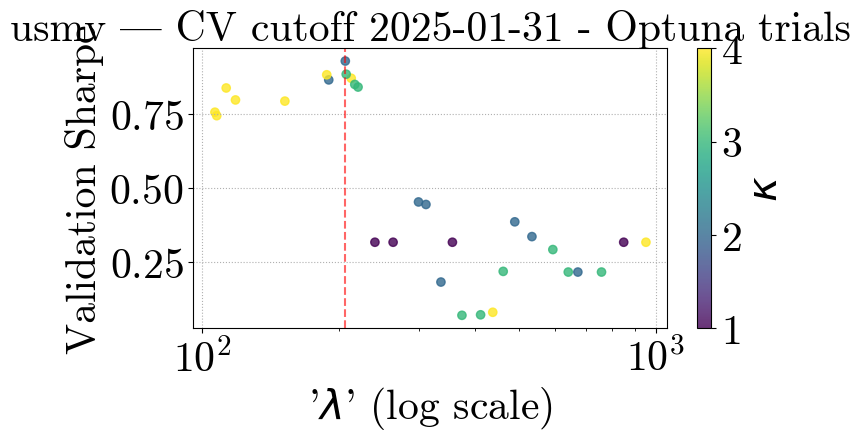

[I 2025-05-05 21:04:43,133] A new study created in memory with name: no-name-0a9eadeb-36b6-4e98-af36-ee61bd253508
[I 2025-05-05 21:04:45,529] Trial 0 finished with value: 0.8703232065642238 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: 0.8703232065642238.
[I 2025-05-05 21:04:47,829] Trial 1 finished with value: 0.8703232065642238 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: 0.8703232065642238.
[I 2025-05-05 21:04:49,976] Trial 2 finished with value: -0.30298536791793557 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 0 with value: 0.8703232065642238.
[I 2025-05-05 21:04:53,291] Trial 3 finished with value: -0.5679834819389786 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 0 with value: 0.8703232065642238.
[I 2025-05-05 21:04:55,467] Trial 4 finished with value: 0.8703232065642238 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is trial 

Optuna best λ=437.0861, κ=4, Sharpe=0.8703


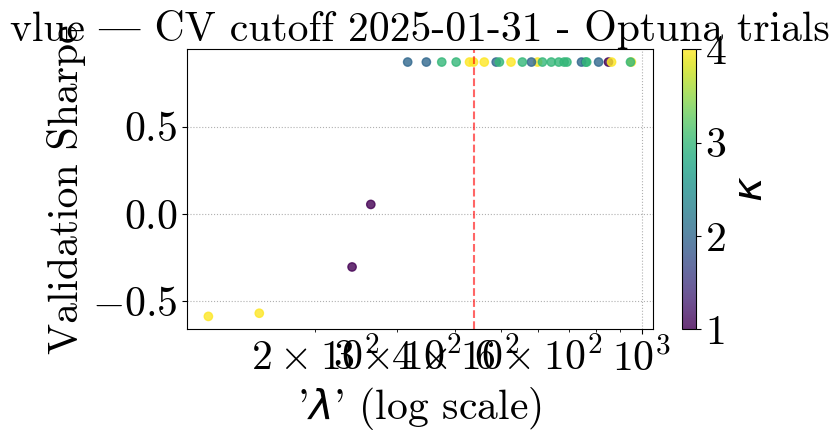

[I 2025-05-05 21:05:56,693] A new study created in memory with name: no-name-63707c97-5f3f-4582-99b1-401c2097f490
[I 2025-05-05 21:05:58,821] Trial 0 finished with value: 0.485740826656017 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: 0.485740826656017.
[I 2025-05-05 21:06:00,831] Trial 1 finished with value: 0.485740826656017 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: 0.485740826656017.
[I 2025-05-05 21:06:02,950] Trial 2 finished with value: 0.48574082665601687 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 0 with value: 0.485740826656017.
[I 2025-05-05 21:06:07,494] Trial 3 finished with value: 0.477185247410705 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 0 with value: 0.485740826656017.
[I 2025-05-05 21:06:09,427] Trial 4 finished with value: 0.485740826656017 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is trial 0 with val

Optuna best λ=437.0861, κ=4, Sharpe=0.4857


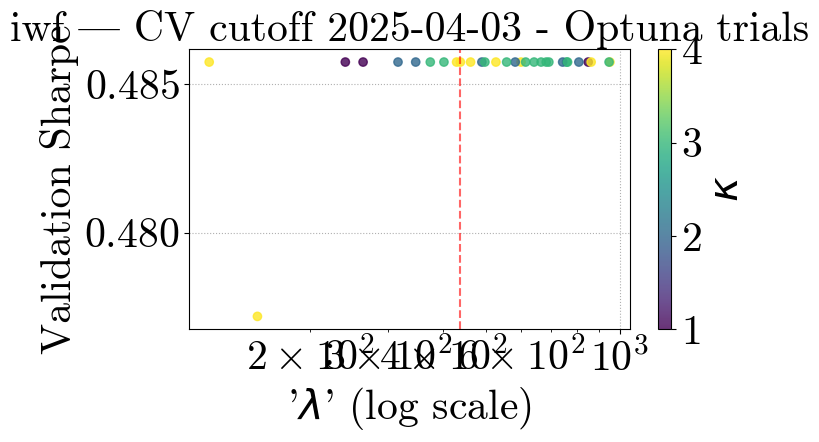

[I 2025-05-05 21:07:06,892] A new study created in memory with name: no-name-3c1079da-26a1-462e-a391-36a27faa4295
[I 2025-05-05 21:07:09,214] Trial 0 finished with value: -0.28310393559687824 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: -0.28310393559687824.
[I 2025-05-05 21:07:11,229] Trial 1 finished with value: -0.2823543641340655 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 1 with value: -0.2823543641340655.
[I 2025-05-05 21:07:12,978] Trial 2 finished with value: -0.2753641600951865 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 2 with value: -0.2753641600951865.
[I 2025-05-05 21:07:19,364] Trial 3 finished with value: 0.13062464028410903 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 3 with value: 0.13062464028410903.
[I 2025-05-05 21:07:21,593] Trial 4 finished with value: -0.18027047770413687 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best 

Optuna best λ=210.8893, κ=4, Sharpe=0.2627


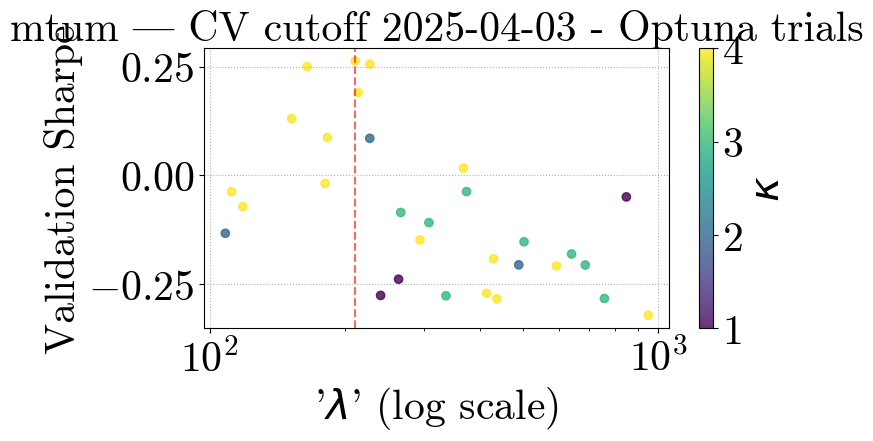

[I 2025-05-05 21:08:52,725] A new study created in memory with name: no-name-122c0982-5c72-4826-8215-e81a1002d04d
[I 2025-05-05 21:08:56,066] Trial 0 finished with value: 0.1730259254361779 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: 0.1730259254361779.
[I 2025-05-05 21:08:56,527] Trial 1 finished with value: 0.7180281425627765 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 1 with value: 0.7180281425627765.
[I 2025-05-05 21:08:58,109] Trial 2 finished with value: -0.3311339290205471 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 1 with value: 0.7180281425627765.
[I 2025-05-05 21:09:00,981] Trial 3 finished with value: 0.7320387044633501 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 3 with value: 0.7320387044633501.
[I 2025-05-05 21:09:02,900] Trial 4 finished with value: 0.8600927229711812 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is trial 4 

Optuna best λ=629.8470, κ=3, Sharpe=0.8996


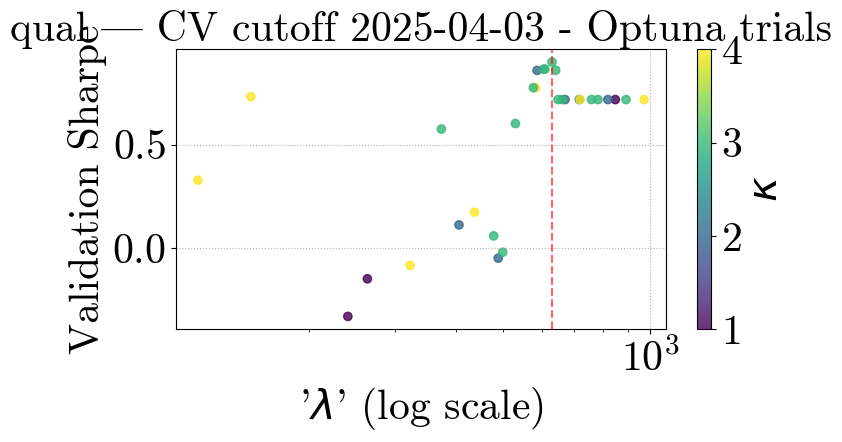

[I 2025-05-05 21:09:57,655] A new study created in memory with name: no-name-6402fa47-9f97-496d-8ffe-cfc2138170c5
[I 2025-05-05 21:10:00,128] Trial 0 finished with value: 0.19736375360833708 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: 0.19736375360833708.
[I 2025-05-05 21:10:00,621] Trial 1 finished with value: 0.19736375360833708 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: 0.19736375360833708.
[I 2025-05-05 21:10:02,356] Trial 2 finished with value: 0.08232201857127201 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 0 with value: 0.19736375360833708.
[I 2025-05-05 21:10:09,238] Trial 3 finished with value: 0.15133401794883627 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 0 with value: 0.19736375360833708.
[I 2025-05-05 21:10:10,015] Trial 4 finished with value: 0.19736375360833708 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is 

Optuna best λ=437.0861, κ=4, Sharpe=0.1974


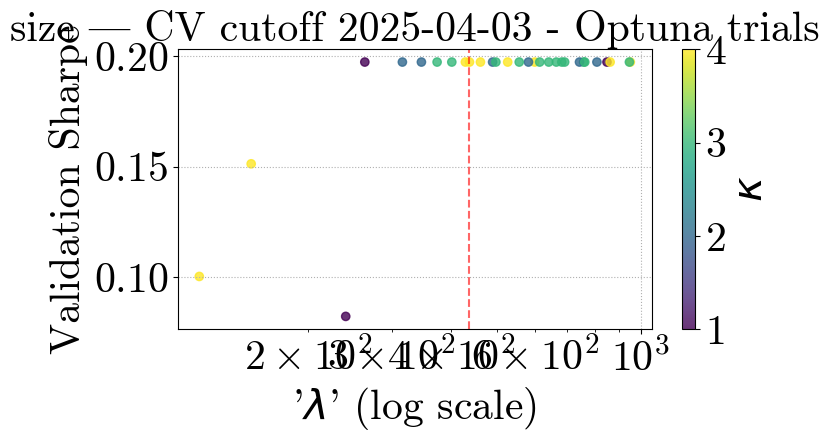

[I 2025-05-05 21:10:53,037] A new study created in memory with name: no-name-21ec6f40-79ef-41e0-a585-3d510aaa234e
[I 2025-05-05 21:10:56,818] Trial 0 finished with value: -0.038076520584220425 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: -0.038076520584220425.
[I 2025-05-05 21:10:57,493] Trial 1 finished with value: -0.03807652058422031 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 1 with value: -0.03807652058422031.
[I 2025-05-05 21:10:59,321] Trial 2 finished with value: -0.03807652058422031 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 1 with value: -0.03807652058422031.
[I 2025-05-05 21:11:03,404] Trial 3 finished with value: 0.7287083172170309 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 3 with value: 0.7287083172170309.
[I 2025-05-05 21:11:04,251] Trial 4 finished with value: -0.03807652058422031 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. B

Optuna best λ=152.2753, κ=4, Sharpe=0.7287


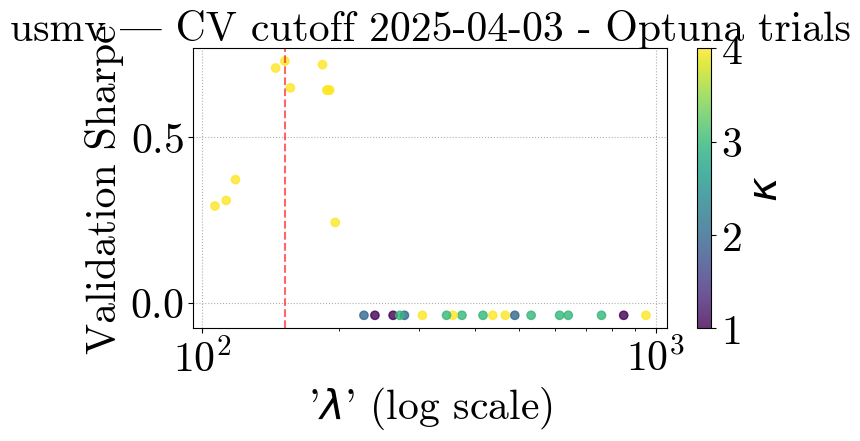

[I 2025-05-05 21:12:26,304] A new study created in memory with name: no-name-3a581dac-8d88-460c-9019-e8933f29326a
[I 2025-05-05 21:12:27,975] Trial 0 finished with value: 0.4798767703593351 and parameters: {'lambda': 437.0861069626262, 'kappa': 4}. Best is trial 0 with value: 0.4798767703593351.
[I 2025-05-05 21:12:29,440] Trial 1 finished with value: 0.4798767703593351 and parameters: {'lambda': 758.7945476302646, 'kappa': 3}. Best is trial 0 with value: 0.4798767703593351.
[I 2025-05-05 21:12:30,739] Trial 2 finished with value: -0.2983636625527776 and parameters: {'lambda': 240.41677639819287, 'kappa': 1}. Best is trial 0 with value: 0.4798767703593351.
[I 2025-05-05 21:12:33,060] Trial 3 finished with value: -1.0104625903997637 and parameters: {'lambda': 152.27525095137952, 'kappa': 4}. Best is trial 0 with value: 0.4798767703593351.
[I 2025-05-05 21:12:34,652] Trial 4 finished with value: 0.4798767703593351 and parameters: {'lambda': 641.0035105688879, 'kappa': 3}. Best is trial 0

Optuna best λ=437.0861, κ=4, Sharpe=0.4799


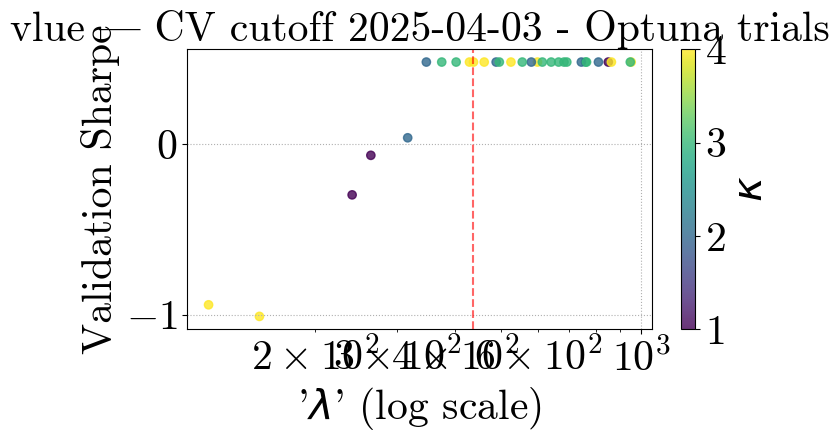

/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_51250/647855273.py:123: UserWarning: Glyph 8212 (\N{EM DASH}) missing from font(s) cmr10.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 8212 (\N{EM DASH}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


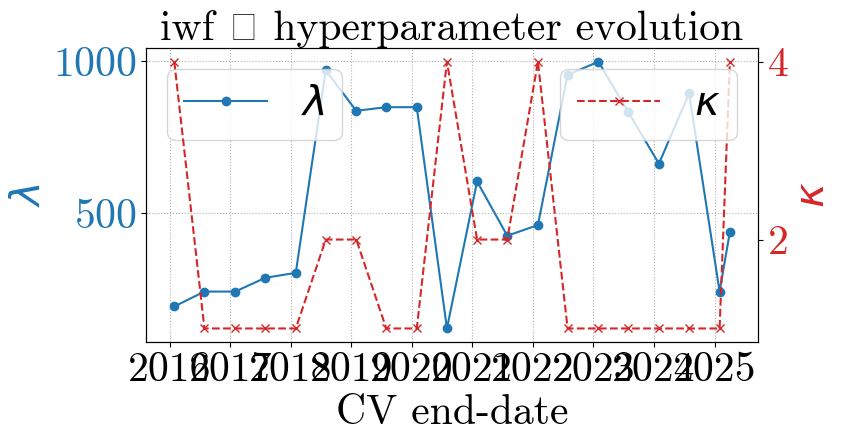

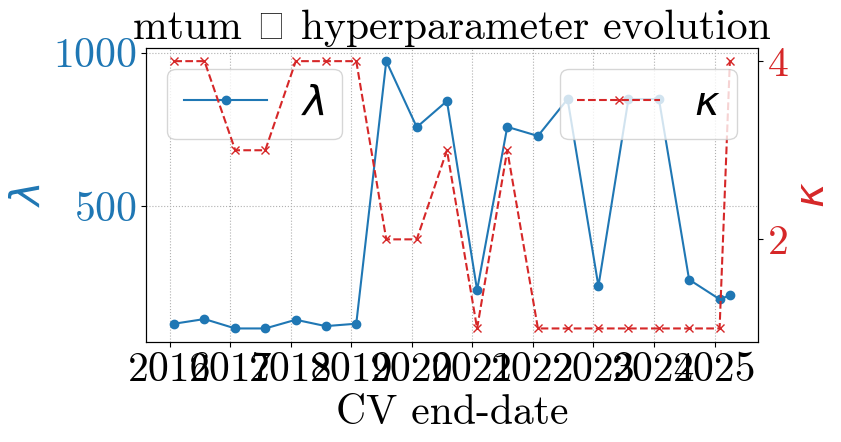

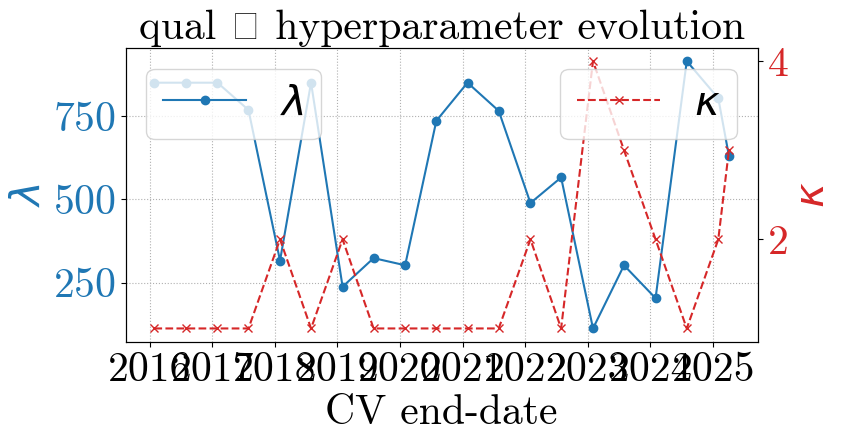

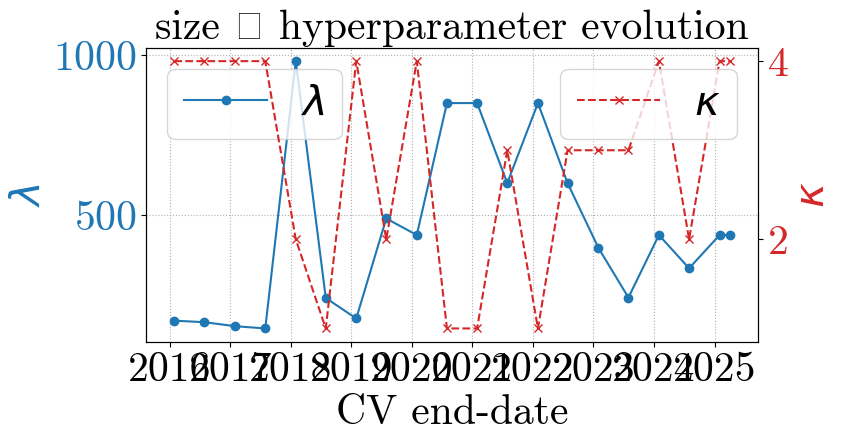

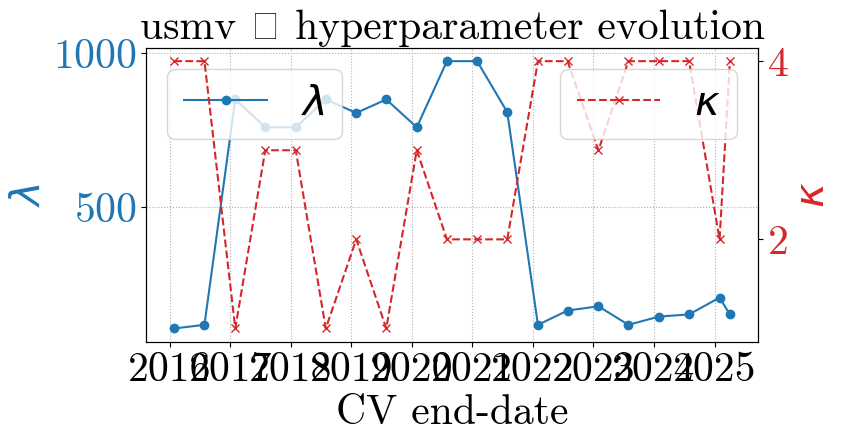

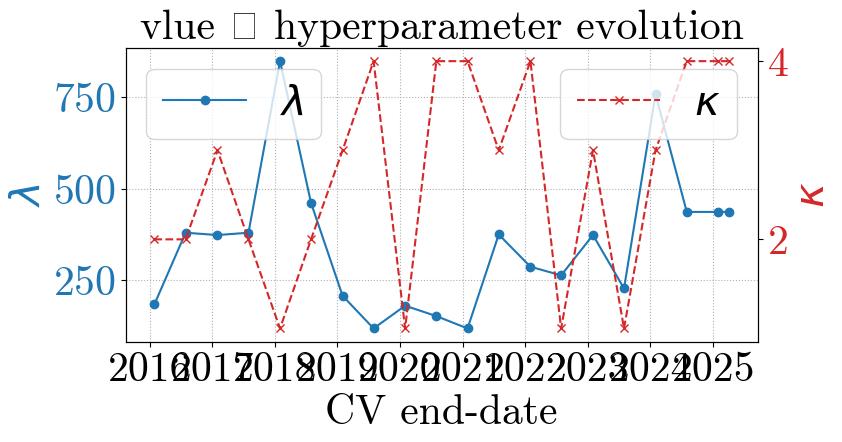

Saved tuned parameters to cv_params.parquet
         date factor  best_lambda  best_kappa
0  2016-01-29    iwf   191.150754           4
6  2016-07-29    iwf   240.416776           1
12 2017-01-31    iwf   240.416776           1
18 2017-07-31    iwf   285.870049           1
24 2018-01-31    iwf   302.205931           1


In [5]:
# -------------------------  QUICK STAND‑ALONE RUN  ----------------------- #
# ---- user‑specific setup (exactly as in your original script) -------- #

# Paths & tickers -----------------------------------------------------------------------
TEST_START       = "2016-01-01"
RECROSS_VAL_FREQ = "6ME"          # six‑month‑end


script_dir = os.getcwd()
base_dir   = os.path.abspath(os.path.join(script_dir, "..", ".."))
data_dir   = os.path.join(base_dir, "data_new")

factor_file = os.path.join(data_dir, "1estimation_index_returns.csv")
market_file = os.path.join(data_dir, "1macro_data.csv")
etf_file    = os.path.join(data_dir, "2trading_etf_returns_aligned.csv")

factors = ["iwf", "mtum", "qual", "size", "usmv", "vlue"]   

# lambda_values = np.linspace(30, 400, 5)
# # kappa grid can depend on feature count; a simple fixed grid is fine
# kappa_values  = np.array([2.0, 3.0, 4.0]) # kappa = trial.suggest_int("kappa", 1, np.sqrt(17))

# ------- load full data into factor_data_dict here -------------------- #
# (use your existing MergedDataLoader logic)
factor_data_dict = {}
for fac in factors:
    data = MergedDataLoader(
                factor_file=factor_file,
                market_file=market_file,
                ver="v2",
                factor_col=fac).load()

    common_idx = (data.X.index
                    .intersection(data.ret_ser.index)
                    .intersection(data.market_ser.index))

    factor_data_dict[fac] = {
        "X":       data.X.loc[common_idx],
        "fac_ret": data.ret_ser.loc[common_idx],
        "mkt_ret": data.market_ser.loc[common_idx],
    }


master_index = factor_data_dict[factors[0]]["X"].index.sort_values()
test_index   = master_index[master_index >= TEST_START]

recross_val_boundaries = (
    test_index.to_series()
    .resample(RECROSS_VAL_FREQ)
    .last()
    .dropna()                     # Series of Timestamp objects
)
# ----------------------------------------------------------------------

cv_table = run_cv(
    factors,
    factor_data_dict,
    cv_dates=recross_val_boundaries,
    initial_train_start="2002-05-31"
)

print("Saved tuned parameters to cv_params.parquet")
print(cv_table.head())

In [ ]:
# # 1) Cast kappa to float
# cv_table["best_kappa"] = cv_table["best_kappa"].astype(float)

# # 2) (Optional) verify
# print(cv_table.dtypes)

# # 3) Save out
# cv_table.to_parquet("cv_params_bayes_v2.parquet", index=False) # v2 is the one searching from 0.1 to 1000


date           datetime64[ns]
factor                 object
best_lambda           float64
best_kappa            float64
dtype: object


In [5]:
with open("cell_output.txt", "w") as f:
    for r in records:  # or whatever your output list is
        f.write(str(r) + "\n")


NameError: name 'records' is not defined